In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import os
os.getcwd()

'/content'

In [3]:
os.chdir('/content/drive/MyDrive')
print(os.getcwd())

/content/drive/MyDrive


In [4]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.utils import shuffle
import itertools
import re

def read_csv(path):
    return pd.read_csv(path, header=None, delimiter=r"\s+")

def reindex(df, new_idx):
    return df.loc[new_idx].reset_index(drop=True)

#loading the features' names (each line ends with the \n special char)
with open('UCI HAR Dataset/features.txt', 'r') as f:
    columns = [el.rstrip('\n') for el in f.readlines()] 
    
#opening the training files
labels_train = read_csv('UCI HAR Dataset/train/y_train.txt')
ind_train = read_csv('UCI HAR Dataset/train/subject_train.txt')
df_train = read_csv('UCI HAR Dataset/train/X_train.txt')
df_train.columns = columns

#opening the test files
labels_test = read_csv('UCI HAR Dataset/test/y_test.txt')
ind_test = read_csv('UCI HAR Dataset/test/subject_test.txt')
df_test = read_csv('UCI HAR Dataset/test/X_test.txt')
df_test.columns = columns

#shuffling the training set
train_indices_shuffle = shuffle(df_train.index, random_state=42)
    
labels_train = reindex(labels_train, train_indices_shuffle)
ind_train = reindex(ind_train, train_indices_shuffle)
df_train = reindex(df_train, train_indices_shuffle)

#shuffling the test set
test_indices_shuffle = shuffle(df_test.index, random_state=42)

labels_test = reindex(labels_test, test_indices_shuffle)
ind_test = reindex(ind_test, test_indices_shuffle)
df_test = reindex(df_test, test_indices_shuffle)

#concatenate training and test set for the EDA
df = pd.concat([df_train, df_test], ignore_index=True)
individuals = pd.concat([ind_train, ind_test], ignore_index=True)
labels = pd.concat([labels_train, labels_test], ignore_index=True)

#remapping the labels to their meaning to enhance readability (info were in )
with open('UCI HAR Dataset/activity_labels.txt', 'r') as f:
    act_lab = dict(el.strip().split(' ') for el in f.readlines())
to_remap = labels[0]
remap_dict = dict((int(k), v) for k, v in act_lab.items())
remapped_labels = [remap_dict.get(number, number) for number in to_remap]
print(remap_dict)

#inserting the the column of the feature labels as the first column
df.insert(loc=0, column='label', value=remapped_labels)
df.insert(loc=1, column='individuals', value=individuals.values)
df

{1: 'WALKING', 2: 'WALKING_UPSTAIRS', 3: 'WALKING_DOWNSTAIRS', 4: 'SITTING', 5: 'STANDING', 6: 'LAYING'}


,label,individuals,1 tBodyAcc-mean()-X,2 tBodyAcc-mean()-Y,3 tBodyAcc-mean()-Z,4 tBodyAcc-std()-X,5 tBodyAcc-std()-Y,6 tBodyAcc-std()-Z,7 tBodyAcc-mad()-X,8 tBodyAcc-mad()-Y,...,552 fBodyBodyGyroJerkMag-meanFreq(),553 fBodyBodyGyroJerkMag-skewness(),554 fBodyBodyGyroJerkMag-kurtosis(),"555 angle(tBodyAccMean,gravity)","556 angle(tBodyAccJerkMean),gravityMean)","557 angle(tBodyGyroMean,gravityMean)","558 angle(tBodyGyroJerkMean,gravityMean)","559 angle(X,gravityMean)","560 angle(Y,gravityMean)","561 angle(Z,gravityMean)"
0,WALKING_DOWNSTAIRS,22,0.283203,-0.047024,-0.168986,0.384949,0.176898,-0.310332,0.381757,0.122611,...,0.454181,-0.730593,-0.932568,-0.034924,0.558036,0.258975,-0.854858,-0.784330,0.222960,-0.066506
1,WALKING_DOWNSTAIRS,7,0.256904,-0.036623,-0.133856,0.201409,-0.154142,0.344183,0.092771,-0.182114,...,0.190745,-0.032958,-0.338095,0.017986,-0.475545,0.942947,-0.567147,-0.665156,0.178975,0.243362
2,WALKING,27,0.291316,-0.001065,-0.072461,-0.336609,-0.279162,-0.303323,-0.381421,-0.253026,...,0.299767,-0.351997,-0.698254,-0.044663,-0.551806,-0.680774,0.161405,-0.857202,0.192929,0.046716
3,SITTING,21,0.276116,-0.010909,-0.102886,-0.992196,-0.982169,-0.981127,-0.992838,-0.981366,...,0.335848,-0.623358,-0.906098,-0.177275,-0.309304,0.176515,-0.143818,-0.625215,-0.106678,-0.147469
4,WALKING_DOWNSTAIRS,29,0.256382,0.000428,-0.113664,0.075014,0.046502,-0.369482,-0.024794,-0.085337,...,-0.125979,0.020630,-0.316113,0.347143,0.590475,0.831084,0.465453,-0.860617,0.150598,-0.067109
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10294,WALKING_DOWNSTAIRS,13,0.292039,-0.035134,-0.117411,-0.260440,-0.193546,-0.064250,-0.312324,-0.217437,...,0.286318,-0.280561,-0.695950,-0.332066,-0.561590,0.945470,-0.928404,-0.718846,0.224618,0.170227
10295,SITTING,10,0.271481,-0.029868,-0.102405,-0.987217,-0.949080,-0.940076,-0.989122,-0.950866,...,0.407022,-0.797020,-0.952278,0.031676,-0.180739,0.676657,-0.531927,-0.860490,0.186200,-0.023345
10296,LAYING,10,0.294096,-0.018892,-0.113226,-0.985394,-0.988332,-0.989880,-0.987072,-0.987738,...,0.279598,-0.437664,-0.792397,-0.089646,0.086379,0.094172,-0.854682,0.549338,0.998808,-0.186375
10297,WALKING,12,0.355514,0.008594,-0.129580,-0.224597,-0.270375,-0.228999,-0.221162,-0.340813,...,0.136430,0.200476,-0.052176,-0.451643,0.527396,0.719527,0.314826,-0.873733,0.182817,0.040213


# Data Understanding and Preparation

In [5]:
individual_loop = sorted(df['individuals'].unique()) #to loop over individuals
label_loop = sorted(df['label'].unique()) #to loop over actions
label_loop

['LAYING',
 'SITTING',
 'STANDING',
 'WALKING',
 'WALKING_DOWNSTAIRS',
 'WALKING_UPSTAIRS']

In [6]:
df.describe()

,individuals,1 tBodyAcc-mean()-X,2 tBodyAcc-mean()-Y,3 tBodyAcc-mean()-Z,4 tBodyAcc-std()-X,5 tBodyAcc-std()-Y,6 tBodyAcc-std()-Z,7 tBodyAcc-mad()-X,8 tBodyAcc-mad()-Y,9 tBodyAcc-mad()-Z,...,552 fBodyBodyGyroJerkMag-meanFreq(),553 fBodyBodyGyroJerkMag-skewness(),554 fBodyBodyGyroJerkMag-kurtosis(),"555 angle(tBodyAccMean,gravity)","556 angle(tBodyAccJerkMean),gravityMean)","557 angle(tBodyGyroMean,gravityMean)","558 angle(tBodyGyroJerkMean,gravityMean)","559 angle(X,gravityMean)","560 angle(Y,gravityMean)","561 angle(Z,gravityMean)"
count,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,...,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000
mean,16.146422,0.274347,-0.017743,-0.108925,-0.607784,-0.510191,-0.613064,-0.633593,-0.525697,-0.614989,...,0.126708,-0.298592,-0.617700,0.007705,0.002648,0.017683,-0.009219,-0.496522,0.063255,-0.054284
std,8.679067,0.067628,0.037128,0.053033,0.438694,0.500240,0.403657,0.413333,0.484201,0.399034,...,0.245443,0.320199,0.308796,0.336591,0.447364,0.616188,0.484770,0.511158,0.305468,0.268898
min,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,9.000000,0.262625,-0.024902,-0.121019,-0.992360,-0.976990,-0.979137,-0.993293,-0.977017,-0.979064,...,-0.019481,-0.536174,-0.841847,-0.124694,-0.287031,-0.493108,-0.389041,-0.817288,0.002151,-0.131880
50%,17.000000,0.277174,-0.017162,-0.108596,-0.943030,-0.835032,-0.850773,-0.948244,-0.843670,-0.845068,...,0.136245,-0.335160,-0.703402,0.008146,0.007668,0.017192,-0.007186,-0.715631,0.182028,-0.003882
75%,24.000000,0.288354,-0.010625,-0.097589,-0.250293,-0.057336,-0.278737,-0.302033,-0.087405,-0.288149,...,0.288960,-0.113167,-0.487981,0.149005,0.291490,0.536137,0.365996,-0.521503,0.250790,0.102970
max,30.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


The data are clearly already preprocessed and normalized in a range [-1, +1]

<font size = "5">Counting the records with respect to individuals and labels</font>

In [7]:
#training set
df_train.values.shape

(7352, 561)

In [8]:
#test set
df_test.values.shape

(2947, 561)

In [9]:
#checking if individuals are 30 as stated in the readme
len(individual_loop)

30

In [10]:
#to count and show quickly the unique elements of a collection
def count_unique(collection):
    unreadable_count = np.unique(collection, return_counts=True)
    readable_count = dict(zip(*list(unreadable_count)))
    return readable_count

In [11]:
#count of labels of the dataset
print(count_unique(df['label']))

{'LAYING': 1944, 'SITTING': 1777, 'STANDING': 1906, 'WALKING': 1722, 'WALKING_DOWNSTAIRS': 1406, 'WALKING_UPSTAIRS': 1544}


In [12]:
#count of individuals of the dataset
print(count_unique(df['individuals']))

{1: 347, 2: 302, 3: 341, 4: 317, 5: 302, 6: 325, 7: 308, 8: 281, 9: 288, 10: 294, 11: 316, 12: 320, 13: 327, 14: 323, 15: 328, 16: 366, 17: 368, 18: 364, 19: 360, 20: 354, 21: 408, 22: 321, 23: 372, 24: 381, 25: 409, 26: 392, 27: 376, 28: 382, 29: 344, 30: 383}


In [13]:
#checking activity records for each individual
act_ind_records = {}
for ind in individual_loop:
    activity_dict = {}
    for act in label_loop:
        temp = df[df['individuals'] == ind]
        activity_dict[act] = len(temp[temp['label'] == act])
    act_ind_records["IND "+str(ind)] = activity_dict
value_counted_df = pd.DataFrame(act_ind_records)
total_by_activity = [value_counted_df.iloc[i].sum() for i in range(len(label_loop))]
value_counted_df['Tot_by_Act'] = total_by_activity
total_by_individual = [value_counted_df[col].sum() for col in value_counted_df.columns]
value_counted_df.loc['Tot_by_Ind'] = total_by_individual
value_counted_df

,IND 1,IND 2,IND 3,IND 4,IND 5,IND 6,IND 7,IND 8,IND 9,IND 10,...,IND 22,IND 23,IND 24,IND 25,IND 26,IND 27,IND 28,IND 29,IND 30,Tot_by_Act
LAYING,50,48,62,54,52,57,52,54,50,58,...,72,72,72,73,76,74,80,69,70,1944
SITTING,47,46,52,50,44,55,48,46,50,54,...,62,68,68,65,78,70,72,60,62,1777
STANDING,53,54,61,56,56,57,53,54,45,44,...,63,68,69,74,74,80,79,65,59,1906
WALKING,95,59,58,60,56,57,57,48,52,53,...,46,59,58,74,59,57,54,53,65,1722
WALKING_DOWNSTAIRS,49,47,49,45,47,48,47,38,42,38,...,36,54,55,58,50,44,46,48,62,1406
WALKING_UPSTAIRS,53,48,59,52,47,51,51,41,49,47,...,42,51,59,65,55,51,51,49,65,1544
Tot_by_Ind,347,302,341,317,302,325,308,281,288,294,...,321,372,381,409,392,376,382,344,383,10299


The data also seems to be balanced

<BarContainer object of 30 artists>

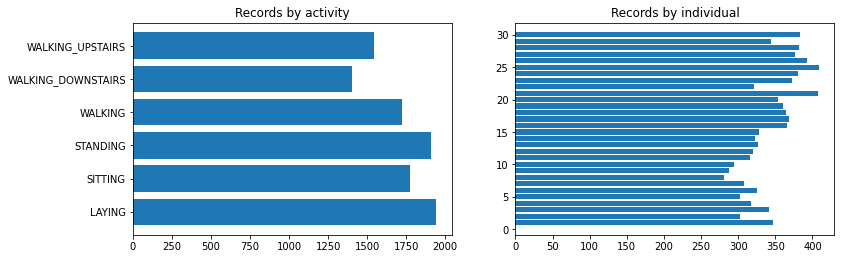

In [14]:
#visualize balance between records by activity and by individual
fig = plt.subplots(figsize=(40, 32))
fig_dims = (7, 6)

plt.subplot2grid(fig_dims, (0, 0), title='Records by activity')
plt.barh(label_loop, value_counted_df['Tot_by_Act'][:-1])
plt.subplot2grid(fig_dims, (0, 1), title='Records by individual')
plt.barh(individual_loop, value_counted_df.loc['Tot_by_Ind'][:-1])

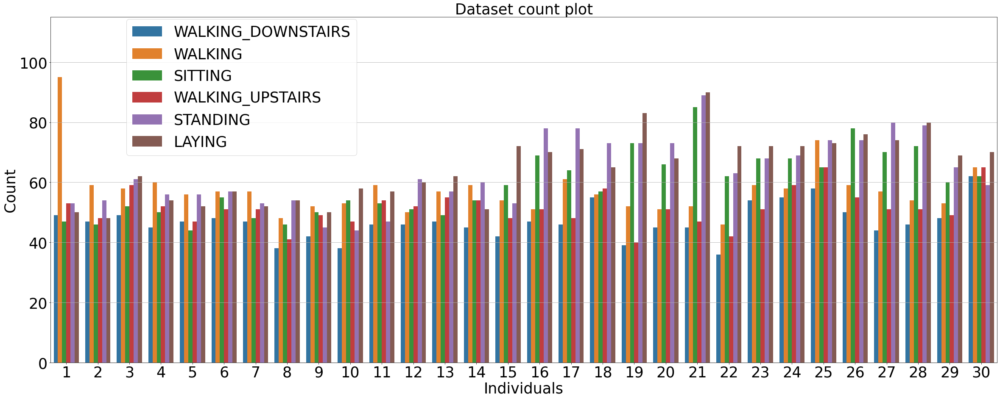

In [15]:
plt.figure(figsize=(40,15))
plt.grid()
#sns.set(rc={'figure.figsize':(40,15)}, font_scale=3) #to fix the scaling of the plot
sns.countplot(x="individuals", hue="label", data=df)
plt.title('Dataset count plot',fontsize=35)
plt.xlabel('Individuals',fontsize=35)
plt.ylabel('Count',fontsize=35)
plt.xticks(fontsize=35)
plt.yticks(fontsize=35)
plt.ylim(0, 115)
plt.legend(loc=(0.08,0.60), fontsize=35)
plt.show()

plt.style.use('default') #otherwise the rest of the plots take seaborn style

In [16]:
#I may need them to balance out the values, maybe
min_value_ts = value_counted_df.min().min()
max_value_ts = value_counted_df[:-1].T[:-1].T.max().max()
print("Minimum number of records (individual-w-action): {}\nMaximum number of records (individual-w-action): {}".format(min_value_ts, max_value_ts))

Minimum number of records (individual-w-action): 36
Maximum number of records (individual-w-action): 95


In [17]:
#checking the correspondence of the test set concatenated to the complete dataset with the original test set
check_index = df_test.index+len(df_train)
check_df = df.loc[check_index].drop(columns=['label', 'individuals'])
check_df.reset_index(drop=True, inplace=True)

for i in range(len(df_test)):
    if (df_test.loc[i] != check_df.loc[i]).sum() >= 1:
        raise Exception("Values do not corresponds at index {}".format(i))

<font size = "5">Checking if there are some missing or duplicate values</font>

In [18]:
#printing the columns with missing values
for col in df.columns:
    if df[df[col].isnull()].values.size > 0: #if there are some missing value the array is non null therefore with a size > 0
        print(col)

In [19]:
#double checking that the sum is really zero for missing values
print(df.isnull().sum().sum())

0


Checking n° DUPLICATE ROWS (it should be impossible for records to be the same all across different features in principle, if that's the case it is certainly an error)

In [20]:
print(df.duplicated().sum())

0


Checking n° of DUPLICATE COLUMNS (if some columns are duplicates it may be relevant to consider to remove them during the feature selection as some algorithm may give double the weight to the values in that column)

In [21]:
print(df.T.duplicated().sum())

21


In [22]:
#printing the features which are duplicated
col_dup = df.columns[df.T.duplicated()]
print('Duplicate columns: ', len(col_dup))
col_dup

Duplicate columns:  21


Index(['206 tBodyAccMag-sma()', '214 tGravityAccMag-mean()',
       '215 tGravityAccMag-std()', '216 tGravityAccMag-mad()',
       '217 tGravityAccMag-max()', '218 tGravityAccMag-min()',
       '219 tGravityAccMag-sma()', '220 tGravityAccMag-energy()',
       '221 tGravityAccMag-iqr()', '222 tGravityAccMag-entropy()',
       '223 tGravityAccMag-arCoeff()1', '224 tGravityAccMag-arCoeff()2',
       '225 tGravityAccMag-arCoeff()3', '226 tGravityAccMag-arCoeff()4',
       '232 tBodyAccJerkMag-sma()', '245 tBodyGyroMag-sma()',
       '258 tBodyGyroJerkMag-sma()', '508 fBodyAccMag-sma()',
       '521 fBodyBodyAccJerkMag-sma()', '534 fBodyBodyGyroMag-sma()',
       '547 fBodyBodyGyroJerkMag-sma()'],
      dtype='object')

In [23]:
#adding the column excluded by the algorithm of pd.DataFrame.duplicated()
#it exclude the first column it finds labeling as unique
#by reversing the indices of columns it will find that column as last
reversed_df = df[reversed(df.columns)]
col_dup_reverse = reversed_df.columns[reversed_df.T.duplicated()]
print('Duplicate columns (reverse): ', len(col_dup_reverse))
col_dup_reverse

Duplicate columns (reverse):  21


Index(['542 fBodyBodyGyroJerkMag-mean()', '529 fBodyBodyGyroMag-mean()',
       '516 fBodyBodyAccJerkMag-mean()', '503 fBodyAccMag-mean()',
       '253 tBodyGyroJerkMag-mean()', '240 tBodyGyroMag-mean()',
       '227 tBodyAccJerkMag-mean()', '214 tGravityAccMag-mean()',
       '213 tBodyAccMag-arCoeff()4', '212 tBodyAccMag-arCoeff()3',
       '211 tBodyAccMag-arCoeff()2', '210 tBodyAccMag-arCoeff()1',
       '209 tBodyAccMag-entropy()', '208 tBodyAccMag-iqr()',
       '207 tBodyAccMag-energy()', '206 tBodyAccMag-sma()',
       '205 tBodyAccMag-min()', '204 tBodyAccMag-max()',
       '203 tBodyAccMag-mad()', '202 tBodyAccMag-std()',
       '201 tBodyAccMag-mean()'],
      dtype='object')

In [24]:
#now combining the lists
duplicate_columns = sorted(list(set(col_dup.tolist()+col_dup_reverse.tolist())))
print('Total duplicate columns: ', len(duplicate_columns))
print()
print(duplicate_columns)

Total duplicate columns:  40

['201 tBodyAccMag-mean()', '202 tBodyAccMag-std()', '203 tBodyAccMag-mad()', '204 tBodyAccMag-max()', '205 tBodyAccMag-min()', '206 tBodyAccMag-sma()', '207 tBodyAccMag-energy()', '208 tBodyAccMag-iqr()', '209 tBodyAccMag-entropy()', '210 tBodyAccMag-arCoeff()1', '211 tBodyAccMag-arCoeff()2', '212 tBodyAccMag-arCoeff()3', '213 tBodyAccMag-arCoeff()4', '214 tGravityAccMag-mean()', '215 tGravityAccMag-std()', '216 tGravityAccMag-mad()', '217 tGravityAccMag-max()', '218 tGravityAccMag-min()', '219 tGravityAccMag-sma()', '220 tGravityAccMag-energy()', '221 tGravityAccMag-iqr()', '222 tGravityAccMag-entropy()', '223 tGravityAccMag-arCoeff()1', '224 tGravityAccMag-arCoeff()2', '225 tGravityAccMag-arCoeff()3', '226 tGravityAccMag-arCoeff()4', '227 tBodyAccJerkMag-mean()', '232 tBodyAccJerkMag-sma()', '240 tBodyGyroMag-mean()', '245 tBodyGyroMag-sma()', '253 tBodyGyroJerkMag-mean()', '258 tBodyGyroJerkMag-sma()', '503 fBodyAccMag-mean()', '508 fBodyAccMag-sma()', 

In [25]:
#I looked intuitively and it seems the similarity may lay with these measures
df[['205 tBodyAccMag-min()', '218 tGravityAccMag-min()', 
    '542 fBodyBodyGyroJerkMag-mean()', '547 fBodyBodyGyroJerkMag-sma()']]

,205 tBodyAccMag-min(),218 tGravityAccMag-min(),542 fBodyBodyGyroJerkMag-mean(),547 fBodyBodyGyroJerkMag-sma()
0,-0.700588,-0.700588,-0.566347,-0.566347
1,-0.635011,-0.635011,-0.033715,-0.033715
2,-0.648915,-0.648915,-0.713980,-0.713980
3,-0.989555,-0.989555,-0.993852,-0.993852
4,-0.685934,-0.685934,-0.596129,-0.596129
...,...,...,...,...
10294,-0.818067,-0.818067,-0.080516,-0.080516
10295,-0.996075,-0.996075,-0.985553,-0.985553
10296,-0.993478,-0.993478,-0.978329,-0.978329
10297,-0.592682,-0.592682,-0.647183,-0.647183


It seems the majority of duplicates come from aggregate measures linked to the body and gravity acceleration signlas obtained through the Butterworth filter, intuitively I looked if the identical measures were in the ranges of the Body and Gravity Acceleration split. </br></br>
It also seems the Fast Fourier Transformation didn't generate many duplicate columns as it is with the time domain and the presence of duplicates is due to the similarity of calculation between the mean and the signal magnitude area. </br></br>
Hereunder I built the table to understand how many reference to the keyword selected were present in the duplicate columns

In [26]:
scan_idx = ['Gravity', 'BodyAcc', 'Gyro', 'Jerk', ' t', ' f']
scan_df = [[len([el for el in col if search in el]) for col in [col_dup, col_dup_reverse, duplicate_columns]] for search in scan_idx]
scan_df = pd.DataFrame(scan_df, index=scan_idx[:-2]+['Time domain', 'Frequency domain'], columns=['Firs Scan', 'Reverse Scan', 'Total Scan'])
scan_df

,Firs Scan,Reverse Scan,Total Scan
Gravity,13,1,13
BodyAcc,4,16,19
Gyro,4,4,8
Jerk,4,4,8
Time domain,17,17,32
Frequency domain,4,4,8


In [27]:
#extracting correlations with a value beyond a threshold
correlation = df.corr()
extract_threshold = 0.90

correl_extraction = {}
for col in correlation.columns:
    val = correlation.loc[abs(correlation[col]) > extract_threshold][col]
    if val.values.size > 1:
        correl_extraction[col] = [(x, val[x]) for x in val.index]
len(correl_extraction)

429

<font size = "5">Visualising some variables</font>

Visualizing some variables. I did this plot to check possible differential patterns by plotting 2 variables I later found with the decision tree. I also plotted dividing by stationary and moving state as they appeared correlated by looking at the data

In [28]:
val_to_plot = '10 tBodyAcc-max()-X'
val_y_to_plot = '53 tGravityAcc-min()-X'

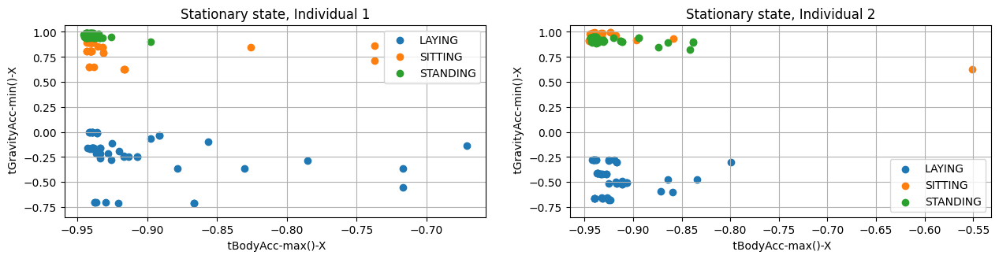

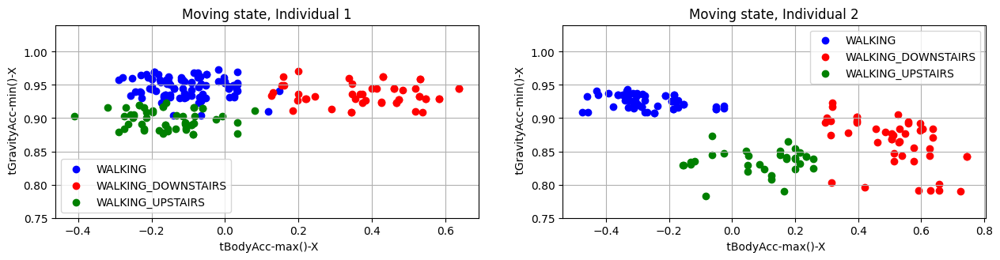

In [29]:
for x, state in {(0, 3) : 'stationary', (3, 6) : 'moving'}.items(): #in order to plot over two groups of variable separately 
    fig = plt.subplots(figsize=(40, 26))
    fig_dims = (7, 5)

    for colonna, ind in enumerate(individual_loop[0:2]):
        max_col = 2 #the max number of columns I want to plot
        righe = colonna//max_col #so that the rows stay proportional to the columns
        if colonna > max_col-1: 
            colonna -= max_col*righe #so that if it goes beyond the values of columns it redefine the index of column
        
        plt.subplot2grid(fig_dims, (righe, colonna), title="{} state, Individual {}".format(state[0].upper()+state[1:], str(ind)))

        for act in label_loop[x[0]:x[1]]:
            temp_ind = df[df['individuals'] == ind]
            temp_act = temp_ind[temp_ind['label'] == act]
            xdata = temp_act[val_to_plot]
            ydata = temp_act[val_y_to_plot]
            
            if state == 'stationary':
                plt.scatter(xdata, ydata, label = act)
                plt.ylim(-0.85, 1.07)
            else:
                colordict = {'WALKING':'blue', 'WALKING_DOWNSTAIRS':'red', 'WALKING_UPSTAIRS':'green'}
                plt.scatter(xdata, ydata, label = act, color=colordict[act])
                plt.ylim(0.75, 1.04)
            plt.xlabel(val_to_plot[2:])
            plt.ylabel(val_y_to_plot[2:])
            plt.grid()
        plt.legend()
    plt.show()

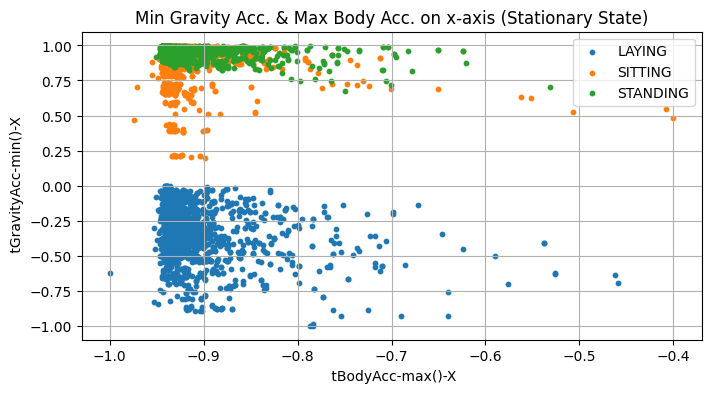

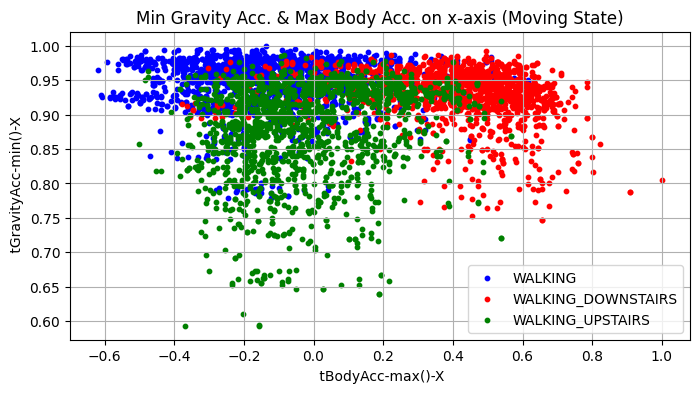

In [30]:
for x, state in {(0, 3) : 'stationary', (3, 6) : 'moving'}.items(): #in order to plot over two groups of variable separately 
    fig = plt.subplots(figsize=(8, 4))
    for act in label_loop[x[0]:x[1]]:
        temp_act = df[df['label'] == act]
        xdata = temp_act[val_to_plot]
        ydata = temp_act[val_y_to_plot]

        if state == 'stationary':
            plt.scatter(xdata, ydata, label = act, s=10)
        else:
            colordict = {'WALKING':'blue', 'WALKING_DOWNSTAIRS':'red', 'WALKING_UPSTAIRS':'green'}
            plt.scatter(xdata, ydata, label = act, color=colordict[act], s=10)
        plt.title('Min Gravity Acc. & Max Body Acc. on x-axis ({} State)'.format(state[0].upper()+state[1:]))
        plt.xlabel(val_to_plot[2:])
        plt.ylabel(val_y_to_plot[2:])
        plt.grid()
        plt.legend()

<font size = "5">Extracting feature importance from the decision tree</font>

In [31]:
#as a reference the original target variables with the original split
y_train, y_test = labels_train.copy(deep=True), labels_test.copy(deep=True)

Predicting LAYING with the Desision Tree:
Area Under the Curve (ROC):  1.0
Confusion Matrix:
 [[ 537    0]
 [   0 2410]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2410
           1       1.00      1.00      1.00       537

    accuracy                           1.00      2947
   macro avg       1.00      1.00      1.00      2947
weighted avg       1.00      1.00      1.00      2947
LAYING most important feature is 53 tGravityAcc-min()-X which has an importance score of: 100.00%

Predicting SITTING with the Desision Tree:
Area Under the Curve (ROC):  0.8793084146559902
Confusion Matrix:
 [[ 372  119]
 [  66 2390]]
              precision    recall  f1-score   support

           0       0.95      0.97      0.96      2456
           1       0.85      0.76      0.80       491

    accuracy                           0.94      2947
   macro avg       0.90      0.87      0.88      2947
weighted avg       0.94      0.94      0.94  

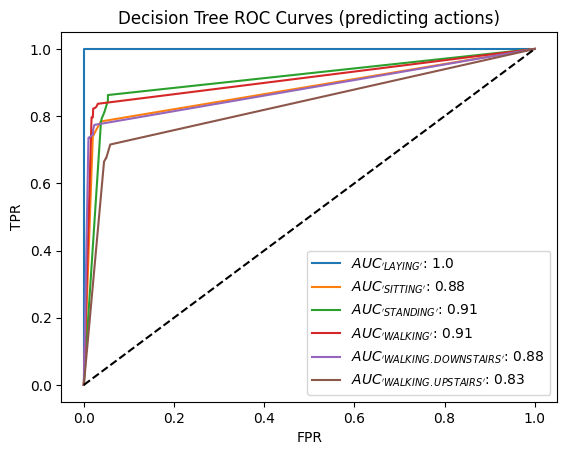

In [32]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score 
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc, roc_auc_score

X = df.drop(columns=['label', 'individuals']).values #the original df
X_train, X_test = df_train.copy(deep=True), df_test.copy(deep=True) #the original split
dict_importances = {} #the output I want

for el in label_loop:
    #Create the target variable for the i label
    y = pd.Series(1 if i == el else 0 for i in df['label'])
    
    #Reset the training and test set target variable according to the new y
    y_train, y_test = y[:len(ind_train)], y[len(ind_train):]
    
    #Training
    clf = DecisionTreeClassifier(min_samples_leaf=3, random_state=42)
    clf.fit(X_train, y_train)
    
    #Predicting
    y_pred = clf.predict(X_test)
    y_score = clf.predict_proba(X_test)
    
    #Computing the ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
    roc_auc = auc(fpr, tpr)
    
    #Printing the classification results
    print('Predicting {} with the Desision Tree:'.format(el))
    print('Area Under the Curve (ROC): ', roc_auc)
    print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred, labels=[1,0]))
    print(classification_report(y_test, y_pred), end='')

    #Extracting the importance of the features for this label
    imp_dict = {attr: clf.feature_importances_[i] for i, attr in enumerate(df.columns[2:])} #so that I store importances
    imp_dict = {k: v for k, v in sorted(imp_dict.items(), key=lambda item: item[1], reverse=True)} #sorted
    
    #I extract features with an importance over 10% for the decision tree
    dict_importances[el] = dict((k, v) for k, v in imp_dict.items() if v >= 0.10)
    
    #Print info about the extraction of features
    most_important_feat = list(dict_importances[el])[0]
    most_important_score = dict_importances[el][most_important_feat]
    print('{} most important feature is {} which has an importance score of: {:.2%}\n'.format(el, most_important_feat, most_important_score))
    
    #Plot the ROC Curve of the classification of this label
    plt.plot(fpr, tpr, label='$AUC_{action}$: '.format(action={el.replace('_', '.')}) + str(round(roc_auc, 2))) #. to avoid visualizing multiple subscripts preserving distance (space doesn't work)

plt.plot([0,1], [0,1], 'k--') #adding the baseline
plt.title("Decision Tree ROC Curves (predicting actions)")
plt.ylabel('TPR')
plt.xlabel('FPR')
plt.legend()
plt.show()

Walking Upstairs had the lowest AUC, I decided to use it as target variable

In [33]:
dict_importances #extracted importances

{'LAYING': {'53 tGravityAcc-min()-X': 1.0},
 'SITTING': {'427 fBodyGyro-std()-X': 0.15387594017993914,
  '53 tGravityAcc-min()-X': 0.3863777172177333,
  '560 angle(Y,gravityMean)': 0.23477367439428298},
 'STANDING': {'297 fBodyAcc-skewness()-X': 0.23503683561695696,
  '411 fBodyAccJerk-bandsEnergy()-9,16': 0.10156063604759441,
  '42 tGravityAcc-mean()-Y': 0.28738292334088905},
 'WALKING': {'167 tBodyGyroJerk-mad()-X': 0.30724935705429274,
  '504 fBodyAccMag-std()': 0.3060141314297988},
 'WALKING_DOWNSTAIRS': {'10 tBodyAcc-max()-X': 0.6892451764408278},
 'WALKING_UPSTAIRS': {'331 fBodyAcc-bandsEnergy()-1,8': 0.2710969645098043,
  '74 tGravityAcc-arCoeff()-Z,1': 0.2952026047023094}}

CHECKING WHETHERE LAYING IS TRULY PREDICTED PERFECTLY </br>
By verifying with cross validation on training set and comparing with test set

In [34]:
y = pd.Series(1 if i == 'LAYING' else 0 for i in df['label'])
y_train, y_test = y[:len(ind_train)], y[len(ind_train):]

clf = DecisionTreeClassifier(min_samples_leaf=3, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_train)

print(' ON TRAINING SET:\n')
print('Confusion Matrix (training set):\n', confusion_matrix(y_train, y_pred, labels=[1,0]))
print('Classification Report (training set):\n', classification_report(y_train, y_pred))
scores = cross_val_score(clf, X_train, y_train, cv=10)
print('Accuracy (Cross Validation Score on training set): {:.4f} mean (+/- {:.3f} std)'.format(scores.mean(), scores.std()))
scores = cross_val_score(clf, X_train, y_train, cv=10, scoring='f1_macro')
print('F1-score (Cross Validation Score on training set): {:.4f} mean (+/- {:.3f} std)\n'.format(scores.mean(), scores.std()))
print('__________________________________\n\n ON TEST SET:\n')

y_pred = clf.predict(X_test)
print('Confusion Matrix (test set):\n', confusion_matrix(y_test, y_pred, labels=[1,0]))
print('Classification Report (test set):\n', classification_report(y_test, y_pred))

 ON TRAINING SET:

Confusion Matrix (training set):
 [[1407    0]
 [   0 5945]]
Classification Report (training set):
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5945
           1       1.00      1.00      1.00      1407

    accuracy                           1.00      7352
   macro avg       1.00      1.00      1.00      7352
weighted avg       1.00      1.00      1.00      7352

Accuracy (Cross Validation Score on training set): 0.9999 mean (+/- 0.000 std)
F1-score (Cross Validation Score on training set): 0.9998 mean (+/- 0.001 std)

__________________________________

 ON TEST SET:

Confusion Matrix (test set):
 [[ 537    0]
 [   0 2410]]
Classification Report (test set):
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2410
           1       1.00      1.00      1.00       537

    accuracy                           1.00      2947
   macro avg       1.00      1.00 

<b>Conclusion: LAYING is perfectly predicted by tGravityAcc-min()-X alone</b> By looking at the plots, it is easy to divide the decision space because of a large distance with the minimized value of gravity acceleration of a person lying down

In [35]:
features_to_keep = set()
for k, v in dict_importances.items():
    for inkey in dict_importances[k].keys():
        features_to_keep.add(inkey)
features_to_keep = list(features_to_keep)

In [36]:
features_to_keep = [' '.join([str(n), str(el)]) for n, el in sorted([(int(n), el) for n, el in [feat.split(' ') for feat in features_to_keep]])] #an ugly way to use the integers of the feature name to sort the list of features

DEFINING THE DATAFRAME WITH THE FEATURES EXTRACTED FROM THE IMPORTANCE

In [37]:
df_select = df[features_to_keep]
print("columns:", len(df_select.columns))
df_select

columns: 11


,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
0,0.465563,-0.198698,0.910931,-0.366162,-0.318012,0.787213,-0.872989,-0.635353,-0.162709,-0.027400,0.222960
1,0.586004,-0.137829,0.886878,-0.461135,-0.479952,0.015080,-0.173580,-0.373514,-0.297979,0.220396,0.178975
2,0.074430,-0.159944,0.983467,-0.027458,-0.586446,-0.146056,-0.871813,-0.734109,-0.699480,-0.541710,0.192929
3,-0.931924,0.272900,0.879176,-0.836731,-0.988630,-0.343720,-0.999637,-0.999630,-0.990721,-0.992667,-0.106678
4,0.562230,-0.096393,0.940240,-0.614440,-0.342756,-0.062700,-0.793212,-0.875178,-0.018269,-0.053877,0.150598
...,...,...,...,...,...,...,...,...,...,...,...
10294,-0.079271,-0.207134,0.943534,-0.344206,-0.592250,0.005763,-0.624565,-0.800755,-0.380399,-0.305962,0.224618
10295,-0.934545,-0.150343,0.988306,-0.663477,-0.987019,-0.508912,-0.996780,-0.999578,-0.968255,-0.967303,0.186200
10296,-0.924946,-0.998467,-0.366038,-0.164093,-0.988051,-0.072394,-0.999795,-0.999941,-0.991647,-0.989869,0.998808
10297,-0.128721,-0.144532,0.971368,-0.286710,-0.505736,-0.378576,-0.800462,-0.726337,-0.677292,-0.515498,0.182817


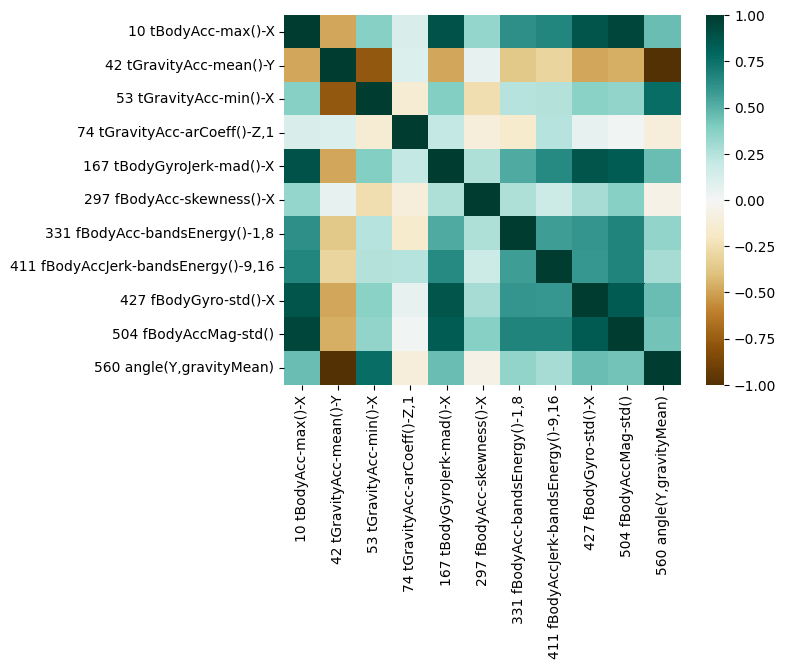

In [38]:
sns.heatmap(df_select.corr(), vmin=-1, vmax=1, cmap='BrBG')
plt.show()

<font size = "5">Feature Selection</font>

In [39]:
#I decided to measure the AUC with the lowest previous AUC's target variable 
y = pd.Series(1 if i == 'WALKING_UPSTAIRS' else 0 for i in df['label'])
y_train, y_test = y[:len(ind_train)], y[len(ind_train):]

#Setting the simplest parameter for the dt classifier
clf = DecisionTreeClassifier(min_samples_leaf=3, random_state=42)

#Setting a dictionary to save the AUC results for each dt classification after using a dimensionality reduction technique
auc_dict = dict()

<font size = "4">Original Dataset predictions as a comparison</font>

In [40]:
#Train and Predict
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(X_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_OR = auc(fpr, tpr)
print('ROC Curve:', roc_auc_OR)

#saving the AUC results
auc_dict['Original Dataset'] = (roc_auc_OR, X_train.shape[1])

[[2353  123]
 [ 153  318]]
Accuracy 0.9063454360366474
F1-score [0.94460056 0.69736842]
              precision    recall  f1-score   support

           0       0.94      0.95      0.94      2476
           1       0.72      0.68      0.70       471

    accuracy                           0.91      2947
   macro avg       0.83      0.81      0.82      2947
weighted avg       0.90      0.91      0.91      2947

ROC Curve: 0.8318404453453794


<font size = "4">DT Feature Importance</font>

In [41]:
#Defining the training and test set of the feature importance
X_train_FI, X_test_FI = df_select[:len(ind_train)], df_select[len(ind_train):]

#Train and Predict
clf.fit(X_train_FI, y_train)
y_pred = clf.predict(X_test_FI)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(X_test_FI)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_FI = auc(fpr, tpr)
print('ROC Curve:', roc_auc_FI)

#saving the AUC results
auc_dict['Feature Importance from DT'] = (roc_auc_FI, X_train_FI.shape[1])

[[2379   97]
 [ 141  330]]
Accuracy 0.9192399049881235
F1-score [0.95236189 0.73496659]
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      2476
           1       0.77      0.70      0.73       471

    accuracy                           0.92      2947
   macro avg       0.86      0.83      0.84      2947
weighted avg       0.92      0.92      0.92      2947

ROC Curve: 0.8530229909895078


<font size = "4">Feature selection using a Variance Threshold</font>

In [42]:
from sklearn.feature_selection import VarianceThreshold

VT = 0.8 #Variance Threshold selected
sel = VarianceThreshold(threshold=(VT * (1 - VT)))
X_train_VT = sel.fit_transform(X_train)
X_test_VT = sel.transform(X_test)

print('With a VT of {:.0%}:\nN° of features: {}'.format(VT, X_train_VT.shape[1]))

With a VT of 80%:
N° of features: 99


In [43]:
#Train and Predict
clf.fit(X_train_VT, y_train)
y_pred = clf.predict(X_test_VT)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(X_test_VT)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_VT = auc(fpr, tpr)
print('ROC Curve:', roc_auc_VT)

#saving the AUC results
auc_dict['Variance Threshold'] = (roc_auc_VT, X_train_VT.shape[1])

[[2329  147]
 [  93  378]]
Accuracy 0.9185612487275195
F1-score [0.95100041 0.75903614]
              precision    recall  f1-score   support

           0       0.96      0.94      0.95      2476
           1       0.72      0.80      0.76       471

    accuracy                           0.92      2947
   macro avg       0.84      0.87      0.86      2947
weighted avg       0.92      0.92      0.92      2947

ROC Curve: 0.8752722526916573


<font size = "4">Univariate Feature Selection</font>

In [44]:
from sklearn.feature_selection import SelectKBest

sel = SelectKBest(k=len(features_to_keep)) #to see if I get the same features
X_train_SKB = sel.fit_transform(X_train, y_train)
X_test_SKB = sel.transform(X_test)

print('Number of Features:', X_train_SKB.shape[1])

Number of Features: 11


In [45]:
print('Features Selected:', 
      sel.get_feature_names_out(), 
      end='\n\n')
print('Features Appearing in the Feature Importance:',
      [feat for feat in features_to_keep if feat in sel.get_feature_names_out()],
      )

Features Selected: ['22 tBodyAcc-iqr()-Z' '142 tBodyGyro-iqr()-Z' '271 fBodyAcc-std()-Z'
 '276 fBodyAcc-max()-Y' '277 fBodyAcc-max()-Z'
 '317 fBodyAcc-bandsEnergy()-1,8' '331 fBodyAcc-bandsEnergy()-1,8'
 '375 fBodyAccJerk-meanFreq()-Z' '429 fBodyGyro-std()-Z'
 '434 fBodyGyro-max()-Y' '435 fBodyGyro-max()-Z']

Features Appearing in the Feature Importance: ['331 fBodyAcc-bandsEnergy()-1,8']


In [46]:
#Train and Predict
clf.fit(X_train_SKB, y_train)
y_pred = clf.predict(X_test_SKB)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(X_test_SKB)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_SKB = auc(fpr, tpr)
print('ROC Curve:', roc_auc_SKB)

#saving the AUC results
auc_dict['Univariate Feature Selection'] = (roc_auc_SKB, X_train_SKB.shape[1])

[[2346  130]
 [ 161  310]]
Accuracy 0.9012555140821175
F1-score [0.94160144 0.6805708 ]
              precision    recall  f1-score   support

           0       0.94      0.95      0.94      2476
           1       0.70      0.66      0.68       471

    accuracy                           0.90      2947
   macro avg       0.82      0.80      0.81      2947
weighted avg       0.90      0.90      0.90      2947

ROC Curve: 0.8482737893115737


<font size = "4">Recursive Feature Elimination</font>

In [47]:
from sklearn.feature_selection import SelectFromModel

sel = SelectFromModel(DecisionTreeClassifier())
X_train_RFE = sel.fit_transform(X_train, y_train)
X_test_RFE = sel.transform(X_test)

print('Number of Features:', X_train_RFE.shape[1])

Number of Features: 33


In [48]:
#Train and Predict
clf.fit(X_train_RFE, y_train)
y_pred = clf.predict(X_test_RFE)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(X_test_RFE)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_RFE = auc(fpr, tpr)
print('ROC Curve:', roc_auc_RFE)

#saving the AUC results
auc_dict['Recursive Feature Elimination'] = (roc_auc_RFE, X_train_RFE.shape[1])

[[2313  163]
 [ 140  331]]
Accuracy 0.8971835765184933
F1-score [0.93852708 0.68601036]
              precision    recall  f1-score   support

           0       0.94      0.93      0.94      2476
           1       0.67      0.70      0.69       471

    accuracy                           0.90      2947
   macro avg       0.81      0.82      0.81      2947
weighted avg       0.90      0.90      0.90      2947

ROC Curve: 0.8292126709403908


<font size = "5">Dimensionality Reduction</font>

I won't really use these techniques for classification but only for visualization, the classification and AUC performed are only used as a compartive measure of the relatively best fitting reduction technique

<font size = "4">Principal Component Analysis</font>

In [49]:
from sklearn.decomposition import PCA

pca = PCA()
x_new = pca.fit_transform(df[df.columns[2:]])

df_pca = pd.DataFrame(x_new, columns=['PC'+str(i) for i in range(1, pca.n_components_+1)])
df_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC552,PC553,PC554,PC555,PC556,PC557,PC558,PC559,PC560,PC561
0,8.045373,0.531752,0.549333,0.541561,-2.839712,-0.884314,0.735601,-1.217678,-0.008871,-0.166067,...,-9.177865e-16,-2.186672e-16,-2.268889e-16,4.987512e-16,-1.890144e-17,3.357094e-18,-4.355474e-17,3.999828e-17,-4.410860e-18,-3.946281e-18
1,9.335513,0.959834,-0.078663,1.248510,0.426059,-0.027219,2.702744,0.955016,1.831343,0.225986,...,3.561491e-16,6.066686e-17,6.092539e-16,4.719293e-16,-8.698995e-17,-3.598484e-17,-4.208228e-17,-1.035740e-16,6.932132e-18,-1.188961e-17
2,4.286190,0.107382,-0.599345,-1.623675,0.268697,0.629022,0.585825,-0.902379,-1.333007,-0.481914,...,9.121298e-17,1.414131e-16,1.410644e-15,-5.713597e-16,-1.281738e-16,-6.874080e-17,-1.329792e-17,-7.249937e-17,1.637627e-17,1.450387e-18
3,-5.449198,-0.096596,-1.270153,0.679077,-0.038701,-0.277726,0.254939,-0.183521,-0.405129,-0.453538,...,1.650127e-16,-7.747613e-16,-6.799458e-17,4.069504e-17,3.479249e-17,9.379455e-17,-1.694029e-17,-7.998508e-18,-8.399144e-18,1.013661e-17
4,7.316445,0.096064,0.217530,-0.059850,-2.148336,0.429546,-0.655050,-0.469081,0.998722,0.167548,...,-1.092131e-16,1.772261e-16,-4.357073e-16,6.763501e-16,-8.344985e-17,7.952586e-18,4.883310e-18,3.035029e-17,1.695680e-17,1.458081e-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10294,6.424898,0.841884,-0.628820,0.558573,1.686261,0.075003,1.421299,1.259405,0.832014,-0.645911,...,-7.999795e-16,5.383214e-16,9.698442e-16,-2.888748e-16,1.715234e-16,-6.169867e-17,5.088798e-17,-5.129597e-17,-2.514419e-17,-4.556226e-18
10295,-4.428044,-1.455671,-0.999541,-0.091533,0.507801,0.002414,-0.476819,-0.006745,1.193682,-0.446590,...,-1.713368e-16,-1.748464e-16,5.697101e-16,-9.959659e-17,-9.106305e-18,3.677674e-17,3.384924e-18,5.754793e-17,1.506169e-17,-9.088301e-18
10296,-5.460383,1.870153,0.348608,-0.530843,0.348357,0.053211,0.910633,-0.577970,-0.849394,-0.536753,...,-2.741762e-16,1.342266e-16,-2.241896e-16,-4.416488e-18,-7.263015e-17,2.761600e-17,3.299265e-17,-3.076744e-17,-1.027024e-17,1.801118e-18
10297,5.496233,0.533498,-0.975459,-1.053641,0.750172,-0.682449,0.349724,0.519411,-0.315983,-1.092228,...,-1.390482e-15,8.194355e-16,2.840829e-15,1.959979e-16,-2.741094e-17,1.712232e-17,1.808637e-17,4.427655e-17,2.008253e-17,3.030942e-18


Text(0, 0.5, 'Explained Variance Ratio')

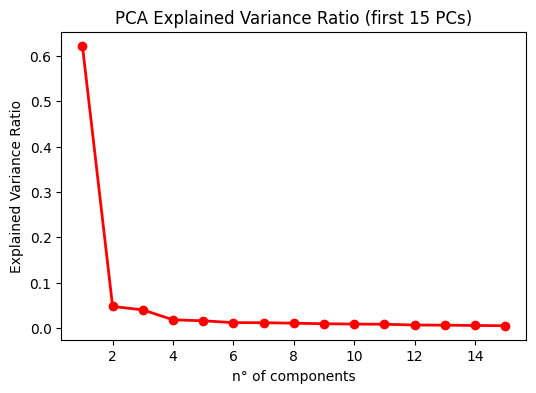

In [50]:
plt.figure(figsize=(6, 4))
reduce_length = 15
plt.plot((np.arange(pca.n_components_) + 1)[:reduce_length], pca.explained_variance_ratio_[:reduce_length], 'ro-', linewidth=2)
plt.title("PCA Explained Variance Ratio (first {} PCs)".format(reduce_length))
plt.xlabel("n° of components")
plt.ylabel("Explained Variance Ratio")

In [51]:
for x in range(4):
    print('PC{} Explained Variance Ratio: '.format(x+1), round(pca.explained_variance_ratio_[x]*100, 2), '%', sep='')

PC1 Explained Variance Ratio: 62.23%
PC2 Explained Variance Ratio: 4.77%
PC3 Explained Variance Ratio: 4.02%
PC4 Explained Variance Ratio: 1.82%


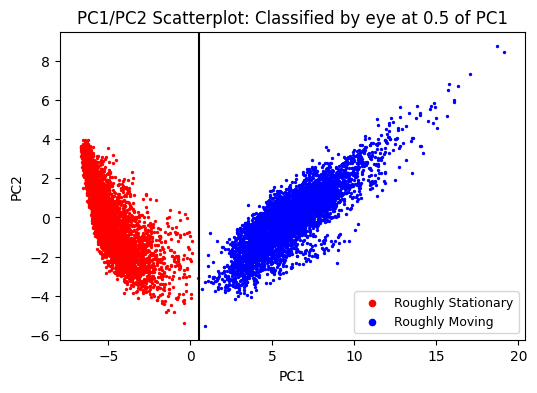

In [52]:
clf_by_look = 0.5
plt.figure(figsize=(6, 4))
plt.scatter(df_pca['PC1'].values[df_pca['PC1']<clf_by_look], df_pca['PC2'].values[df_pca['PC1']<clf_by_look], c='r', s=2, label='Roughly Stationary')
plt.scatter(df_pca['PC1'].values[df_pca['PC1']>=clf_by_look], df_pca['PC2'].values[df_pca['PC1']>=clf_by_look], c='b', s=2, label='Roughly Moving')
plt.title("PC1/PC2 Scatterplot: Classified by eye at {} of PC1".format(clf_by_look))
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.axvline(clf_by_look, c='k')
legend = plt.legend(loc='lower right', fontsize=9)
for x in range(2):
    legend.legendHandles[x]._sizes = [20]

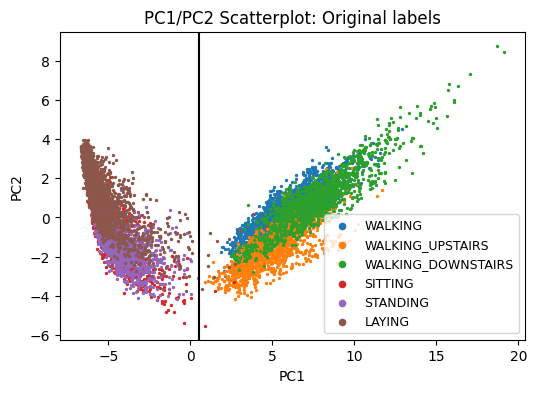

In [53]:
plt.figure(figsize=(6, 4))
for k, v in remap_dict.items():
    plt.scatter(df_pca[labels.values == k]['PC1'], df_pca[labels.values == k]['PC2'], label=v, s=2)
plt.title("PC1/PC2 Scatterplot: Original labels")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.axvline(clf_by_look, c='k')
legend = plt.legend(loc='lower right', fontsize=9)
for x in range(6):
    legend.legendHandles[x]._sizes = [20]
plt.show()

Text(0, 0.5, 'PC2')

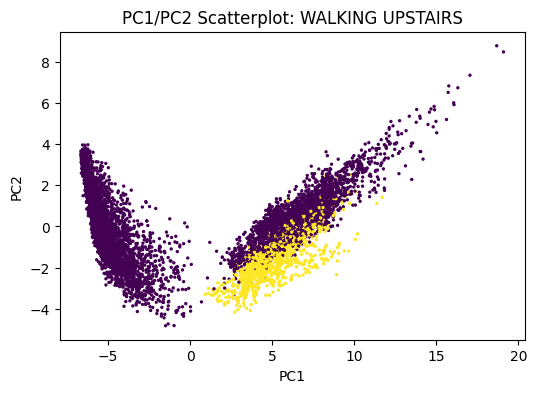

In [54]:
plt.figure(figsize=(6, 4))
plt.scatter(df_pca[:len(ind_train)].values[:,0], df_pca[:len(ind_train)].values[:,1], c=y_train, s=2)
plt.title("PC1/PC2 Scatterplot: WALKING UPSTAIRS")
plt.xlabel("PC1")
plt.ylabel("PC2")

It's not that good considering it perceive the variance as that of two distinct clusters (stationary and moving), inside those two there is a lot of overlapping, hereunder I analyzed the loadings of the variance explained by PC1

In [55]:
loadings = pd.DataFrame((abs(pca.components_)), columns=df.columns[2:], index=['PC'+str(i) for i in range(1, pca.n_components_+1)])[:1]
loadings

,1 tBodyAcc-mean()-X,2 tBodyAcc-mean()-Y,3 tBodyAcc-mean()-Z,4 tBodyAcc-std()-X,5 tBodyAcc-std()-Y,6 tBodyAcc-std()-Z,7 tBodyAcc-mad()-X,8 tBodyAcc-mad()-Y,9 tBodyAcc-mad()-Z,10 tBodyAcc-max()-X,...,552 fBodyBodyGyroJerkMag-meanFreq(),553 fBodyBodyGyroJerkMag-skewness(),554 fBodyBodyGyroJerkMag-kurtosis(),"555 angle(tBodyAccMean,gravity)","556 angle(tBodyAccJerkMean),gravityMean)","557 angle(tBodyGyroMean,gravityMean)","558 angle(tBodyGyroJerkMean,gravityMean)","559 angle(X,gravityMean)","560 angle(Y,gravityMean)","561 angle(Z,gravityMean)"
PC1,0.000011,0.000294,0.00026,0.072485,0.083685,0.064389,0.067979,0.080483,0.063358,0.08847,...,0.00558,0.013336,0.010927,0.00127,0.001081,0.001857,0.001935,0.036965,0.027084,0.021325


Here the most influenial features of PC1 (which explain over 60% of total variance), the threshold (loading_extract_lvl) I selected is kind of arbitrary (I used the plot I made afterwards to determine it)

In [56]:
loading_extract_lvl = 0.085
load_most_pc1 = loadings[loadings > loading_extract_lvl].T.dropna().T
load_most_pc1.T

,PC1
10 tBodyAcc-max()-X,0.088470
103 tBodyAccJerk-entropy()-X,0.107594
104 tBodyAccJerk-entropy()-Y,0.104647
105 tBodyAccJerk-entropy()-Z,0.100932
183 tBodyGyroJerk-entropy()-X,0.091157
184 tBodyGyroJerk-entropy()-Y,0.087326
185 tBodyGyroJerk-entropy()-Z,0.095634
209 tBodyAccMag-entropy(),0.108505
222 tGravityAccMag-entropy(),0.108505
235 tBodyAccJerkMag-entropy(),0.121879


Bar plot with the loadings on the y axis and the feature on the x axis, the number on the x axis doesn't hold any meaning other than indicating the number indicated on the label of the feature

Text(-23, 0.09100000000000001, 'Load over 0.085')

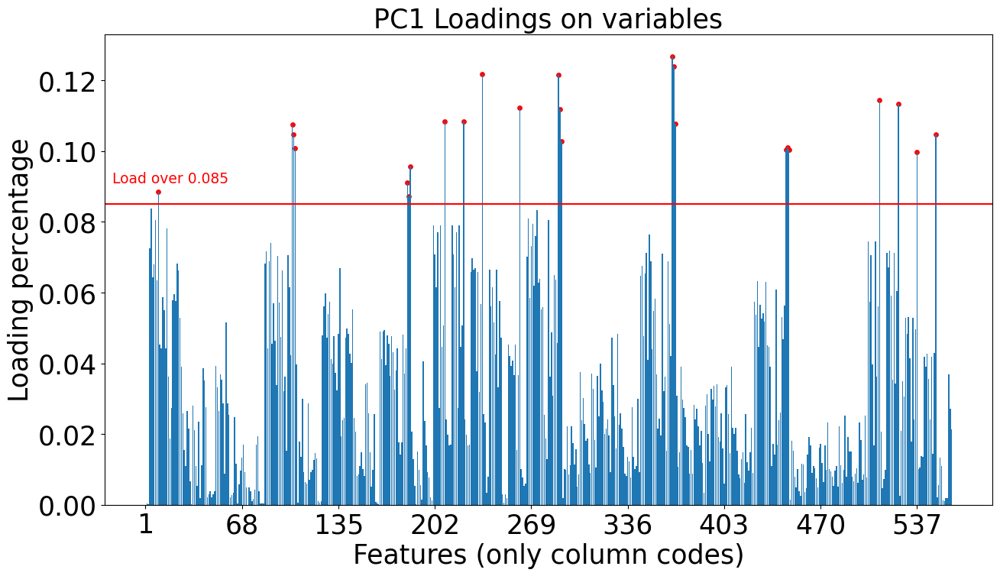

In [57]:
fig = plt.figure(figsize=(15, 8))

plt.bar(np.arange(0, len(loadings.columns)), loadings.T['PC1'])
plt.scatter(np.array([int(r[:3]) for r in dict(load_most_pc1).keys()])-1, (load_most_pc1).values, c='r', s=15)
plt.xlabel('Features (only column codes)', fontsize=25)
plt.ylabel('Loading percentage', fontsize=25)
plt.title('PC1 Loadings on variables',fontsize=25)
plt.xticks(np.arange(0, len(loadings.columns), 67), np.arange(0,len(loadings.columns), 67) +1, fontsize=25)
plt.yticks(fontsize=25)
plt.axhline(loading_extract_lvl, c='r')
plt.text(-23, loading_extract_lvl+0.006, s='Load over {}'.format(loading_extract_lvl), c='r', fontsize=13.5)

I used the PCA on the entire dataset to get a feeling of the internal structure of the data, but I will use the training and test set split as with feature selection to perform it now

In [58]:
pca_components = 4
pca = PCA(n_components=pca_components)
pca_train = pca.fit_transform(X_train)
pca_test = pca.transform(X_test)

In [59]:
remap_dict #just to remember it was used to get the labels in text from their number
reverted_map_dict = {v: k for k, v in remap_dict.items()} #just reverting it to get numbers from the text labels
mapping_color = {'WALKING' : 'b', 'WALKING_UPSTAIRS' : 'r', 'WALKING_DOWNSTAIRS' : 'g', 'SITTING' : 'y', 'STANDING' : 'c', 'LAYING' : 'm'} #setting the color I will use from now on

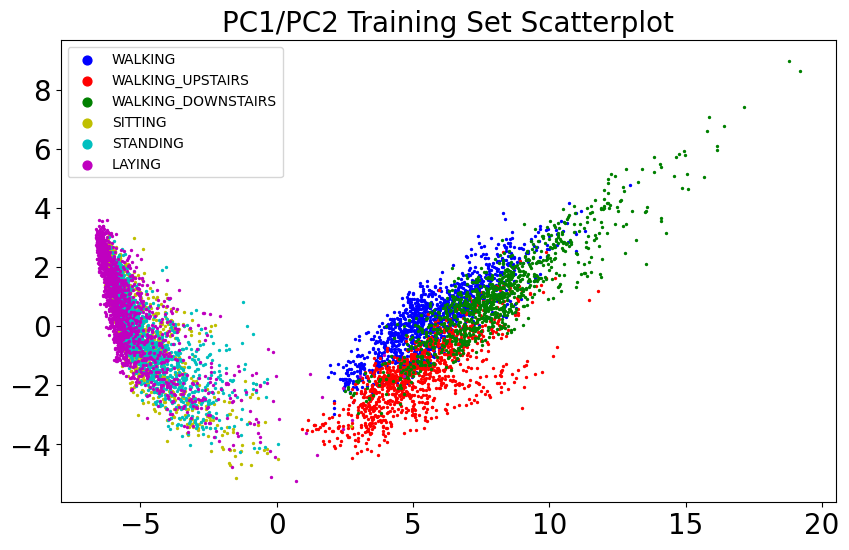

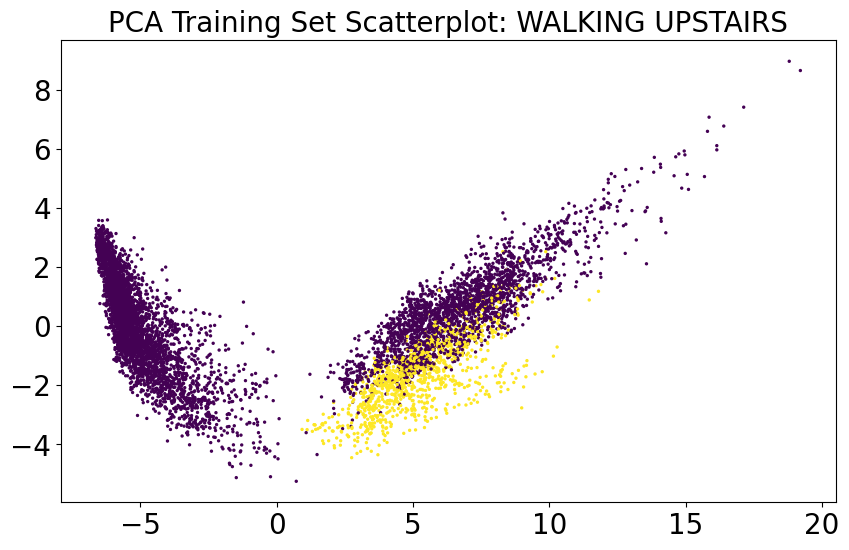

In [60]:
fig = plt.figure(figsize=(10, 6))

for action, color in mapping_color.items():
    number_action = reverted_map_dict[action] #getting the original numerical label
    plot_pca = pd.DataFrame(pca_train).loc[(labels_train == number_action).values].values
    plt.scatter(plot_pca[:, 0], plot_pca[:, 1], c=color, label=action, s=2)
    
plt.title('PC1/PC2 Training Set Scatterplot', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

legend = plt.legend()

for x in range(6):
    legend.legendHandles[x]._sizes = [40]
    
plt.show()

fig = plt.figure(figsize=(10, 6))

plt.scatter(pca_train[:,0], pca_train[:,1], c=y_train, s=2)

plt.title("PCA Training Set Scatterplot: WALKING UPSTAIRS", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [61]:
#Train and Predict
clf.fit(pca_train, y_train)
y_pred = clf.predict(pca_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(pca_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_PCA = auc(fpr, tpr)
print('ROC Curve:', roc_auc_PCA)

#saving the AUC results
auc_dict['PCA (4PC)'] = (roc_auc_PCA, pca_components)

[[2391   85]
 [ 116  355]]
Accuracy 0.9317950458092976
F1-score [0.95966285 0.77936334]
              precision    recall  f1-score   support

           0       0.95      0.97      0.96      2476
           1       0.81      0.75      0.78       471

    accuracy                           0.93      2947
   macro avg       0.88      0.86      0.87      2947
weighted avg       0.93      0.93      0.93      2947

ROC Curve: 0.9193308843453416


<font size = "4">Random Subspace Projection</font>

In [62]:
from sklearn import random_projection

rsp = random_projection.GaussianRandomProjection(n_components=2, random_state=42)
rsp_train = rsp.fit_transform(X_train)
rsp_test = rsp.transform(X_test)

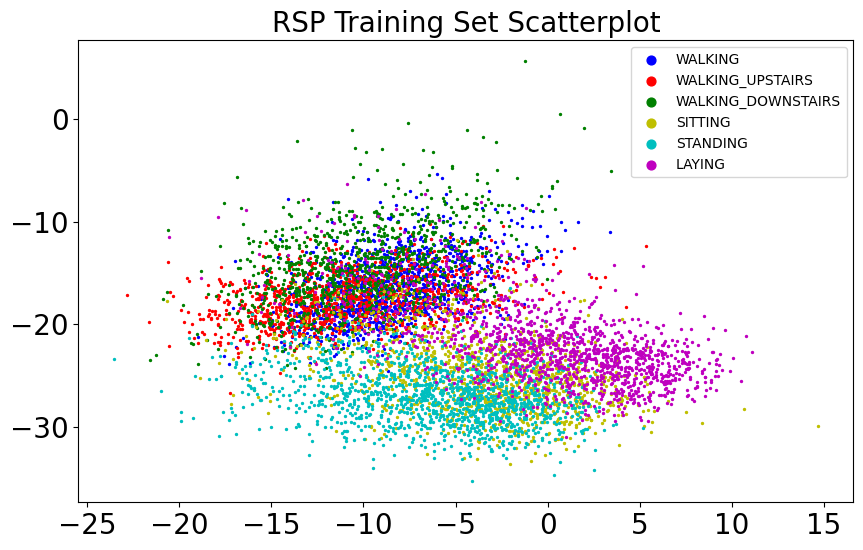

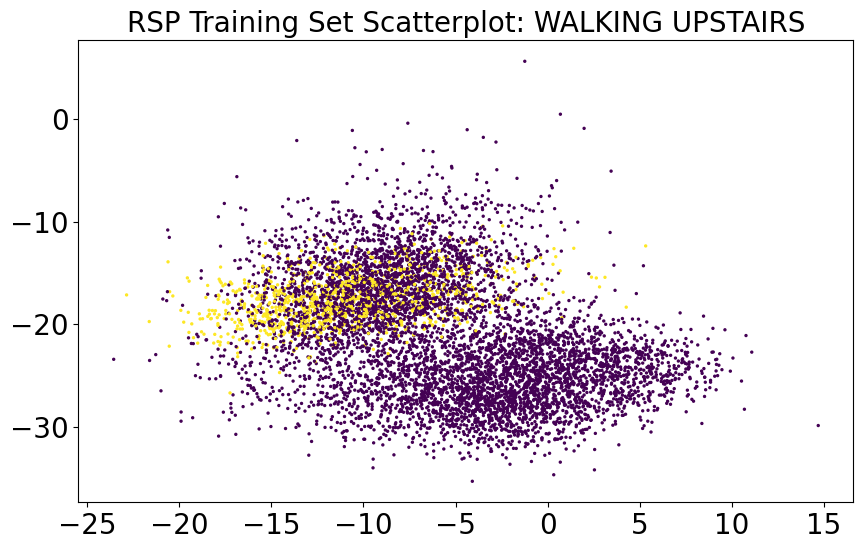

In [63]:
fig = plt.figure(figsize=(10, 6))

for action, color in mapping_color.items():
    number_action = reverted_map_dict[action] #getting the original numerical label
    plot_rsp = pd.DataFrame(rsp_train).loc[(labels_train == number_action).values].values
    plt.scatter(plot_rsp[:, 0], plot_rsp[:, 1], c=color, label=action, s=2)
    
plt.title('RSP Training Set Scatterplot', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

legend = plt.legend()

for x in range(6):
    legend.legendHandles[x]._sizes = [40]
    
plt.show()

fig = plt.figure(figsize=(10, 6))

plt.scatter(rsp_train[:,0], rsp_train[:,1], c=y_train, s=2)

plt.title("RSP Training Set Scatterplot: WALKING UPSTAIRS", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [64]:
#Train and Predict
clf.fit(rsp_train, y_train)
y_pred = clf.predict(rsp_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(rsp_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_RSP = auc(fpr, tpr)
print('ROC Curve:', roc_auc_RSP)

#saving the AUC results
auc_dict['Random Subspace Projection'] = (roc_auc_RSP, rsp.n_components)

[[2227  249]
 [ 339  132]]
Accuracy 0.8004750593824228
F1-score [0.88337961 0.30985915]
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2476
           1       0.35      0.28      0.31       471

    accuracy                           0.80      2947
   macro avg       0.61      0.59      0.60      2947
weighted avg       0.78      0.80      0.79      2947

ROC Curve: 0.6741791259788235


<font size = "4">Multi Dimensional Scaling</font>

WARNING: Slow (it took around 1 hour)

MDS doesn't use the fitting to transform other data, I had to split after fitting and trasnforming the entire dataset

In [65]:
from sklearn.manifold import MDS

mds = MDS(n_components=2, random_state=42)
mds_df = pd.DataFrame(mds.fit_transform(df[df.columns[2:]]))
mds_train = mds_df[:len(ind_train)].values
mds_test = mds_df[len(ind_train):].values

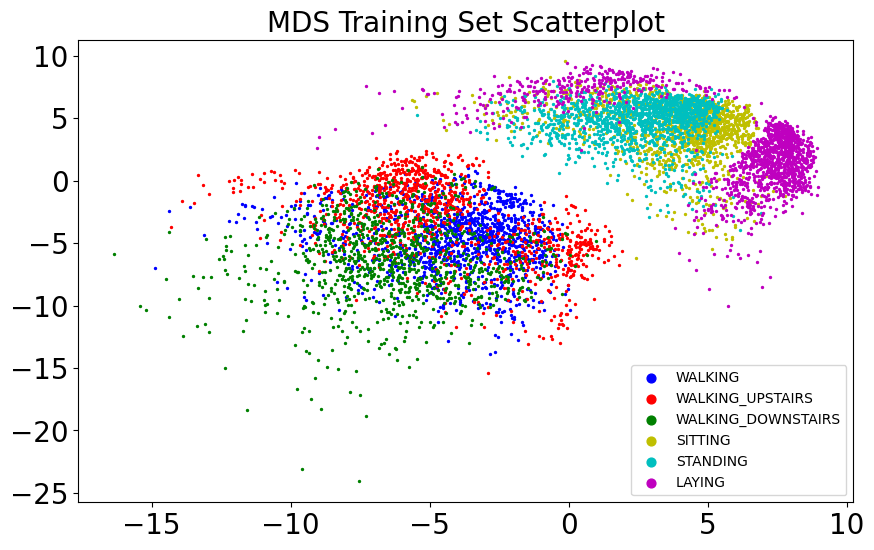

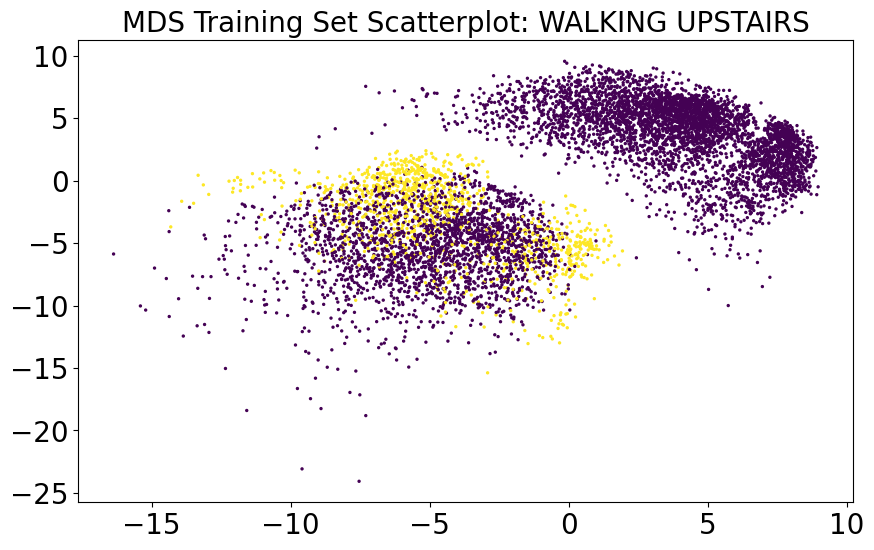

In [66]:
fig = plt.figure(figsize=(10, 6))

for action, color in mapping_color.items():
    number_action = reverted_map_dict[action] #getting the original numerical label
    plot_mds = pd.DataFrame(mds_train).loc[(labels_train == number_action).values].values
    plt.scatter(plot_mds[:, 0], plot_mds[:, 1], c=color, label=action, s=2)
    
plt.title('MDS Training Set Scatterplot', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

legend = plt.legend()

for x in range(6):
    legend.legendHandles[x]._sizes = [40]
    
plt.show()

fig = plt.figure(figsize=(10, 6))

plt.scatter(mds_train[:,0], mds_train[:,1], c=y_train, s=2)

plt.title("MDS Training Set Scatterplot: WALKING UPSTAIRS", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [67]:
#Train and Predict
clf.fit(mds_train, y_train)
y_pred = clf.predict(mds_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(mds_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_MDS = auc(fpr, tpr)
print('ROC Curve:', roc_auc_MDS)

#saving the AUC results
auc_dict['Multi Dimensional Scaling'] = (roc_auc_MDS, mds.n_components)

[[2298  178]
 [ 233  238]]
Accuracy 0.8605361384458772
F1-score [0.91791492 0.53664036]
              precision    recall  f1-score   support

           0       0.91      0.93      0.92      2476
           1       0.57      0.51      0.54       471

    accuracy                           0.86      2947
   macro avg       0.74      0.72      0.73      2947
weighted avg       0.85      0.86      0.86      2947

ROC Curve: 0.7808267220947422


<font size = "4">IsoMap</font>

In [68]:
from sklearn.manifold import Isomap

iso = Isomap(n_neighbors=15, n_components=2)
iso_train = iso.fit_transform(X_train)
iso_test = iso.transform(X_test)

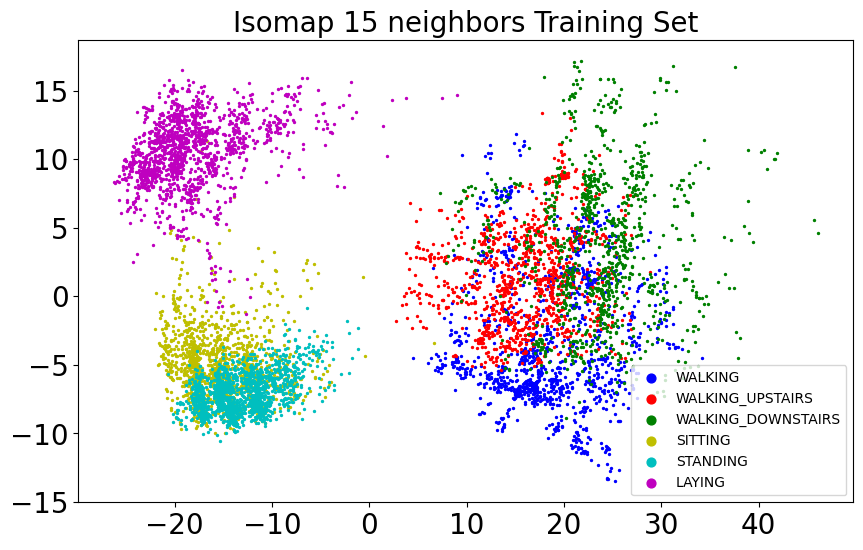

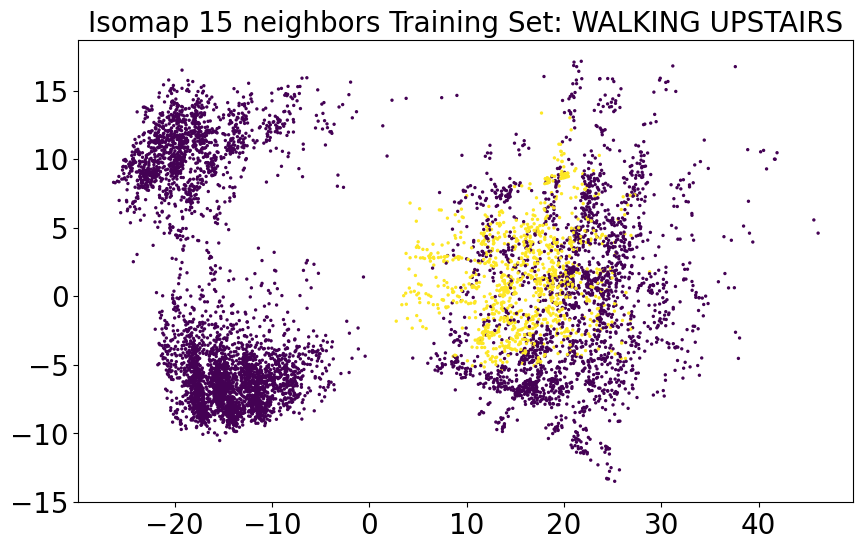

In [69]:
fig = plt.figure(figsize=(10, 6))

for action, color in mapping_color.items():
    number_action = reverted_map_dict[action] #getting the original numerical label
    plot_iso = pd.DataFrame(iso_train).loc[(labels_train == number_action).values].values
    plt.scatter(plot_iso[:, 0], plot_iso[:, 1], c=color, label=action, s=2)
    
plt.title('Isomap 15 neighbors Training Set', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

legend = plt.legend()

for x in range(6):
    legend.legendHandles[x]._sizes = [40]
    
plt.show()

fig = plt.figure(figsize=(10, 6))

plt.scatter(iso_train[:,0], iso_train[:,1], c=y_train, s=2)

plt.title("Isomap 15 neighbors Training Set: WALKING UPSTAIRS", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [70]:
#Train and Predict
clf.fit(iso_train, y_train)
y_pred = clf.predict(iso_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(iso_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_ISO = auc(fpr, tpr)
print('ROC Curve:', roc_auc_ISO)

#saving the AUC results
auc_dict['Isomap'] = (roc_auc_ISO, iso.n_components)

[[2295  181]
 [ 194  277]]
Accuracy 0.8727519511367492
F1-score [0.9244713  0.59634015]
              precision    recall  f1-score   support

           0       0.92      0.93      0.92      2476
           1       0.60      0.59      0.60       471

    accuracy                           0.87      2947
   macro avg       0.76      0.76      0.76      2947
weighted avg       0.87      0.87      0.87      2947

ROC Curve: 0.8182290969957022


<font size = "4">t-SNE</font>

tSNE doesn't use the fitting to transform other data, I had to split after fitting and trasnforming the entire dataset

In [71]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, init='random', learning_rate='auto', random_state=42)
tsne_df = pd.DataFrame(tsne.fit_transform(df[df.columns[2:]]))
tsne_train = tsne_df[:len(ind_train)].values
tsne_test = tsne_df[len(ind_train):].values

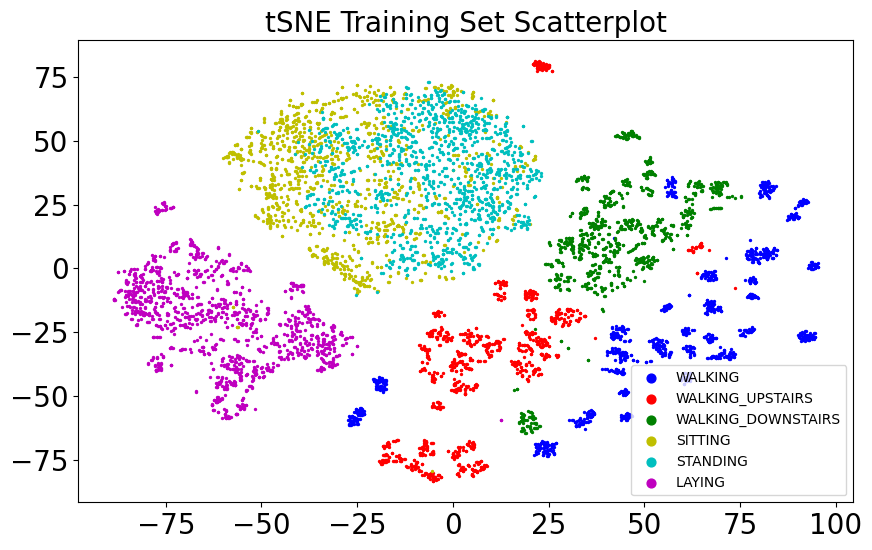

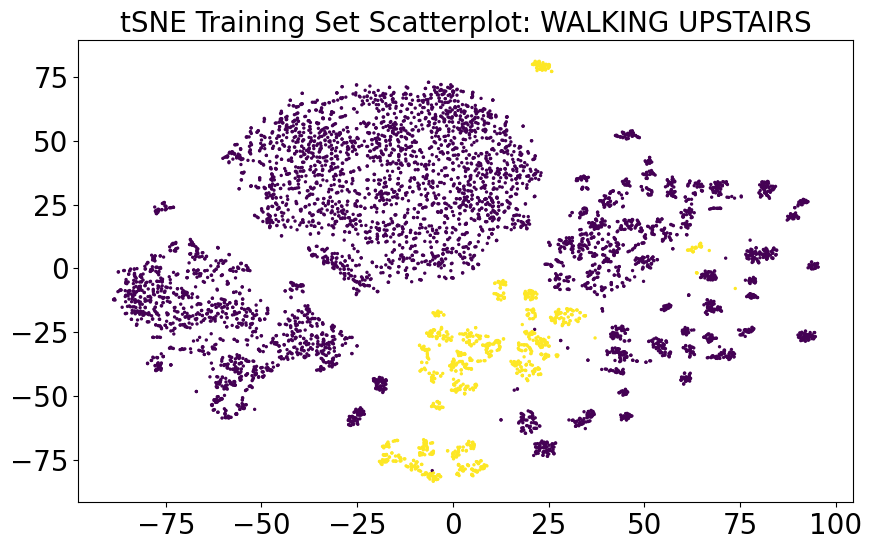

In [72]:
fig = plt.figure(figsize=(10, 6))

for action, color in mapping_color.items():
    number_action = reverted_map_dict[action] #getting the original numerical label
    plot_tsne = pd.DataFrame(tsne_train).loc[(labels_train == number_action).values].values
    plt.scatter(plot_tsne[:, 0], plot_tsne[:, 1], c=color, label=action, s=2)
    
plt.title('tSNE Training Set Scatterplot', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

legend = plt.legend()

for x in range(6):
    legend.legendHandles[x]._sizes = [40]
    
plt.show()

fig = plt.figure(figsize=(10, 6))

plt.scatter(tsne_train[:,0], tsne_train[:,1], c=y_train, s=2)

plt.title("tSNE Training Set Scatterplot: WALKING UPSTAIRS", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [73]:
#Train and Predict
clf.fit(tsne_train, y_train)
y_pred = clf.predict(tsne_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(tsne_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc_tSNE = auc(fpr, tpr)
print('ROC Curve:', roc_auc_tSNE)

#saving the AUC results
auc_dict['tSNE'] = (roc_auc_tSNE, tsne.n_components)

[[2443   33]
 [  86  385]]
Accuracy 0.9596199524940617
F1-score [0.97622378 0.86614173]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      2476
           1       0.92      0.82      0.87       471

    accuracy                           0.96      2947
   macro avg       0.94      0.90      0.92      2947
weighted avg       0.96      0.96      0.96      2947

ROC Curve: 0.9020040370572356


Now I looked at the resulting AUC for each reduction technique, PCA and tSNE give the best results with a classifier but regarding the explainability of the models it's better to use some feature reduction technique, I opted for the Feature Importance as it had a solid AUC score and it didn't have neither few nor too many features to build explainable models. </br></br> I also kept the tSNE results in mind for how well it separated correctly the different cluster of records pertaining to each class (I will use that later)

In [74]:
pd.DataFrame(auc_dict, index=['ROC AUC', 'n° Features']).T

,ROC AUC,n° Features
Original Dataset,0.831840,561.0
Feature Importance from DT,0.853023,11.0
Variance Threshold,0.875272,99.0
Univariate Feature Selection,0.848274,11.0
Recursive Feature Elimination,0.829213,33.0
PCA (4PC),0.919331,4.0
Random Subspace Projection,0.674179,2.0
Multi Dimensional Scaling,0.780827,2.0
Isomap,0.818229,2.0
tSNE,0.902004,2.0


<font size = "4">Exploring K-Means results</font>

In [75]:
from sklearn.cluster import KMeans

x_select = df_select.values

kmeans = KMeans(n_clusters=6, n_init=10, max_iter=100) #didn't tune because I just wanted six clusters because I know the actual labels
kmeans.fit(x_select)

centroids = kmeans.cluster_centers_
clusters = kmeans.labels_ + 1
inertia = kmeans.inertia_

print("SSE:", inertia)

SSE: 3106.168695539204


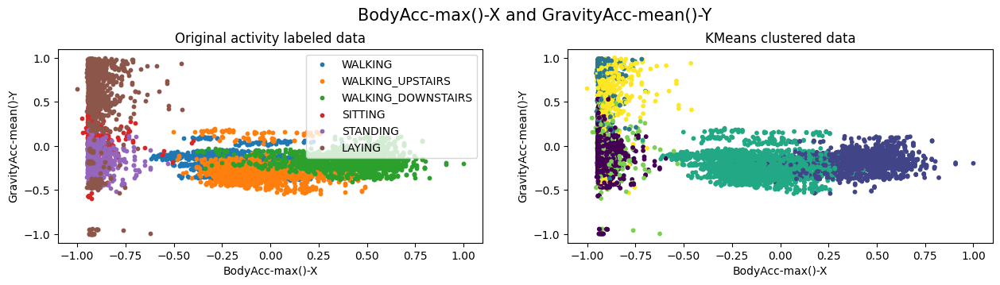

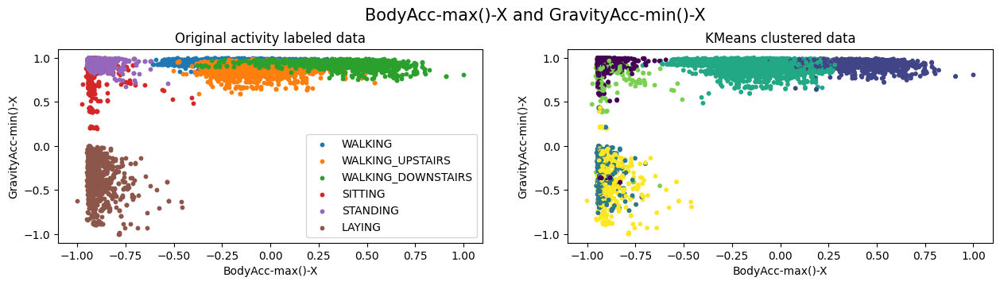

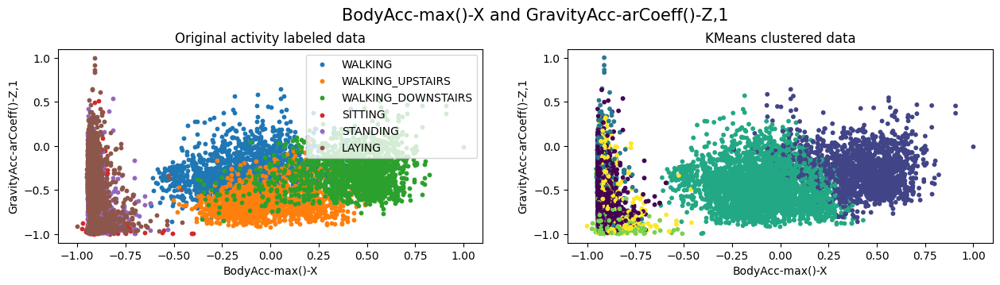

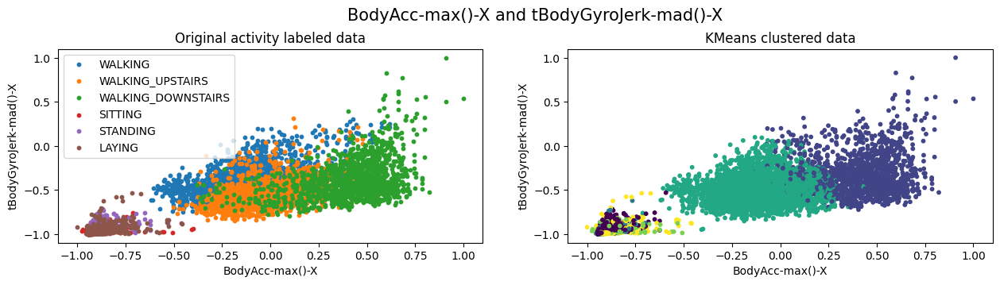

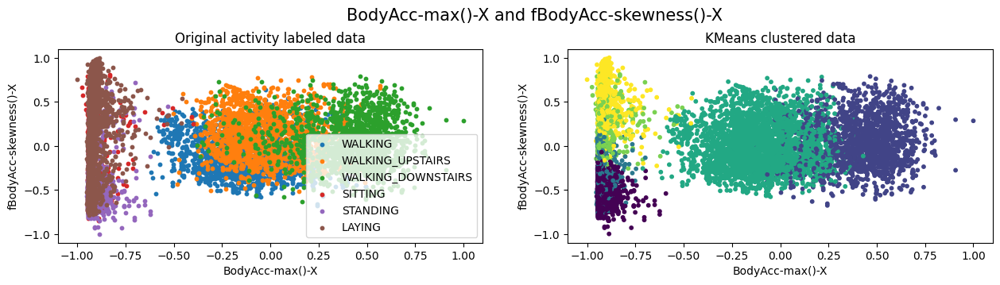

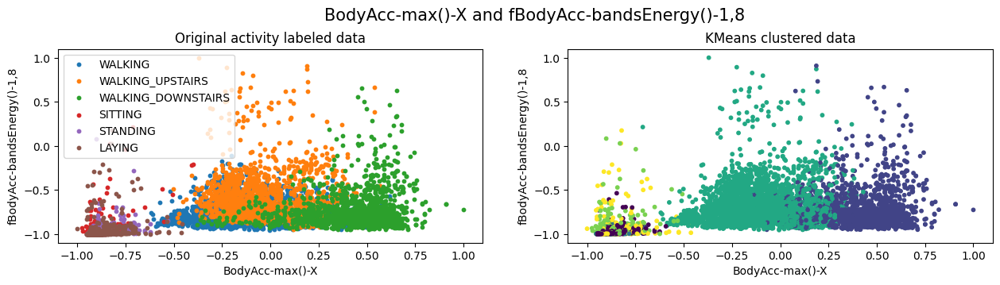

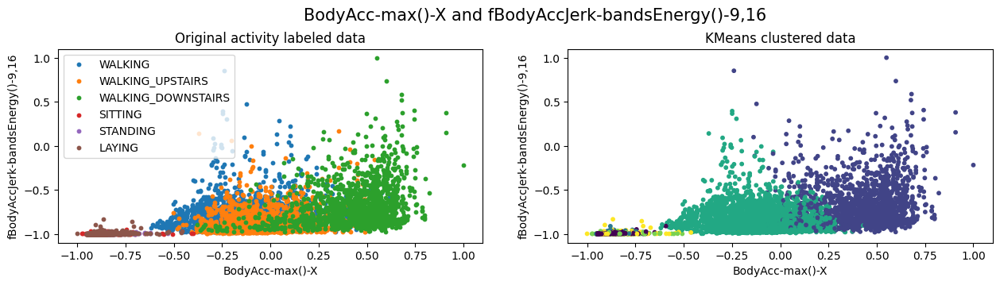

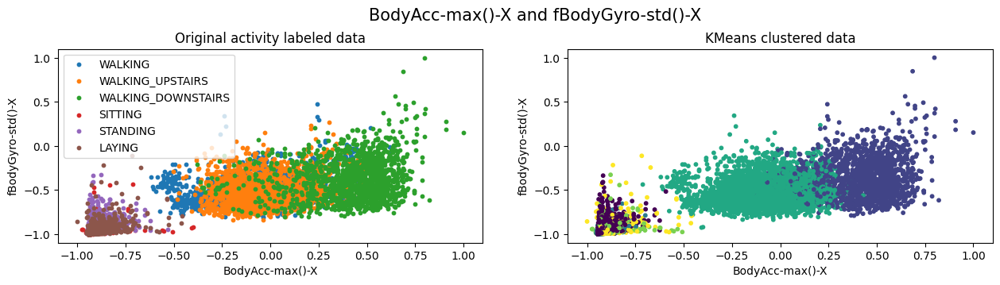

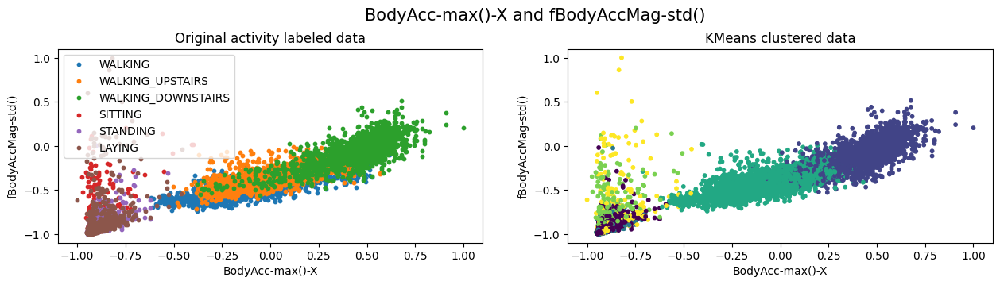

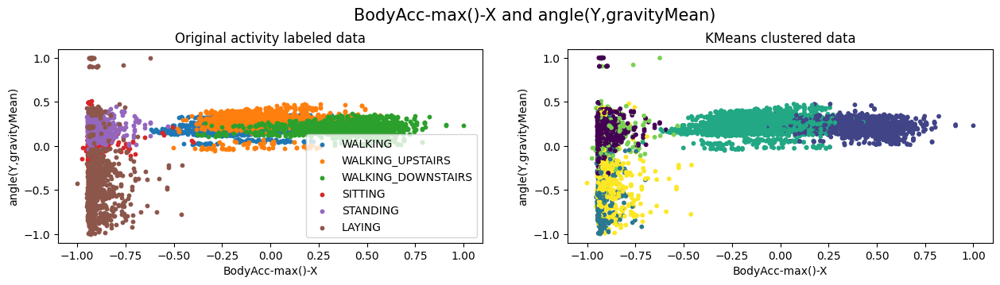

In [76]:
x_feature = '10 tBodyAcc-max()-X'
for col in df_select.columns:
    if col != x_feature:
        y_feature = col
        fig = plt.subplots(figsize=(40, 26))
        fig_dims = (7, 5)

        x = list(df_select.columns).index(x_feature)
        y = list(df_select.columns).index(y_feature)

        plt.suptitle("{} and {}".format(x_feature[4:], y_feature[4:]), x=0.275, y=0.9, fontsize=15)
        plt.subplot2grid((fig_dims), (0, 0), title="Original activity labeled data")
        for k, v in remap_dict.items():
            plt.scatter(df_select[labels.values == k].values[:,x], df_select[labels.values == k].values[:,y], label = v, s=10)
        plt.xlabel(x_feature[4:])
        plt.ylabel(y_feature[4:])
        plt.legend()
        plt.subplot2grid((fig_dims), (0, 1), title="KMeans clustered data")
        plt.scatter(x_select[:,x], x_select[:,y], c=clusters, s=10)
        plt.xlabel(x_feature[4:])
        plt.ylabel(y_feature[4:])

In [77]:
df_select.columns

Index(['10 tBodyAcc-max()-X', '42 tGravityAcc-mean()-Y',
       '53 tGravityAcc-min()-X', '74 tGravityAcc-arCoeff()-Z,1',
       '167 tBodyGyroJerk-mad()-X', '297 fBodyAcc-skewness()-X',
       '331 fBodyAcc-bandsEnergy()-1,8', '411 fBodyAccJerk-bandsEnergy()-9,16',
       '427 fBodyGyro-std()-X', '504 fBodyAccMag-std()',
       '560 angle(Y,gravityMean)'],
      dtype='object')

One hot encoding to count how much kmeans captured the actual labels

In [78]:
from sklearn.preprocessing import LabelBinarizer

encode = LabelBinarizer()
encode.fit(clusters)
transf = encode.transform(clusters)
one_hot_df = pd.DataFrame(transf)
one_hot_df.columns = np.unique(clusters)

check_correspondence = pd.concat([pd.Series(remapped_labels), one_hot_df], axis=1)
check_correspondence = check_correspondence.groupby(0).agg(['sum'])
check_correspondence.insert(loc=0, column='count', value=pd.Series(remapped_labels).value_counts())
check_correspondence

,count,1,2,3,4,5,6
,,sum,sum,sum,sum,sum,sum
0,,,,,,,
LAYING,1944,27,0,976,0,25,916
SITTING,1777,1330,0,8,3,412,24
STANDING,1906,1740,0,0,0,166,0
WALKING,1722,1,223,0,1498,0,0
WALKING_DOWNSTAIRS,1406,0,1230,0,176,0,0
WALKING_UPSTAIRS,1544,0,126,0,1418,0,0


<font size = "4">Now I test some classifier with the features I selected</font>

In [79]:
df_select

,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
0,0.465563,-0.198698,0.910931,-0.366162,-0.318012,0.787213,-0.872989,-0.635353,-0.162709,-0.027400,0.222960
1,0.586004,-0.137829,0.886878,-0.461135,-0.479952,0.015080,-0.173580,-0.373514,-0.297979,0.220396,0.178975
2,0.074430,-0.159944,0.983467,-0.027458,-0.586446,-0.146056,-0.871813,-0.734109,-0.699480,-0.541710,0.192929
3,-0.931924,0.272900,0.879176,-0.836731,-0.988630,-0.343720,-0.999637,-0.999630,-0.990721,-0.992667,-0.106678
4,0.562230,-0.096393,0.940240,-0.614440,-0.342756,-0.062700,-0.793212,-0.875178,-0.018269,-0.053877,0.150598
...,...,...,...,...,...,...,...,...,...,...,...
10294,-0.079271,-0.207134,0.943534,-0.344206,-0.592250,0.005763,-0.624565,-0.800755,-0.380399,-0.305962,0.224618
10295,-0.934545,-0.150343,0.988306,-0.663477,-0.987019,-0.508912,-0.996780,-0.999578,-0.968255,-0.967303,0.186200
10296,-0.924946,-0.998467,-0.366038,-0.164093,-0.988051,-0.072394,-0.999795,-0.999941,-0.991647,-0.989869,0.998808
10297,-0.128721,-0.144532,0.971368,-0.286710,-0.505736,-0.378576,-0.800462,-0.726337,-0.677292,-0.515498,0.182817


In [80]:
#Just as a memorandum, the target var. is Walking Upstairs
y = pd.Series(1 if i == 'WALKING_UPSTAIRS' else 0 for i in df['label'])
y_train, y_test = y[:len(ind_train)], y[len(ind_train):]

In [81]:
#Resetting the training and test set
X_train, X_test = df_select[:len(ind_train)], df_select[len(ind_train):]

#Setting the simplest parameter for the dt classifier
clf = DecisionTreeClassifier(min_samples_leaf=3, random_state=42)

#Train and Predict
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(X_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
print('ROC Curve:', auc(fpr, tpr))

[[2379   97]
 [ 141  330]]
Accuracy 0.9192399049881235
F1-score [0.95236189 0.73496659]
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      2476
           1       0.77      0.70      0.73       471

    accuracy                           0.92      2947
   macro avg       0.86      0.83      0.84      2947
weighted avg       0.92      0.92      0.92      2947

ROC Curve: 0.8530229909895078


In [82]:
from sklearn.neighbors import KNeighborsClassifier

#Resetting the training and test set
X_train, X_test = df_select[:len(ind_train)], df_select[len(ind_train):]

#Setting the simplest parameter for the dt classifier
clf = KNeighborsClassifier(n_neighbors=5)

#Train and Predict
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

#Print Classification Info
print(confusion_matrix(y_test, y_pred))
print('Accuracy {}'.format(accuracy_score(y_test, y_pred)))
print('F1-score {}'.format(f1_score(y_test, y_pred, average=None)))
print(classification_report(y_test, y_pred))

#Computing the ROC Curve's AUC
y_score = clf.predict_proba(X_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
print('ROC Curve:', auc(fpr, tpr))

[[2444   32]
 [ 100  371]]
Accuracy 0.9552086868001357
F1-score [0.97370518 0.84897025]
              precision    recall  f1-score   support

           0       0.96      0.99      0.97      2476
           1       0.92      0.79      0.85       471

    accuracy                           0.96      2947
   macro avg       0.94      0.89      0.91      2947
weighted avg       0.95      0.96      0.95      2947

ROC Curve: 0.9393648237517536


I reassigned the dataframe variable to not making mistakes as I will mainly use the data frame after feature selection

In [83]:
df_bkp = df

df = df_select
df_train, df_test = df_select[:len(ind_train)].copy(deep=True), df_select[len(ind_train):].copy(deep=True)

df.insert(loc=0, column='label', value=remapped_labels)
df.insert(loc=1, column='individuals', value=individuals.values)
df

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
0,WALKING_DOWNSTAIRS,22,0.465563,-0.198698,0.910931,-0.366162,-0.318012,0.787213,-0.872989,-0.635353,-0.162709,-0.027400,0.222960
1,WALKING_DOWNSTAIRS,7,0.586004,-0.137829,0.886878,-0.461135,-0.479952,0.015080,-0.173580,-0.373514,-0.297979,0.220396,0.178975
2,WALKING,27,0.074430,-0.159944,0.983467,-0.027458,-0.586446,-0.146056,-0.871813,-0.734109,-0.699480,-0.541710,0.192929
3,SITTING,21,-0.931924,0.272900,0.879176,-0.836731,-0.988630,-0.343720,-0.999637,-0.999630,-0.990721,-0.992667,-0.106678
4,WALKING_DOWNSTAIRS,29,0.562230,-0.096393,0.940240,-0.614440,-0.342756,-0.062700,-0.793212,-0.875178,-0.018269,-0.053877,0.150598
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10294,WALKING_DOWNSTAIRS,13,-0.079271,-0.207134,0.943534,-0.344206,-0.592250,0.005763,-0.624565,-0.800755,-0.380399,-0.305962,0.224618
10295,SITTING,10,-0.934545,-0.150343,0.988306,-0.663477,-0.987019,-0.508912,-0.996780,-0.999578,-0.968255,-0.967303,0.186200
10296,LAYING,10,-0.924946,-0.998467,-0.366038,-0.164093,-0.988051,-0.072394,-0.999795,-0.999941,-0.991647,-0.989869,0.998808
10297,WALKING,12,-0.128721,-0.144532,0.971368,-0.286710,-0.505736,-0.378576,-0.800462,-0.726337,-0.677292,-0.515498,0.182817


Before moving on I considered to redo the classification with the decision tree doing the gridsearch before and the pruning after using the algorithm to get the real maximum performances I could get

In [84]:
from sklearn.model_selection import GridSearchCV
from sklearn import tree
from sklearn.tree._tree import TREE_LEAF

def is_leaf(inner_tree, index):
    # Check whether node is leaf node
    return (inner_tree.children_left[index] == TREE_LEAF and
            inner_tree.children_right[index] == TREE_LEAF)

def prune_index(inner_tree, decisions, index=0):
    # Start pruning from the bottom - if we start from the top, we might miss
    # nodes that become leaves during pruning.
    # Do not use this directly - use prune_duplicate_leaves instead.
    if not is_leaf(inner_tree, inner_tree.children_left[index]):
        prune_index(inner_tree, decisions, inner_tree.children_left[index])
    if not is_leaf(inner_tree, inner_tree.children_right[index]):
        prune_index(inner_tree, decisions, inner_tree.children_right[index])

    # Prune children if both children are leaves now and make the same decision:
    if (is_leaf(inner_tree, inner_tree.children_left[index]) and
        is_leaf(inner_tree, inner_tree.children_right[index]) and
        (decisions[index] == decisions[inner_tree.children_left[index]]) and
        (decisions[index] == decisions[inner_tree.children_right[index]])):
        # turn node into a leaf by "unlinking" its children
        inner_tree.children_left[index] = TREE_LEAF
        inner_tree.children_right[index] = TREE_LEAF
        # print("Pruned {}".format(index))

def prune_duplicate_leaves(dt):
    # Remove leaves if both
    decisions = dt.tree_.value.argmax(axis=2).flatten().tolist()  # Decision for each node
    prune_index(dt.tree_, decisions)

Here I decided to select the best classifier of a binary classification according to the AUC score of the ROC curve and within the classifier I decided to use the threshold that produced the maximum F1 Score, I wrote a function to avoid repeating long blocks of code many times

In [85]:
def best_class(X_train, y_train, X_test, y_test, target, classifier):
    print(classifier)

    #Gridsearch
    if str(classifier) == 'DecisionTreeClassifier()':
        param_grid = [{'min_samples_leaf' : [1,6], 
                      'criterion' : ['entropy'],
                      'max_depth': [1000, 3], 
                      'random_state' : [42], 
                      'min_samples_split' : [2, 5, 10]}]
        name_clf = 'DT'
    elif str(classifier) == 'KNeighborsClassifier()':
        param_grid = [{'n_neighbors' : np.arange(1,20).tolist()}]
        name_clf = 'KNN'

    gridsearch = GridSearchCV(classifier, param_grid, cv=5, scoring='roc_auc', error_score='raise')
    gridsearch.fit(X_train, y_train)

    #Training
    clf = gridsearch.best_estimator_
    print('Predicting {} with the {}:'.format(target.replace('_', ' '), name_clf))
    print(clf)
    clf.fit(X_train, y_train)

    #Pruning
    if classifier == DecisionTreeClassifier():
        prune_duplicate_leaves(clf)

    #Predicting
    y_score = clf.predict_proba(X_test)

    #Computing the ROC Curve
    fpr, tpr, thr = roc_curve(y_test, y_score[:, 1])
    roc_auc = auc(fpr, tpr)

    #Computing the best threshold according to the F1 score
    f1_max_idx = np.argmax([f1_score(y_test, (y_score[:,1] >= t)) for t in thr])
    thr_f1_max = thr[f1_max_idx]

    #Computing the prediction according to the threshold
    y_pred = (y_score[:,1] >= thr_f1_max)

    #Printing the classification results
    print('\nArea Under the Curve (ROC):', roc_auc)
    print('\nConfusion Matrix: (threshold used: {})\n'.format(thr_f1_max), confusion_matrix(y_test, y_pred, labels=[1,0]))
    print(classification_report(y_test, y_pred))

    #Printing the percentages of the majority and minority class
    print('Minority class represents {:.2%} of the data'.format(np.min(np.unique(y_train, return_counts=True)[1])/len(X_train)), sep='')
    print('Majority class represents {:.2%} of the data'.format(np.max(np.unique(y_train, return_counts=True)[1])/len(X_train)), sep='')

    #Plot the ROC Curve of the classification of this label
    plt.plot(fpr, tpr, label='{cl} {action}: {auc:.2f}'.format(cl=name_clf, action=target.replace('_',' '), auc=roc_auc))

    #plotting the TPR / FPR points according to the maximum threshold analyzed
    plt.scatter(fpr[f1_max_idx], tpr[f1_max_idx], c='k', s=60)
    print()

    plt.plot([0,1], [0,1], 'k--') #adding the baseline
    plt.title("ROC Curves (Max AUC w/ Max F1)", fontsize=18)
    plt.ylabel('TPR',fontsize=18)
    plt.xlabel('FPR',fontsize=18)
    plt.yticks(fontsize=20)
    plt.xticks(fontsize=20)
    plt.legend(fontsize=14)
    print()
    return np.array(y_pred, dtype=int)

Here the results for Walking Upstairs

DecisionTreeClassifier()
Predicting WALKING UPSTAIRS with the DT:
DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_split=5,
                       random_state=42)

Area Under the Curve (ROC): 0.9335116052533192

Confusion Matrix: (threshold used: 0.8739754098360656)
 [[ 315  156]
 [  62 2414]]
              precision    recall  f1-score   support

           0       0.94      0.97      0.96      2476
           1       0.84      0.67      0.74       471

    accuracy                           0.93      2947
   macro avg       0.89      0.82      0.85      2947
weighted avg       0.92      0.93      0.92      2947

Minority class represents 14.59% of the data
Majority class represents 85.41% of the data


KNeighborsClassifier()
Predicting WALKING UPSTAIRS with the KNN:
KNeighborsClassifier(n_neighbors=12)

Area Under the Curve (ROC): 0.9602909802468882

Confusion Matrix: (threshold used: 0.3333333333333333)
 [[ 410   61]
 [  59 2417]]
              precision    reca

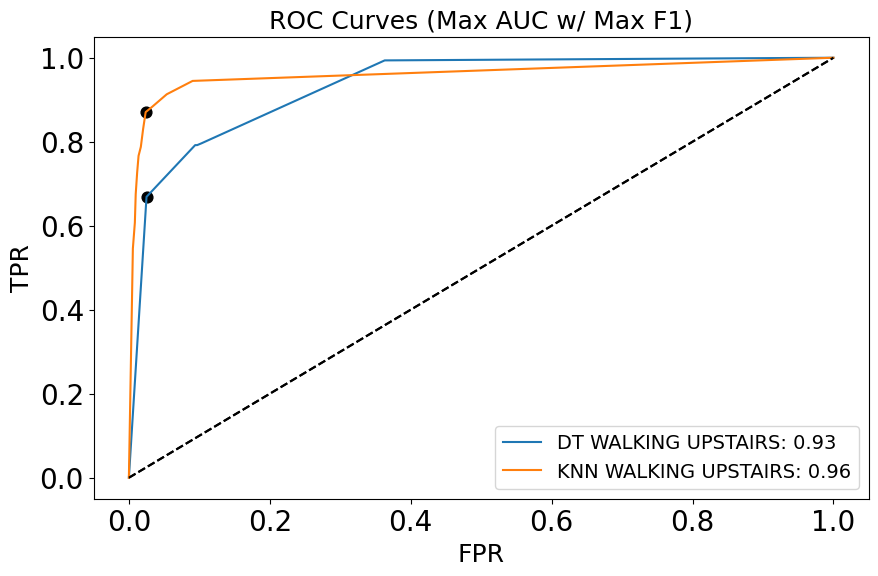

In [86]:
target = 'WALKING_UPSTAIRS'
fig = plt.figure(figsize=(10, 6))

for classifier in [DecisionTreeClassifier(), KNeighborsClassifier()]:
    y = pd.Series(1 if i == target else 0 for i in df['label'])
    y_train, y_test = y[:len(ind_train)], y[len(ind_train):]

    best_class(X_train, y_train, X_test, y_test, target, classifier)

WARNING: Slow (It took around 20 minutes)

Here the performances of each classifier for each target variable. As it can be seen the performances of the Decision Tree's ROCs improved by a factor of max 10% in the case of WALKING UPSTAIRS and by the min of 1% in the case of WALKING (excluding LAYING wich was already perfect). Regarding KNN instead the AUC is consistently above 95%

DecisionTreeClassifier()
Predicting LAYING with the DT:
DecisionTreeClassifier(criterion='entropy', max_depth=1000, random_state=42)

Area Under the Curve (ROC): 1.0

Confusion Matrix: (threshold used: 1.0)
 [[ 537    0]
 [   0 2410]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2410
           1       1.00      1.00      1.00       537

    accuracy                           1.00      2947
   macro avg       1.00      1.00      1.00      2947
weighted avg       1.00      1.00      1.00      2947

Minority class represents 19.14% of the data
Majority class represents 80.86% of the data


DecisionTreeClassifier()
Predicting SITTING with the DT:
DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)

Area Under the Curve (ROC): 0.9620157957236777

Confusion Matrix: (threshold used: 0.5294117647058824)
 [[ 425   66]
 [  93 2363]]
              precision    recall  f1-score   support

           0       0.97     

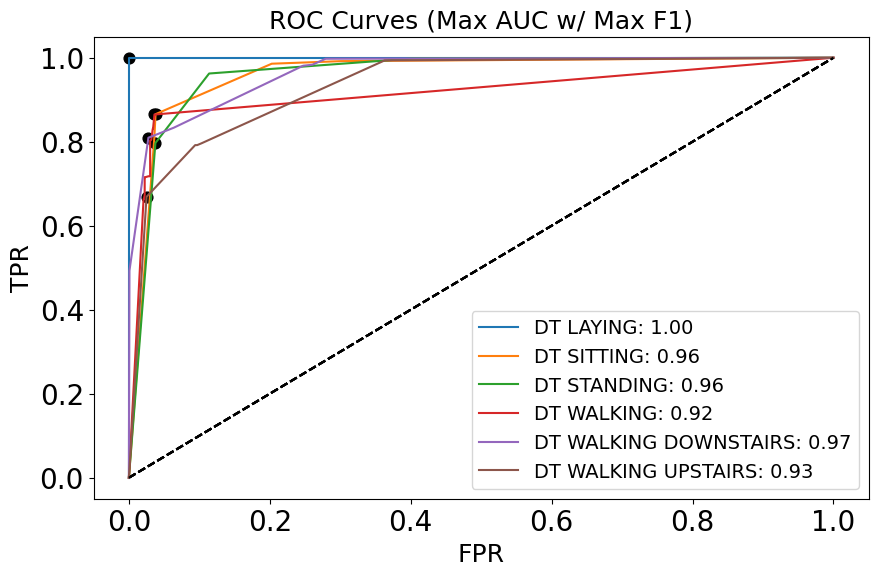

KNeighborsClassifier()
Predicting LAYING with the KNN:
KNeighborsClassifier(n_neighbors=1)

Area Under the Curve (ROC): 1.0

Confusion Matrix: (threshold used: 1.0)
 [[ 537    0]
 [   0 2410]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2410
           1       1.00      1.00      1.00       537

    accuracy                           1.00      2947
   macro avg       1.00      1.00      1.00      2947
weighted avg       1.00      1.00      1.00      2947

Minority class represents 19.14% of the data
Majority class represents 80.86% of the data


KNeighborsClassifier()
Predicting SITTING with the KNN:
KNeighborsClassifier(n_neighbors=17)

Area Under the Curve (ROC): 0.9552448967406807

Confusion Matrix: (threshold used: 0.35294117647058826)
 [[ 420   71]
 [  98 2358]]
              precision    recall  f1-score   support

           0       0.97      0.96      0.97      2456
           1       0.81      0.86      0.83       491

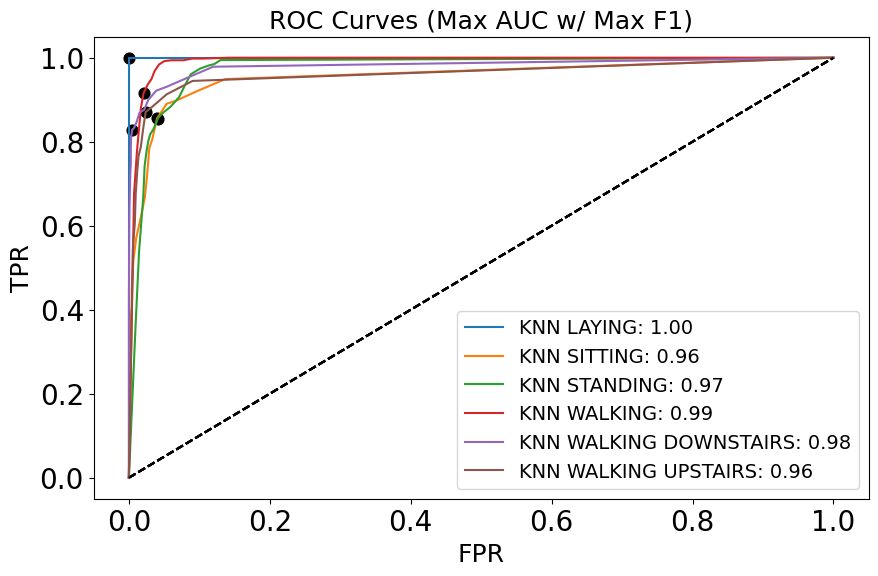

In [87]:
for classifier in [DecisionTreeClassifier(), KNeighborsClassifier()]:
  
    X = df.drop(columns=['label', 'individuals'])
    X_train, X_test = df_train.copy(deep=True).values, df_test.copy(deep=True).values #the original split

    fig = plt.figure(figsize=(10, 6))

    for target in label_loop:
        y = pd.Series(1 if i == target else 0 for i in df['label'])
        y_train, y_test = y[:len(ind_train)], y[len(ind_train):]

        best_class(X_train, y_train, X_test, y_test, target, classifier)

    plt.show()

# Imbalance Learning

This section is the most didactical part of the project as there weren't imbalance in the data as I pointed out in the next cell, as such I had to create some temporary imbalances to test some techniques.

In [88]:
for x in label_loop:
    print('{}: {:.2%}'.format(x[0]+x[1:].lower().replace('_', ' '), sum(df['label'] == x) / len(df)), end='\n')

Laying: 18.88%
Sitting: 17.25%
Standing: 18.51%
Walking: 16.72%
Walking downstairs: 13.65%
Walking upstairs: 14.99%


Here I selected as a target variable again Walking Upstairs, then I reduced by sampling the number of records with that label to 32

In [89]:
reduced_record_n = 32

X_train, X_test = df[:len(ind_train)].copy(deep=True), df[len(ind_train):].copy(deep=True)
X_train['index'] = X_train.index

target = 'WALKING_UPSTAIRS'
target_train = X_train[X_train['label'] == target]
undersampled_target_train = target_train.sample(n=reduced_record_n, random_state=42)

indexes_to_drop = []
for el in target_train['index'].values:
    if el not in undersampled_target_train['index'].values:
        indexes_to_drop.append(el)

undersampled = X_train.drop(indexes_to_drop, axis='index')

undersampled

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)",index
0,WALKING_DOWNSTAIRS,22,0.465563,-0.198698,0.910931,-0.366162,-0.318012,0.787213,-0.872989,-0.635353,-0.162709,-0.027400,0.222960,0
1,WALKING_DOWNSTAIRS,7,0.586004,-0.137829,0.886878,-0.461135,-0.479952,0.015080,-0.173580,-0.373514,-0.297979,0.220396,0.178975,1
2,WALKING,27,0.074430,-0.159944,0.983467,-0.027458,-0.586446,-0.146056,-0.871813,-0.734109,-0.699480,-0.541710,0.192929,2
3,SITTING,21,-0.931924,0.272900,0.879176,-0.836731,-0.988630,-0.343720,-0.999637,-0.999630,-0.990721,-0.992667,-0.106678,3
4,WALKING_DOWNSTAIRS,29,0.562230,-0.096393,0.940240,-0.614440,-0.342756,-0.062700,-0.793212,-0.875178,-0.018269,-0.053877,0.150598,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,WALKING,25,-0.479744,-0.109967,0.929265,-0.394155,-0.383835,0.153280,-0.867920,-0.865636,-0.341291,-0.597857,0.159112,7347
7348,WALKING_DOWNSTAIRS,25,-0.283244,-0.032432,0.895652,-0.618833,-0.468762,0.561815,-0.854999,-0.907044,-0.543926,-0.428790,0.106156,7348
7349,WALKING,25,-0.547082,-0.146223,0.980335,-0.254914,-0.538672,0.075773,-0.836055,-0.904412,-0.458087,-0.657606,0.183547,7349
7350,STANDING,5,-0.937503,0.003736,0.975233,-0.278032,-0.993040,-0.223205,-0.998628,-0.999874,-0.995559,-0.986650,0.081388,7350


This are the indices with the entire dataset minus the records excluded by the sampling of the records related to Walking Upstairs

In [90]:
indexes_to_consider = np.array((undersampled['index'].values.tolist()+X_test.index.tolist()))
indexes_to_consider

array([    0,     1,     2, ..., 10296, 10297, 10298])

As it can be seen now the weight of the classes is heavily unbalanced

In [91]:
target_variable = [1 if i == target else 0 for i in df['label'][indexes_to_consider]]

X = df.drop(columns=['label', 'individuals']).loc[indexes_to_consider].values
y = pd.Series(target_variable)

X_train, X_test, y_train, y_test = X[:len(undersampled)], X[len(undersampled):], y[:len(undersampled)], y[len(undersampled):]
print('Minority class represents {:.2%} of the data'.format(np.min(np.unique(y_train, return_counts=True)[1])/len(X_train)), sep='')
print('Majority class represents {:.2%} of the data'.format(np.max(np.unique(y_train, return_counts=True)[1])/len(X_train)), sep='')

Minority class represents 0.51% of the data
Majority class represents 99.49% of the data


<font size = "4">Random Undersampling, Random Oversampling and SMOTE</font>

ROS: Resampled dataset shape Counter({0: 6279, 1: 6279})
RUS: Resampled dataset shape Counter({0: 32, 1: 32})
SMOTE: Resampled dataset shape Counter({0: 6279, 1: 6279})


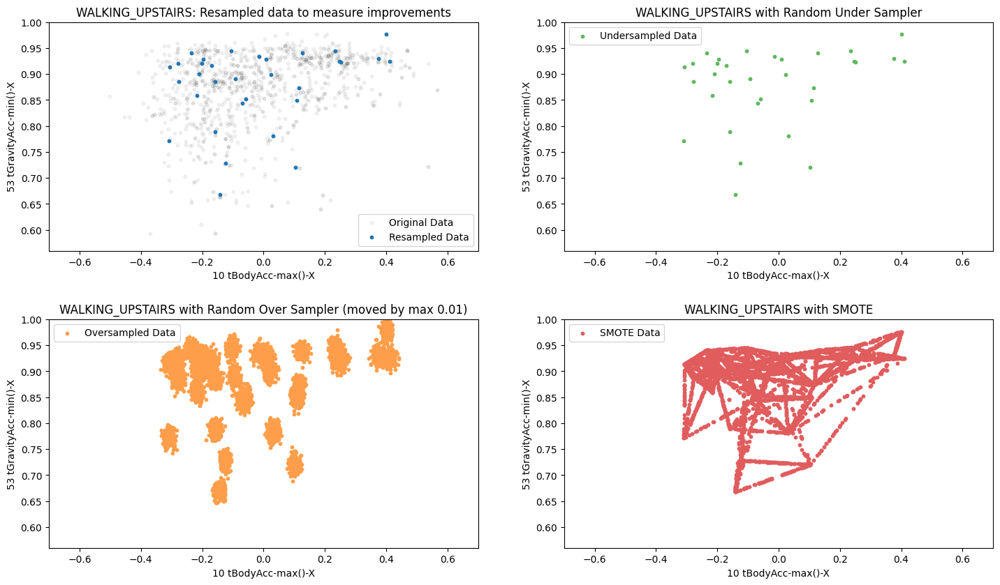

In [92]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.under_sampling import CondensedNearestNeighbour
from imblearn.over_sampling import SMOTE

from collections import Counter

x_lim1 = -0.7
x_lim2 = 0.7
y_lim1 = 0.56

target = 'WALKING_UPSTAIRS'
feat_x = '10 tBodyAcc-max()-X'
feat_y = '53 tGravityAcc-min()-X'

rus = RandomUnderSampler(random_state=42)
ros = RandomOverSampler(random_state=42)
sm = SMOTE(random_state=42)

fig = plt.figure(figsize=(46, 43)) 
fig_dims = (8, 5)

plt.subplot2grid(fig_dims, (0, 0), title='{}: Resampled data to measure improvements'.format(target))
original_data = df[df['label'] == target].loc[:len(ind_train)]
plt.scatter(original_data[feat_x], original_data[feat_y], color='k', s=10, alpha=0.05, label='Original Data')
plt.scatter(X_train[:,0][y_train == 1], X_train[:,2][y_train == 1], s=10, label='Resampled Data')

plt.ylabel(feat_y)
plt.xlabel(feat_x)
plt.xlim(x_lim1, x_lim2)
plt.ylim(y_lim1, 1)
plt.legend()

imb_names = ['ROS', 'RUS', 'SMOTE']
imb_tech = [ros, rus, sm]

fitted_imbalance = {}
for name_imb, imb in zip(imb_names, imb_tech):

    X_imb, y_imb = imb.fit_resample(X_train, y_train)
    fitted_imbalance[name_imb] = (X_imb, y_imb)
    
    if name_imb == 'RUS':
        plt.subplot2grid(fig_dims, (0, 1), title='{} with Random Under Sampler'.format(target))
        movement_x, movement_y = 0, 0
        color = '#60b760'
        label = 'Undersampled Data'
    elif name_imb == 'ROS':
        plt.subplot2grid(fig_dims, (1, 0), title='{} with Random Over Sampler (moved by max 0.01)'.format(target))
        movement_x, movement_y = np.random.normal(0, 0.01, size=len(X_imb[:,0][y_imb == 1])), np.random.normal(0, 0.01, size=len(X_imb[:,0][y_imb == 1]))
        color='#ff9e4a'
        label='Oversampled Data'
    elif name_imb == 'SMOTE':
        plt.subplot2grid(fig_dims, (1, 1), title='{} with SMOTE'.format(target))
        movement_x, movement_y = 0, 0
        color='#e05c5d'
        label='SMOTE Data'
    
    plt.scatter(X_imb[:,0][y_imb == 1]+movement_x, X_imb[:,2][y_imb == 1]+movement_y, color=color, s=10, label=label)
    print('{}: Resampled dataset shape {}'.format(name_imb, Counter(y_imb)))

    plt.ylabel(feat_y)
    plt.xlabel(feat_x)
    plt.xlim(x_lim1, x_lim2)
    plt.ylim(y_lim1, 1)
    plt.legend()

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.3)

Performances using the Decision Tree

REDUCED
Predicting WALKING_UPSTAIRS with the Decision Tree (ORIGINAL):
Best Estimator: DecisionTreeClassifier(class_weight={0: 1, 1: 1}, criterion='entropy',
                       max_depth=2, random_state=42)
Area Under the Curve (ROC):  0.5
Confusion Matrix:
 [[   0  471]
 [   0 2476]]
              precision    recall  f1-score   support

           0       0.84      1.00      0.91      2476
           1       0.00      0.00      0.00       471

    accuracy                           0.84      2947
   macro avg       0.42      0.50      0.46      2947
weighted avg       0.71      0.84      0.77      2947
Minority class represents 0.51% of the data
Majority class represents 99.49% of the data

ROS


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Predicting WALKING_UPSTAIRS with the Decision Tree (ORIGINAL):
Best Estimator: DecisionTreeClassifier(class_weight={0: 1, 1: 5}, criterion='entropy',
                       min_samples_leaf=10, random_state=42)
Area Under the Curve (ROC):  0.7601183677529336
Confusion Matrix:
 [[ 249  222]
 [  33 2443]]
              precision    recall  f1-score   support

           0       0.92      0.99      0.95      2476
           1       0.88      0.53      0.66       471

    accuracy                           0.91      2947
   macro avg       0.90      0.76      0.81      2947
weighted avg       0.91      0.91      0.90      2947
Minority class represents 50.00% of the data
Majority class represents 50.00% of the data

RUS
Predicting WALKING_UPSTAIRS with the Decision Tree (ORIGINAL):
Best Estimator: DecisionTreeClassifier(class_weight={0: 1, 1: 1}, min_samples_leaf=3,
                       random_state=42)
Area Under the Curve (ROC):  0.8171246514308058
Confusion Matrix:
 [[ 371  100]
 [ 33

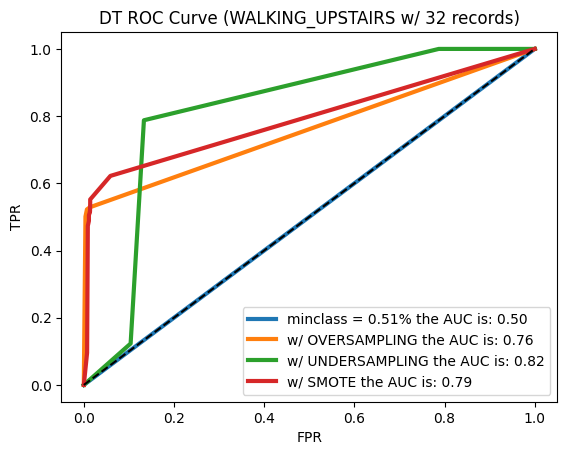

In [93]:
#JUST TRAIN ON THE REDUCED DATASET, THE OVERSMAPLING, THE UNDERSAMPLNG AND SMOTE
clf = DecisionTreeClassifier()
param_grid = [{'min_samples_leaf' : [1,3,10], 'class_weight' : [{0:1, 1: 1}, {0:1, 1: 5}], 'criterion' : ['gini', 'entropy'],
              'max_depth': [None, 2, 5], 'random_state' : [42],  'min_samples_split' : [2, 5, 10]}]
sampled_frames = [(X_train, y_train)]+[(fitted_imbalance[name_imb]) for name_imb in imb_names]

for n, what in enumerate(['REDUCED']+imb_names):

    print(what)

    X_imb, y_imb = sampled_frames[n]
    gridsearch = GridSearchCV(clf, param_grid, cv=5, scoring='roc_auc')
    gridsearch.fit(X_imb, y_imb)
    clf = gridsearch.best_estimator_
    clf.fit(X_imb, y_imb)
    prune_duplicate_leaves(clf)

    y_pred = clf.predict(X_test)
    y_score = clf.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
    roc_auc = auc(fpr, tpr)

    print('Predicting {} with the Decision Tree (ORIGINAL):'.format(target))
    print('Best Estimator:', gridsearch.best_estimator_)
    print('Area Under the Curve (ROC): ', roc_auc)
    print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred, labels=[1,0]))
    print(classification_report(y_test, y_pred), end='')

    minclass = np.min(np.unique(y_imb, return_counts=True)[1])/len(X_imb)
    maxclass = np.max(np.unique(y_imb, return_counts=True)[1])/len(X_imb)
    print('Minority class represents {:.2%} of the data'.format(minclass), sep='')
    print('Majority class represents {:.2%} of the data'.format(maxclass), sep='')
    print()

    labels_dict = {'REDUCED':'minclass = {rate:.2%} the AUC is: {auc:.2f}'.format(rate=minclass, auc=roc_auc),
                   'ROS': 'w/ OVERSAMPLING the AUC is: {auc:.2f}'.format(auc=roc_auc),
                   'RUS': 'w/ UNDERSAMPLING the AUC is: {auc:.2f}'.format(auc=roc_auc),
                   'SMOTE': 'w/ SMOTE the AUC is: {auc:.2f}'.format(auc=roc_auc)}
    
    plt.plot(fpr, tpr, label=labels_dict[what], linewidth=3.0)

plt.plot([0,1], [0,1], 'k--')
plt.title("DT ROC Curve ({} w/ {} records)".format(target, reduced_record_n))
plt.ylabel('TPR')
plt.xlabel('FPR')
plt.legend()
plt.show()

Predicting WALKING_UPSTAIRS with the Desision Tree (WITH UNDERSAMPLING):
Area Under the Curve (ROC):  0.8171246514308058
Confusion Matrix:
 [[ 371  100]
 [ 330 2146]]
              precision    recall  f1-score   support

           0       0.96      0.87      0.91      2476
           1       0.53      0.79      0.63       471

    accuracy                           0.85      2947
   macro avg       0.74      0.83      0.77      2947
weighted avg       0.89      0.85      0.86      2947
Minority class represents 50.0% of the data
Majority class represents 50.0% of the data


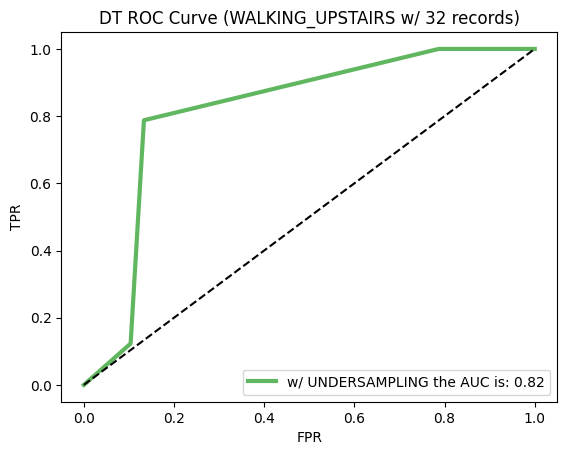

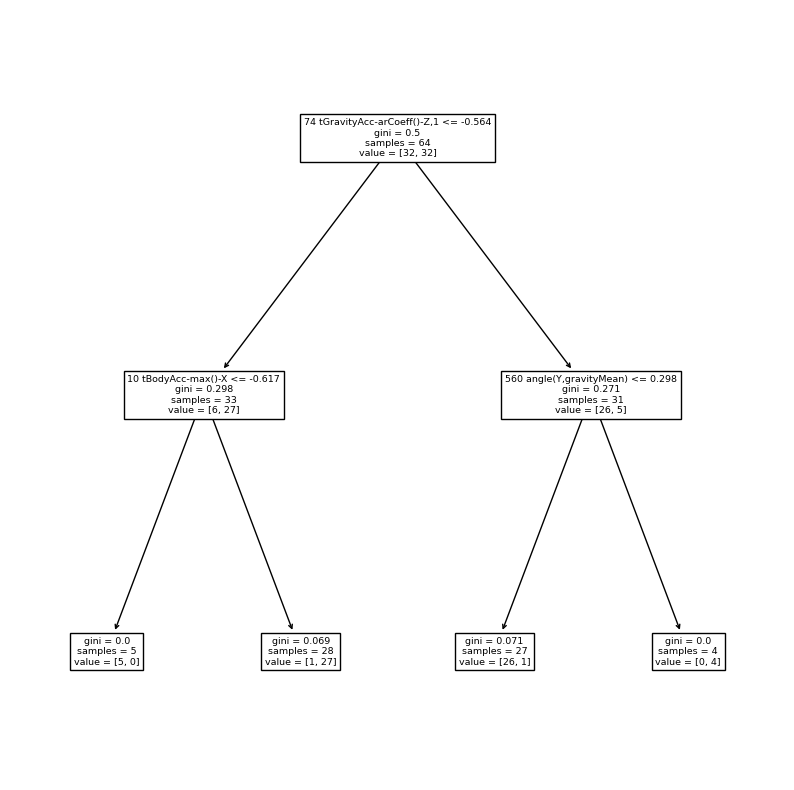

In [94]:
X_rus, y_rus = sampled_frames[2]
clf = DecisionTreeClassifier()
param_grid = [{'min_samples_leaf' : [1,3,10], 'class_weight' : [{0:1, 1: 1}, {0:1, 1: 5}], 'criterion' : ['gini', 'entropy'],
               'max_depth': [None, 2, 5], 'random_state' : [42],  'min_samples_split' : [2, 5, 10]}]
gridsearch = GridSearchCV(clf, param_grid, cv=5, scoring='roc_auc')
gridsearch.fit(X_rus, y_rus)
clf = gridsearch.best_estimator_

clf.fit(X_rus, y_rus)
prune_duplicate_leaves(clf)

y_pred = clf.predict(X_test)
y_score = clf.predict_proba(X_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc = auc(fpr, tpr)

print('Predicting {} with the Desision Tree (WITH UNDERSAMPLING):'.format(target))
print('Area Under the Curve (ROC): ', roc_auc)
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred, labels=[1,0]))
print(classification_report(y_test, y_pred), end='')

minclass = round(np.min(np.unique(y_rus, return_counts=True)[1])/len(X_rus)*100, 2)
maxclass = round(np.max(np.unique(y_rus, return_counts=True)[1])/len(X_rus)*100, 2)
print('Minority class represents ', minclass, '% of the data', sep='')
print('Majority class represents ', maxclass, '% of the data', sep='')

plt.plot(fpr, tpr, label='w/ UNDERSAMPLING the AUC is: ' + str(round(roc_auc, 2)), color='#60b760', linewidth=3.0)
plt.plot([0,1], [0,1], 'k--')
plt.title("DT ROC Curve ({} w/ {} records)".format(target, reduced_record_n))
plt.ylabel('TPR')
plt.xlabel('FPR')
plt.legend()
plt.show()

plt.figure(figsize=(10,10))
tree.plot_tree(clf, feature_names=features_to_keep)
plt.show()

In [95]:
for idx, el in enumerate(features_to_keep):
    print('X[{idx}] = {el}'.format(idx=idx, el=el))

X[0] = 10 tBodyAcc-max()-X
X[1] = 42 tGravityAcc-mean()-Y
X[2] = 53 tGravityAcc-min()-X
X[3] = 74 tGravityAcc-arCoeff()-Z,1
X[4] = 167 tBodyGyroJerk-mad()-X
X[5] = 297 fBodyAcc-skewness()-X
X[6] = 331 fBodyAcc-bandsEnergy()-1,8
X[7] = 411 fBodyAccJerk-bandsEnergy()-9,16
X[8] = 427 fBodyGyro-std()-X
X[9] = 504 fBodyAccMag-std()
X[10] = 560 angle(Y,gravityMean)


Performances using KNN

REDUCED
Predicting WALKING_UPSTAIRS with the Decision Tree (ORIGINAL):
Best Estimator: KNeighborsClassifier(n_neighbors=13)
Area Under the Curve (ROC):  0.8437569670964401
Confusion Matrix:
 [[  43  428]
 [   0 2476]]
              precision    recall  f1-score   support

           0       0.85      1.00      0.92      2476
           1       1.00      0.09      0.17       471

    accuracy                           0.85      2947
   macro avg       0.93      0.55      0.54      2947
weighted avg       0.88      0.85      0.80      2947
Minority class represents 0.51% of the data
Majority class represents 99.49% of the data

ROS
Predicting WALKING_UPSTAIRS with the Decision Tree (ORIGINAL):
Best Estimator: KNeighborsClassifier(n_neighbors=1)
Area Under the Curve (ROC):  0.6895191717344255
Confusion Matrix:
 [[ 181  290]
 [  13 2463]]
              precision    recall  f1-score   support

           0       0.89      0.99      0.94      2476
           1       0.93      0.38      0.54 

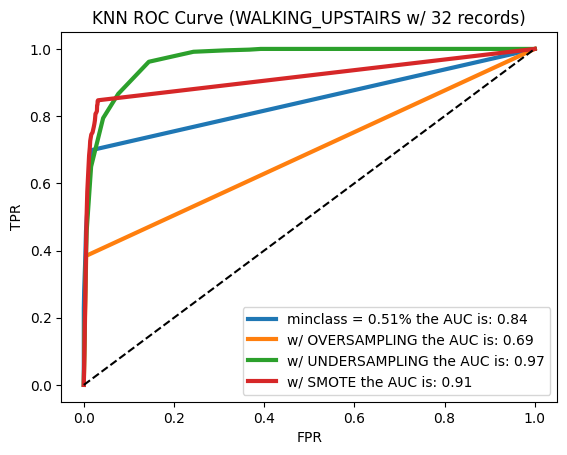

In [96]:
clf = KNeighborsClassifier()
param_grid = [{'n_neighbors' : np.arange(1,20).tolist()}]

for n, what in enumerate(['REDUCED']+imb_names):

    print(what)

    X_imb, y_imb = sampled_frames[n]
    gridsearch = GridSearchCV(clf, param_grid, cv=5, scoring='roc_auc')
    gridsearch.fit(X_imb, y_imb)
    clf = gridsearch.best_estimator_
    clf.fit(X_imb, y_imb)

    y_pred = clf.predict(X_test)
    y_score = clf.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
    roc_auc = auc(fpr, tpr)

    print('Predicting {} with the Decision Tree (ORIGINAL):'.format(target))
    print('Best Estimator:', gridsearch.best_estimator_)
    print('Area Under the Curve (ROC): ', roc_auc)
    print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred, labels=[1,0]))
    print(classification_report(y_test, y_pred), end='')

    minclass = np.min(np.unique(y_imb, return_counts=True)[1])/len(X_imb)
    maxclass = np.max(np.unique(y_imb, return_counts=True)[1])/len(X_imb)
    print('Minority class represents {:.2%} of the data'.format(minclass), sep='')
    print('Majority class represents {:.2%} of the data'.format(maxclass), sep='')
    print()

    labels_dict = {'REDUCED':'minclass = {rate:.2%} the AUC is: {auc:.2f}'.format(rate=minclass, auc=roc_auc),
                   'ROS': 'w/ OVERSAMPLING the AUC is: {auc:.2f}'.format(auc=roc_auc),
                   'RUS': 'w/ UNDERSAMPLING the AUC is: {auc:.2f}'.format(auc=roc_auc),
                   'SMOTE': 'w/ SMOTE the AUC is: {auc:.2f}'.format(auc=roc_auc)}
    
    plt.plot(fpr, tpr, label=labels_dict[what], linewidth=3.0)

plt.plot([0,1], [0,1], 'k--')
plt.title("KNN ROC Curve ({} w/ {} records)".format(target, reduced_record_n))
plt.ylabel('TPR')
plt.xlabel('FPR')
plt.legend()
plt.show()

Predicting WALKING_UPSTAIRS with KNN (WITH UNDERSAMPLING):
Area Under the Curve (ROC):  0.9690403671424014
Confusion Matrix:
 [[ 469    2]
 [ 777 1699]]
              precision    recall  f1-score   support

           0       1.00      0.69      0.81      2476
           1       0.38      1.00      0.55       471

    accuracy                           0.74      2947
   macro avg       0.69      0.84      0.68      2947
weighted avg       0.90      0.74      0.77      2947
Minority class represents 50.0% of the data
Majority class represents 50.0% of the data


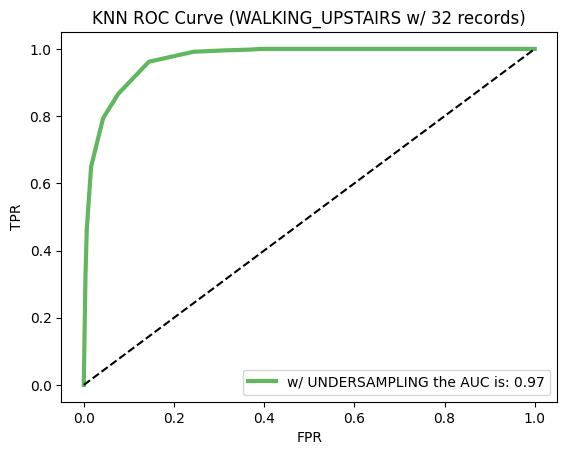

In [97]:
X_rus, y_rus = sampled_frames[2]
clf = KNeighborsClassifier()
param_grid = [{'n_neighbors' : np.arange(1,20).tolist()}]
gridsearch = GridSearchCV(clf, param_grid, cv=5, scoring='roc_auc')
gridsearch.fit(X_rus, y_rus)
clf = gridsearch.best_estimator_
clf.fit(X_rus, y_rus)

y_pred = clf.predict(X_test)
y_score = clf.predict_proba(X_test)
fpr, tpr, _ = roc_curve(y_test, y_score[:, 1])
roc_auc = auc(fpr, tpr)

print('Predicting {} with KNN (WITH UNDERSAMPLING):'.format(target))
print('Area Under the Curve (ROC): ', roc_auc)
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred, labels=[1,0]))
print(classification_report(y_test, y_pred), end='')

minclass = round(np.min(np.unique(y_rus, return_counts=True)[1])/len(X_rus)*100, 2)
maxclass = round(np.max(np.unique(y_rus, return_counts=True)[1])/len(X_rus)*100, 2)
print('Minority class represents ', minclass, '% of the data', sep='')
print('Majority class represents ', maxclass, '% of the data', sep='')

plt.plot(fpr, tpr, label='w/ UNDERSAMPLING the AUC is: ' + str(round(roc_auc, 2)), color='#60b760', linewidth=3.0)
plt.plot([0,1], [0,1], 'k--')
plt.title("KNN ROC Curve ({} w/ {} records)".format(target, reduced_record_n))
plt.ylabel('TPR')
plt.xlabel('FPR')
plt.legend()
plt.show()

# Anomaly Detection

The apporach with the following techniques will be local, I will use the labels of the records to look for the outliers pertaining to each class

In [98]:
rdf = df
rdf_train, rdf_test = df[:len(ind_train)], df[len(ind_train):]
rdf_train_val, rdf_test_val = rdf_train[features_to_keep].values, rdf_test[features_to_keep].values

<font size = "5">Dataset reduced with Feature selection</font>

<font size = "4">Boxplot Method</font>

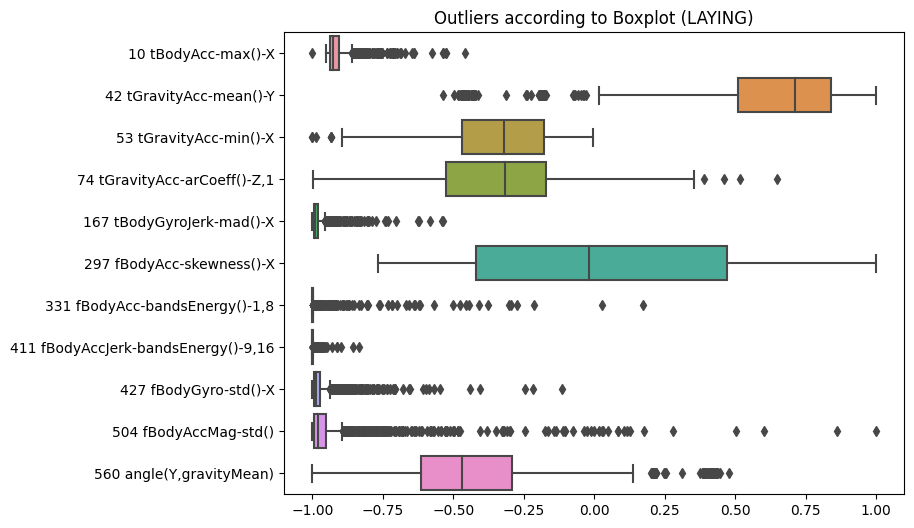

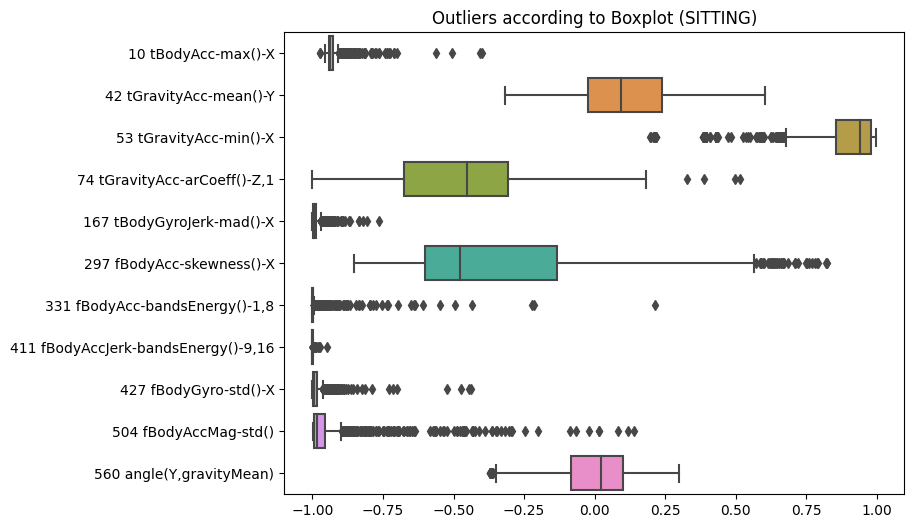

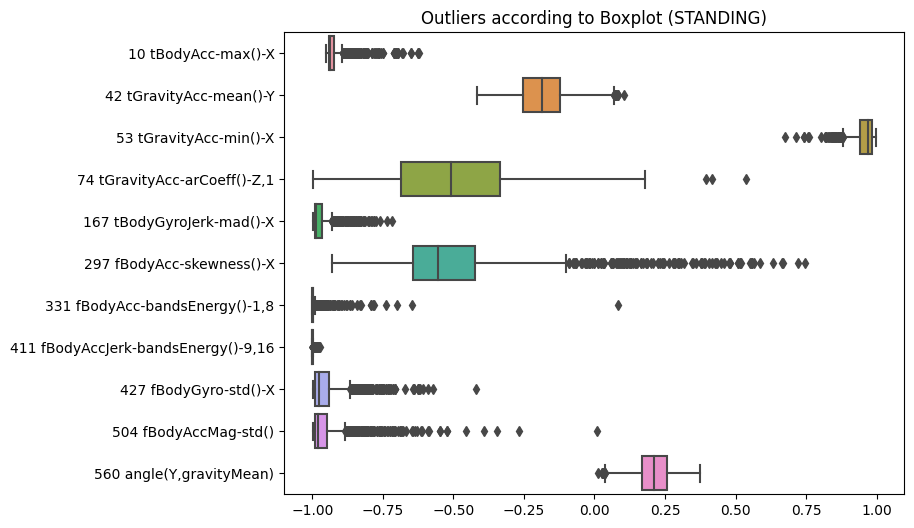

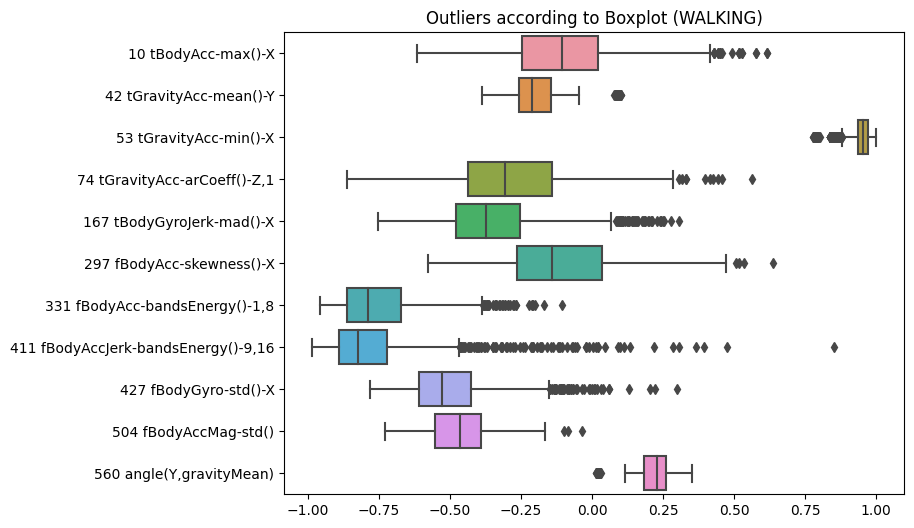

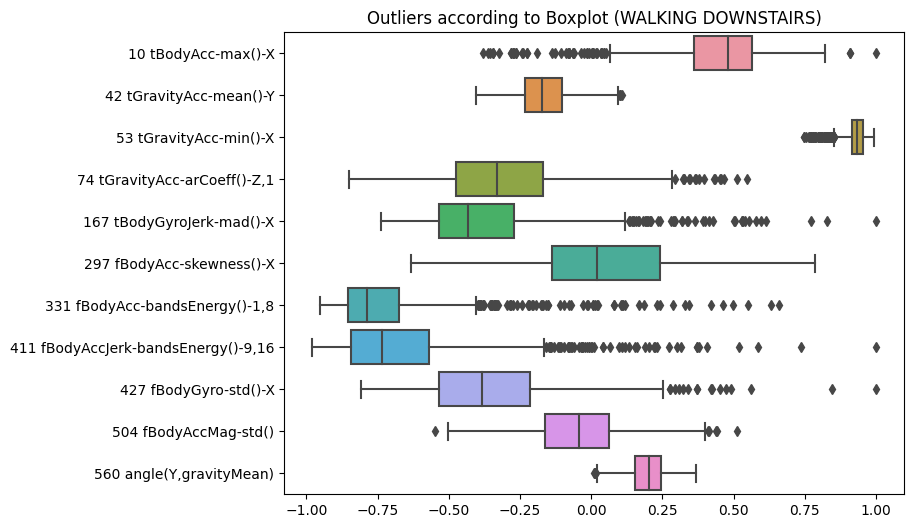

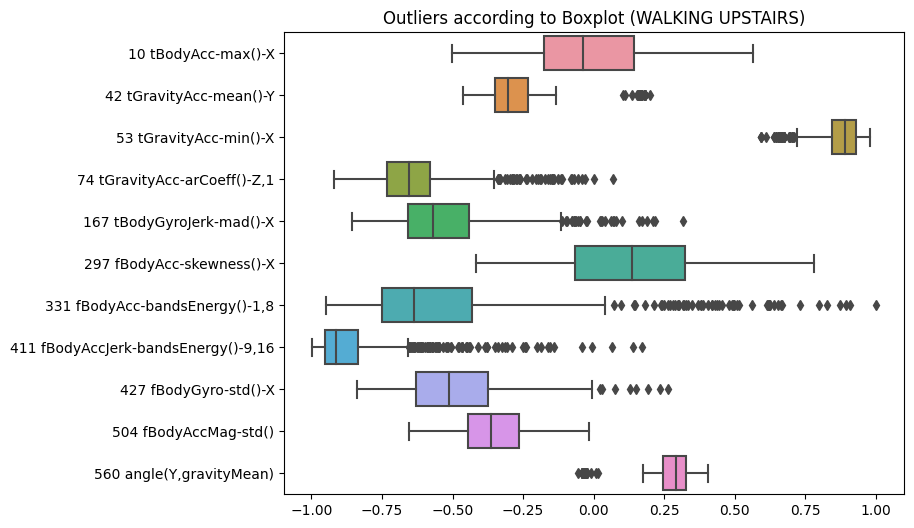

In [99]:
for targ in label_loop:
    plt.figure(figsize=(8, 6))

    sns.boxplot(data=[rdf_train_val[:,x][rdf_train['label'] == targ] for x in range(len(features_to_keep))], orient="h")
    plt.yticks([x for x in range(len(features_to_keep))], features_to_keep)
    plt.title('Outliers according to Boxplot ({})'.format(targ.replace('_', ' ')))
    plt.show()

In [100]:
boxplot_idx = []
for targ in label_loop:
    print('--------------------', targ.replace('_',' '), '--------------------')
    for col in features_to_keep:
        Q1 = rdf_train[col].quantile(0.25)
        Q3 = rdf_train[col].quantile(0.75)
        IQR = Q3 - Q1

        filtering = (rdf_train[col] >= Q1 - 1.5 * IQR) & (rdf_train[col] <= Q3 + 1.5 *IQR)

        print(col, 'number of outliers:', len(rdf_train.loc[~filtering].index))

        for x in rdf_train.loc[~filtering].index: # the tilde ~ inverts a boolean series
            boxplot_idx.append(x)
        
    print()
boxplot_idx = set(boxplot_idx)
print('Total Outliers according to boxplot=', len(boxplot_idx))

-------------------- LAYING --------------------
10 tBodyAcc-max()-X number of outliers: 0
42 tGravityAcc-mean()-Y number of outliers: 686
53 tGravityAcc-min()-X number of outliers: 1465
74 tGravityAcc-arCoeff()-Z,1 number of outliers: 38
167 tBodyGyroJerk-mad()-X number of outliers: 24
297 fBodyAcc-skewness()-X number of outliers: 0
331 fBodyAcc-bandsEnergy()-1,8 number of outliers: 380
411 fBodyAccJerk-bandsEnergy()-9,16 number of outliers: 541
427 fBodyGyro-std()-X number of outliers: 25
504 fBodyAccMag-std() number of outliers: 3
560 angle(Y,gravityMean) number of outliers: 776

-------------------- SITTING --------------------
10 tBodyAcc-max()-X number of outliers: 0
42 tGravityAcc-mean()-Y number of outliers: 686
53 tGravityAcc-min()-X number of outliers: 1465
74 tGravityAcc-arCoeff()-Z,1 number of outliers: 38
167 tBodyGyroJerk-mad()-X number of outliers: 24
297 fBodyAcc-skewness()-X number of outliers: 0
331 fBodyAcc-bandsEnergy()-1,8 number of outliers: 380
411 fBodyAccJerk-b

In [101]:
reverted_map_dict

{'LAYING': 6,
 'SITTING': 4,
 'STANDING': 5,
 'WALKING': 1,
 'WALKING_DOWNSTAIRS': 3,
 'WALKING_UPSTAIRS': 2}

In [102]:
mapping_color

{'LAYING': 'm',
 'SITTING': 'y',
 'STANDING': 'c',
 'WALKING': 'b',
 'WALKING_DOWNSTAIRS': 'g',
 'WALKING_UPSTAIRS': 'r'}

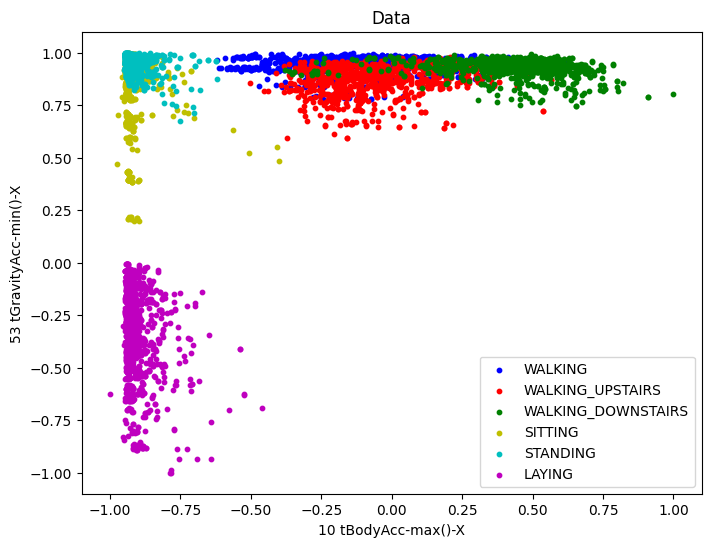

In [103]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, label = k, s=10)
plt.xlabel(rdf.columns[2:][0])
plt.ylabel(rdf.columns[2:][2])
plt.title('Data')
plt.legend()

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
1,WALKING_DOWNSTAIRS,7,0.586004,-0.137829,0.886878,-0.461135,-0.479952,0.015080,-0.173580,-0.373514,-0.297979,0.220396,0.178975
6,WALKING_UPSTAIRS,8,-0.152290,-0.278713,0.830751,-0.620776,-0.502992,-0.236005,-0.315129,-0.666138,-0.407761,-0.443602,0.276130
10,LAYING,25,-0.833392,0.395783,-0.706119,-0.681377,-0.964729,-0.394557,-0.985655,-0.999036,-0.942702,-0.862428,-0.203878
12,WALKING_UPSTAIRS,14,-0.157973,-0.336491,0.594053,-0.665479,-0.648672,0.008193,0.070828,-0.313759,-0.255031,-0.232874,0.322570
16,LAYING,27,-0.931599,0.524314,-0.480768,0.043777,-0.997036,-0.157512,-0.999898,-0.999865,-0.996713,-0.993794,-0.299334
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7321,WALKING,21,-0.285426,-0.379532,0.862317,-0.318042,-0.174320,-0.081796,-0.711198,-0.593563,-0.478789,-0.374925,0.347063
7326,WALKING_UPSTAIRS,23,0.128540,-0.233474,0.831912,-0.559772,-0.477663,0.102961,-0.371980,-0.845378,-0.539639,-0.397553,0.245501
7329,WALKING_UPSTAIRS,29,0.281461,-0.233606,0.931133,-0.809722,-0.406905,-0.074277,-0.014166,-0.926530,-0.491121,-0.057813,0.246731
7333,LAYING,8,-0.939857,0.907722,-0.288291,-0.110801,-0.997398,-0.378558,-0.999929,-0.999880,-0.994591,-0.996356,-0.730349


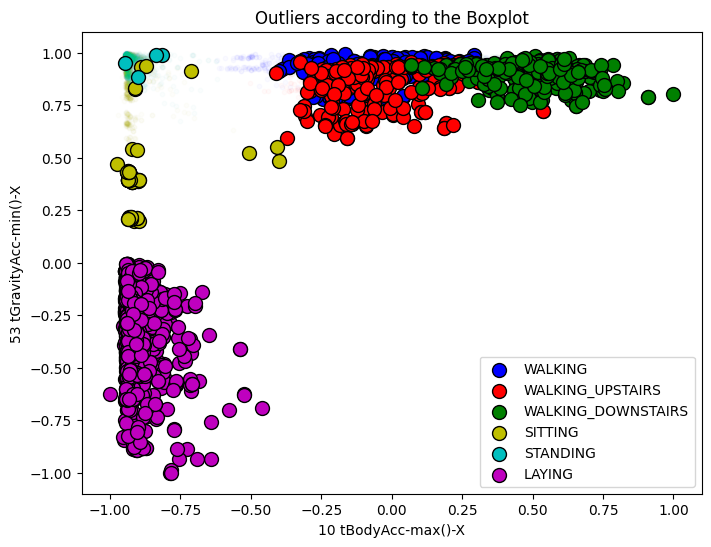

In [104]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(rdf_train.loc[boxplot_idx].values[:,2][rdf_train['label'].loc[boxplot_idx] == k], rdf_train.loc[boxplot_idx].values[:,4][rdf_train['label'].loc[boxplot_idx] == k], edgecolor='k', marker='o', c=v, label = k, s=100)
plt.xlabel(rdf.columns[2:][0])
plt.ylabel(rdf.columns[2:][2])
plt.title('Outliers according to the Boxplot')
plt.legend()

df_bpout = rdf_train.loc[boxplot_idx].sort_index()
df_bpout

In [105]:
np.unique(df_bpout['label'].values, return_counts=True)

(array(['LAYING', 'SITTING', 'STANDING', 'WALKING', 'WALKING_DOWNSTAIRS',
        'WALKING_UPSTAIRS'], dtype=object),
 array([1407,   63,    4,  200,  334,  273]))

<font size = "4">Density Based: DBSCAN</font>

In [106]:
!pip install kneed

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


LAYING:
The point of maximum curvature has a distance of 0.4418193701745591
(array([-1,  0,  1]), array([  48, 1284,   75]))

SITTING:
The point of maximum curvature has a distance of 0.4026844727891745
(array([-1,  0]), array([  10, 1276]))

STANDING:
The point of maximum curvature has a distance of 0.2807525811512598
(array([-1,  0]), array([  19, 1355]))

WALKING:
The point of maximum curvature has a distance of 0.413653665745993
(array([-1,  0]), array([   5, 1221]))

WALKING_DOWNSTAIRS:
The point of maximum curvature has a distance of 0.5891899629350719
(array([-1,  0]), array([ 11, 975]))

WALKING_UPSTAIRS:
The point of maximum curvature has a distance of 0.4546713959653397
(array([-1,  0]), array([   3, 1070]))

How many noise points: 96 
Which: [434, 1015, 1096, 1123, 1196, 1285, 1313, 1408, 1484, 1488, 1905, 2177, 2295, 2404, 2424, 2470, 2711, 2721, 2905, 2956, 2991, 3200, 3309, 3397, 3613, 3687, 3715, 3836, 3846, 4256, 4265, 4495, 4851, 4868, 4894, 4957, 5470, 5511, 5530, 557

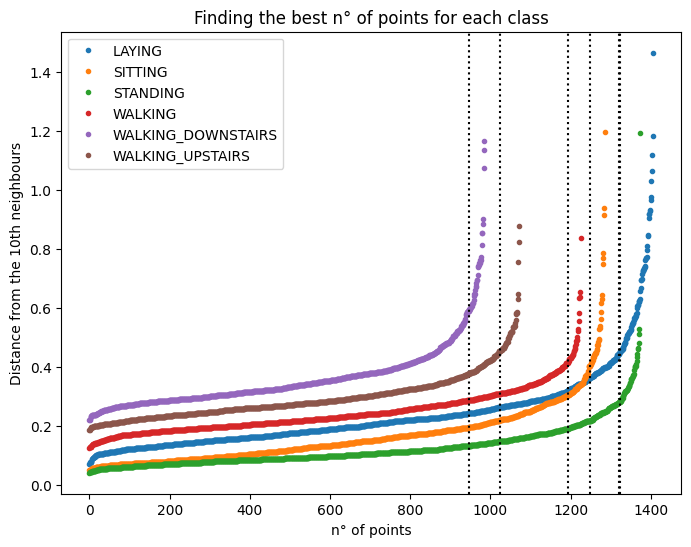

In [107]:
from sklearn.cluster import DBSCAN
from scipy.spatial.distance import pdist, squareform
from kneed import KneeLocator

db_outliers = []

plt.figure(figsize=(8, 6))

for targ in label_loop:
    redefined_for_temp_target = rdf_train[rdf_train['label'] == targ][features_to_keep]
    rdf_train_val = redefined_for_temp_target.values
    
    ####################################
    
    metrica = 'euclidean'
    distanza = squareform(pdist(rdf_train_val, metrica))

    punti = 10
    kth_distances = []
    for dist in distanza:
        index_kth_dist = np.argsort(dist)[punti]
        kth_distances.append(dist[index_kth_dist])
    
    plt.plot(range(0, len(kth_distances)), sorted(kth_distances), marker='.', linewidth=0, label=targ)
    plt.title('Finding the best n° of points for each class')
    plt.ylabel('Distance from the {}th neighbours'.format(punti))
    plt.xlabel('n° of points')
    plt.grid()
    
    
    kneedle = KneeLocator(np.arange(0, len(kth_distances)), np.array(sorted(kth_distances)[:]), S=1.0, curve="convex", direction="increasing")
    plt.axvline(kneedle.knee, c='k', ls=':')
    
    #####################################
    
    epsilon = sorted(kth_distances)[kneedle.knee]

    X_dbscan = rdf_train_val.copy()
    dbscan = DBSCAN(eps=epsilon, min_samples=punti)
    dbscan.fit(X_dbscan)
    
    print('{}:\nThe point of maximum curvature has a distance of {}'.format(targ, epsilon))
    print(np.unique(dbscan.labels_, return_counts=True))
    
    for x in redefined_for_temp_target[dbscan.labels_ == -1].index:
        db_outliers.append(x)
    print()

plt.legend()

print('How many noise points:', len(db_outliers), '\nWhich:', db_outliers)

rdf_train_val = rdf_train[features_to_keep].values

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
434,LAYING,14,-0.783909,0.511791,-0.235591,-0.846852,-0.931090,0.386452,-0.917136,-0.994536,-0.889339,-0.162282,-0.305398
3715,LAYING,16,-0.894313,-0.496213,-0.272745,-0.952757,-0.974727,0.802399,-0.998355,-0.999019,-0.976369,-0.929185,0.445582
3836,LAYING,25,-0.783548,-0.535222,-0.986149,-0.819643,-0.975475,0.391861,-0.901866,-0.999066,-0.900744,-0.502400,0.478157
3846,LAYING,25,-0.838527,0.033684,-0.672151,-0.947335,-0.957771,0.852214,-0.962614,-0.998542,-0.930468,-0.728547,0.059714
4256,LAYING,25,-0.943929,0.911067,-0.245004,-0.980033,-0.946376,0.843010,-0.718368,-0.997716,-0.736281,-0.322415,-0.783544
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6881,WALKING_DOWNSTAIRS,23,0.550072,-0.095528,0.921475,-0.252127,-0.204365,-0.514101,-0.206184,1.000000,-0.327869,0.218170,0.150938
7063,WALKING_DOWNSTAIRS,14,0.676753,-0.243344,0.767060,-0.420070,-0.277716,-0.527022,0.239844,0.518756,-0.297890,0.512812,0.253791
5170,WALKING_UPSTAIRS,14,-0.369909,-0.322118,0.593537,-0.660716,-0.427237,-0.309264,1.000000,0.140015,-0.254908,-0.098272,0.311073
719,WALKING_UPSTAIRS,14,0.537230,-0.335591,0.721304,-0.617188,-0.589833,-0.296519,0.666696,-0.155066,-0.489659,-0.037397,0.319937


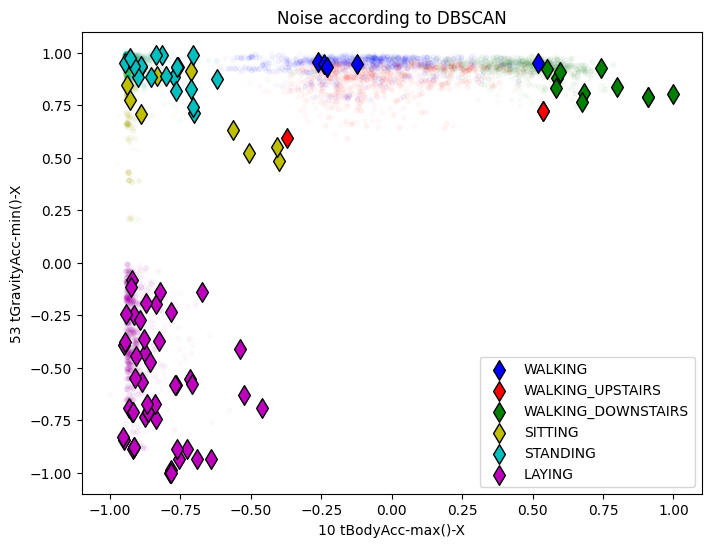

In [108]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(rdf_train.loc[db_outliers].values[:,2][rdf_train['label'].loc[db_outliers] == k], rdf_train.loc[db_outliers].values[:,4][rdf_train['label'].loc[db_outliers] == k], edgecolor='k', marker='d', c=v, label = k, s=100)
plt.xlabel(rdf.columns[2:][0])
plt.ylabel(rdf.columns[2:][2])
plt.title('Noise according to DBSCAN')
plt.legend()

df_dbout = rdf_train.loc[db_outliers].sort_values(by='label')
df_dbout

<font size = "4">Density Based: Local Outlier Factor</font>

LAYING
(array([-1,  1]), array([  45, 1362]))
Max value of score array: -0.9051349266691929 
Min value of score array: -3.419750318695692 
Mean value of score array: -1.1074816557928284
Outlier threshold: -1.5020314703336886
Indices of the outliers: [   0   31   43   87   89  100  123  149  193  201  206  214  239  273
  278  291  308  346  377  388  412  425  436  440  517  583  637  643
  671  692  713  728  741  756  916  921  998 1000 1025 1077 1155 1228
 1257 1331 1366]
Bins (Sturge Approximation): 11


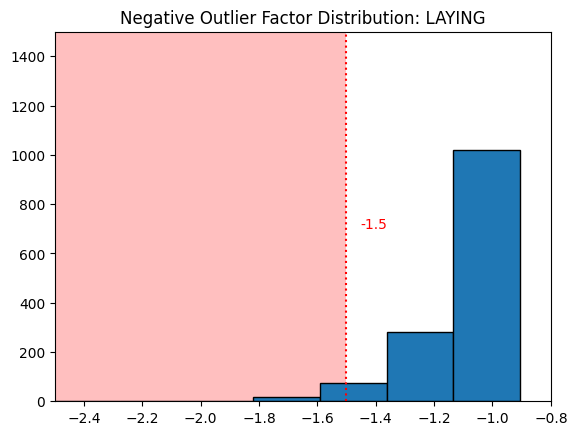

Number of identified outlier with the specified threshold: 45
(array([-1,  1]), array([  45, 1362]))
SITTING
(array([-1,  1]), array([  37, 1249]))
Max value of score array: -0.8812237967415217 
Min value of score array: -2.9627231591167345 
Mean value of score array: -1.098162348559647
Outlier threshold: -1.5033748441804817
Indices of the outliers: [  67   70  104  148  177  252  277  310  329  330  379  389  391  400
  437  440  466  495  576  586  626  651  742  748  757  838  865  878
  880  967 1020 1076 1119 1176 1189 1246 1280]
Bins (Sturge Approximation): 11


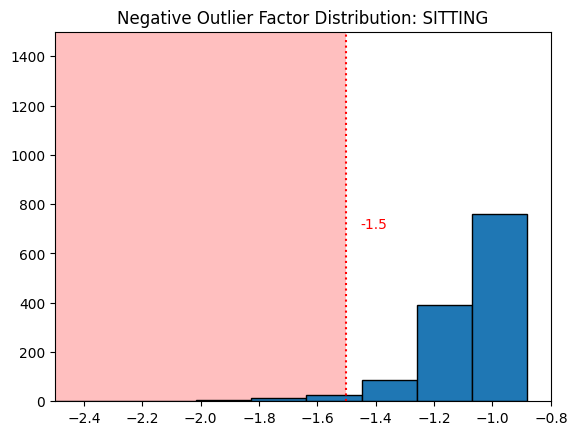

Number of identified outlier with the specified threshold: 37
(array([-1,  1]), array([  37, 1249]))
STANDING
(array([-1,  1]), array([  58, 1316]))
Max value of score array: -0.8775729321072431 
Min value of score array: -3.013503058147273 
Mean value of score array: -1.1085176533742183
Outlier threshold: -1.5019712767375313
Indices of the outliers: [  40   58   59   84  133  159  162  177  187  209  275  288  340  343
  345  405  433  486  497  561  612  627  642  660  679  690  708  777
  801  805  817  835  873  875  927  946  964  997  998 1127 1131 1150
 1151 1165 1184 1197 1218 1242 1254 1266 1281 1297 1324 1339 1340 1346
 1358 1368]
Bins (Sturge Approximation): 11


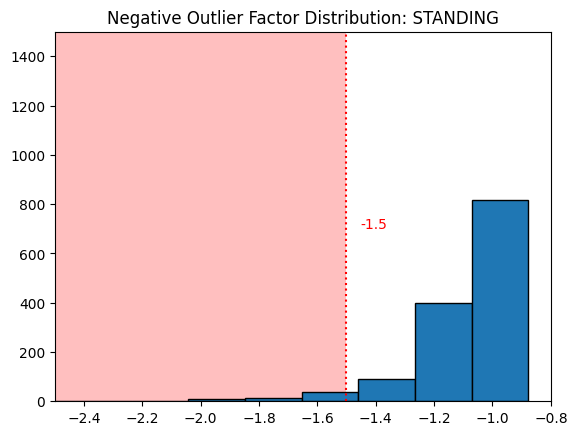

Number of identified outlier with the specified threshold: 58
(array([-1,  1]), array([  58, 1316]))
WALKING
(array([-1,  1]), array([  26, 1200]))
Max value of score array: -0.9177164980604571 
Min value of score array: -2.8942989913228225 
Mean value of score array: -1.0816360276125387
Outlier threshold: -1.506588534739414
Indices of the outliers: [  25   58   61  213  273  361  365  396  574  684  702  730  733  796
  827  842  857  868  885  905  915  995 1140 1143 1153 1159]
Bins (Sturge Approximation): 11


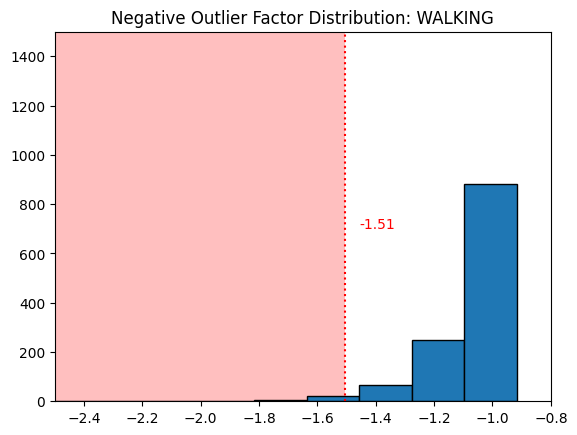

Number of identified outlier with the specified threshold: 26
(array([-1,  1]), array([  26, 1200]))
WALKING_DOWNSTAIRS
(array([-1,  1]), array([  1, 985]))
Max value of score array: -0.9204955975658399 
Min value of score array: -1.5053349521047235 
Mean value of score array: -1.0649557432816783
Outlier threshold: -1.5053349521047235
Indices of the outliers: [926]
Bins (Sturge Approximation): 11


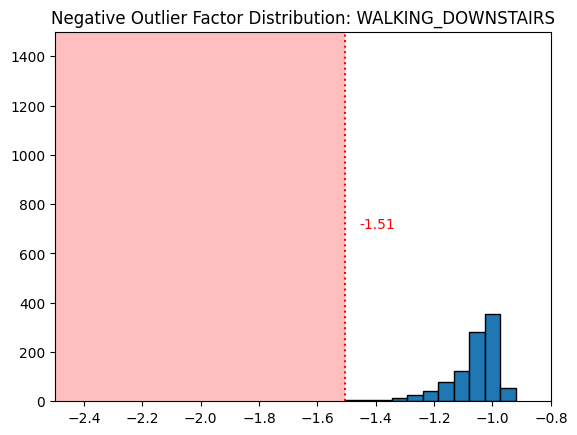

Number of identified outlier with the specified threshold: 1
(array([-1,  1]), array([  1, 985]))
WALKING_UPSTAIRS
(array([-1,  1]), array([   8, 1065]))
Max value of score array: -0.9267293498859551 
Min value of score array: -1.681908575857878 
Mean value of score array: -1.065825524663345
Outlier threshold: -1.5055404745848153
Indices of the outliers: [ 511  737  894  901  907  973 1016 1045]
Bins (Sturge Approximation): 11


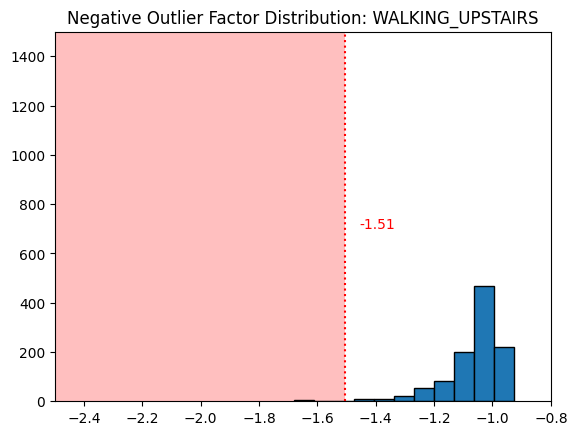

Number of identified outlier with the specified threshold: 8
(array([-1,  1]), array([   8, 1065]))
[0, 31, 43, 87, 89, 100, 123, 149, 193, 201, 206, 214, 239, 273, 278, 291, 308, 346, 377, 388, 412, 425, 436, 440, 517, 583, 637, 643, 671, 692, 713, 728, 741, 756, 916, 921, 998, 1000, 1025, 1077, 1155, 1228, 1257, 1331, 1366, 67, 70, 104, 148, 177, 252, 277, 310, 329, 330, 379, 389, 391, 400, 437, 440, 466, 495, 576, 586, 626, 651, 742, 748, 757, 838, 865, 878, 880, 967, 1020, 1076, 1119, 1176, 1189, 1246, 1280, 40, 58, 59, 84, 133, 159, 162, 177, 187, 209, 275, 288, 340, 343, 345, 405, 433, 486, 497, 561, 612, 627, 642, 660, 679, 690, 708, 777, 801, 805, 817, 835, 873, 875, 927, 946, 964, 997, 998, 1127, 1131, 1150, 1151, 1165, 1184, 1197, 1218, 1242, 1254, 1266, 1281, 1297, 1324, 1339, 1340, 1346, 1358, 1368, 25, 58, 61, 213, 273, 361, 365, 396, 574, 684, 702, 730, 733, 796, 827, 842, 857, 868, 885, 905, 915, 995, 1140, 1143, 1153, 1159, 926, 511, 737, 894, 901, 907, 973, 1016, 1045]

In [109]:
from sklearn.neighbors import LocalOutlierFactor

lof_outliers = []
idx_for_score = []
lof_score_outliers = []

for targ in label_loop:
    redefined_for_temp_target = rdf_train[rdf_train['label'] == targ][features_to_keep]
    rdf_train_val = redefined_for_temp_target.values

    X_lof = rdf_train_val.copy()
    clf_lof = LocalOutlierFactor(n_neighbors=5)
    outliers_lof = clf_lof.fit_predict(X_lof)
    
    outliers_val_array = clf_lof.negative_outlier_factor_
    outliers_val_array
    
    print(targ)
    print(np.unique(outliers_lof, return_counts=True))
    
    max_lof = np.max(outliers_val_array)
    min_lof = np.min(outliers_val_array)
    mean_lof = np.mean(outliers_val_array)
    print('Max value of score array:', max_lof, '\nMin value of score array:', min_lof, '\nMean value of score array:', mean_lof)
    
    outliers_lof_ind = np.where(outliers_lof==-1)[0] #indeces of the outliers
    outliers_lof_ind
    
    try:
        computed_score = np.max(outliers_val_array[outliers_lof_ind])
        print('Outlier threshold:', computed_score)
    except ValueError:
        #print('EMPTY ARRAY OF OUTLIERS, REDEFINE THRESHOLD') #redefining the threshold
        #computed_score = -1.45 #selected by trial and error
        #outliers_lof = np.array([-1 if x < computed_score else 1 for x in outliers_val_array])
        #outliers_lof_ind = np.where(outliers_lof==-1)[0] #indeces of the outliers
        #print('Outlier threshold:', computed_score)
        print('No outliers found for', targ)
    print('Indices of the outliers:', outliers_lof_ind)
    
    k_sturge = round(1+np.log2(len(outliers_val_array)))
    print('Bins (Sturge Approximation):', k_sturge)
    
    plt.hist(outliers_val_array, bins=k_sturge, edgecolor='k')
    plt.axvline(computed_score, c='r', ls=':')
    plt.text(computed_score+0.05, 700, s=round(computed_score, 2), c='r')
    plt.fill_between((-3, computed_score), 0, 3500, facecolor='red', alpha=0.25)
    plt.xlim(-2.5,-0.8)
    plt.ylim(0, 1500)
    plt.title("Negative Outlier Factor Distribution: {}".format(targ))
    plt.show()
    
    print('Number of identified outlier with the specified threshold:', 
          len(outliers_val_array[outliers_val_array <= computed_score])) #values lower than -1.50 tend to be outliers, scikit learn's LOF use this value
    print(np.unique(outliers_lof, return_counts=True))
    
    for x in outliers_lof_ind:
        lof_outliers.append(x)
    for x in redefined_for_temp_target.index:
        idx_for_score.append(x)
    for x in outliers_val_array:
        lof_score_outliers.append(x)
        
print(lof_outliers)

rdf_train_val = rdf_train[features_to_keep].values

In [110]:
lof_score_df = pd.DataFrame([(idx, score) for idx, score in zip(idx_for_score, lof_score_outliers)]).sort_values(by=0).reset_index(drop=True)
lof_score_df.columns = ['index', 'scores']
lof_score_df

,index,scores
0,0,-1.104292
1,1,-1.049875
2,2,-1.038544
3,3,-1.062354
4,4,-1.047020
...,...,...
7347,7347,-1.036311
7348,7348,-1.038602
7349,7349,-1.060438
7350,7350,-1.365778


Number of identified outlier with the -1.51 threshold: 164 on 7352 

Max value of score array: -0.8775729321072431 
Min value of score array: -3.419750318695692 
Mean value of score array: -1.0899523458075173


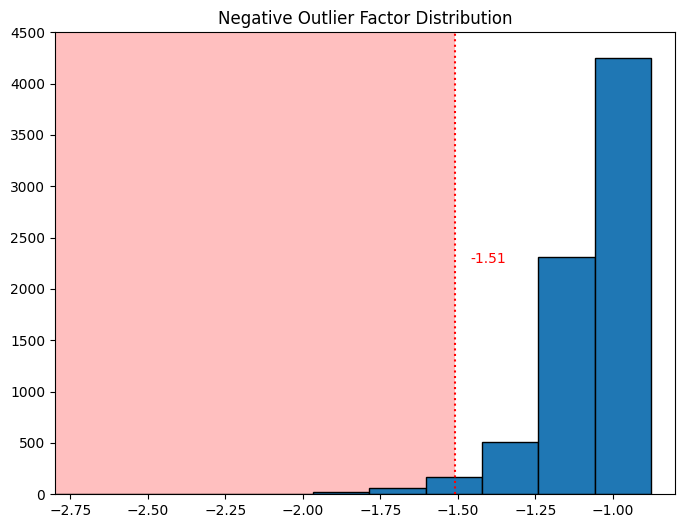

In [111]:
computed_score = -1.51
outliers_val_array = lof_score_df['scores'].values
print('Number of identified outlier with the {} threshold:'.format(computed_score), 
            len(outliers_val_array[outliers_val_array <= computed_score]), 'on', len(outliers_val_array), '\n') #values lower than -1.50 tend to be outliers, LOF use this value

############

max_lof = np.max(outliers_val_array)
min_lof = np.min(outliers_val_array)
mean_lof = np.mean(outliers_val_array)
print('Max value of score array:', max_lof, '\nMin value of score array:', min_lof, '\nMean value of score array:', mean_lof)

############

k_sturge = round(1+np.log2(len(outliers_val_array)))
plt.figure(figsize=(8, 6))

plt.hist(outliers_val_array, bins=k_sturge, edgecolor='k')
plt.axvline(computed_score, c='r', ls=':')
plt.text(computed_score+0.05, 2250, s=round(computed_score, 2), c='r')
plt.fill_between((-3, computed_score), 0, 5000, facecolor='red', alpha=0.25)
plt.xlim(-2.80,-0.8)
plt.ylim(0, 4500)
plt.title("Negative Outlier Factor Distribution")
plt.show()

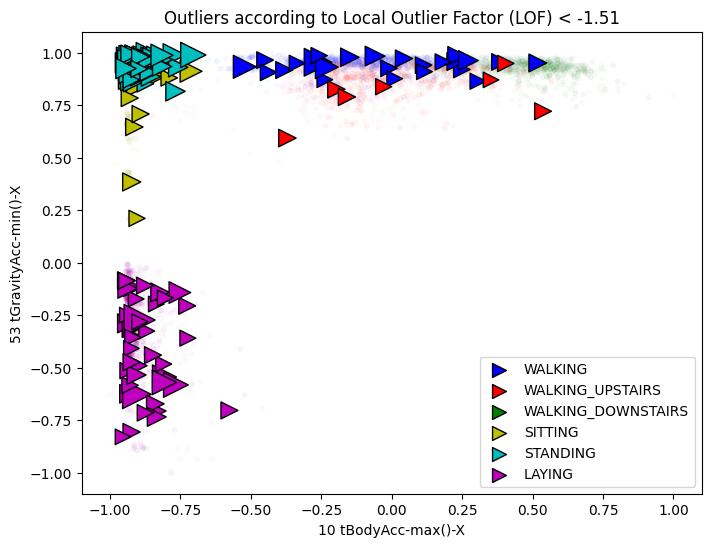

In [112]:
outliers_lof = np.array([-1 if x < computed_score else 1 for x in outliers_val_array])
outliers_lof_ind = np.where(outliers_lof==-1)[0] #indeces of the outliers

plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)

radius = ((max_lof - outliers_val_array) / (max_lof - min_lof))[outliers_lof_ind] #setting the radius of the outlier score by normalizing

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][outliers_lof_ind][rdf_train['label'].loc[outliers_lof_ind] == k], 
                rdf_train_val[:,2][outliers_lof_ind][rdf_train['label'].loc[outliers_lof_ind] == k], 
                edgecolor='k', marker='>', c=v, label = k, 
                s=500*(radius[rdf_train['label'].loc[outliers_lof_ind] == k]))
    
plt.title("Outliers according to Local Outlier Factor (LOF) < {}".format(round(computed_score, 2)))
legend = plt.legend()
for x in range(6):
    legend.legendHandles[x]._sizes = [100]
plt.xlabel(rdf.columns[2:][0])
plt.ylabel(rdf.columns[2:][2])
plt.show()

In [113]:
[(x,y) for x,y in zip(outliers_lof_ind, radius) if y >= 0.6]

[(834, 0.6562600811173761),
 (976, 0.6505724180416623),
 (1313, 0.6346889226060138),
 (1810, 0.6620608498737129),
 (2001, 0.6183618903575192),
 (2141, 0.8473594212636453),
 (2175, 0.8401971228712741),
 (2184, 0.7933065842907152),
 (3715, 1.0),
 (4222, 0.8202221599523081)]

In [114]:
df_lofout = rdf_train.loc[outliers_lof_ind].sort_values(by='label')
df_lofout

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
10,LAYING,25,-0.833392,0.395783,-0.706119,-0.681377,-0.964729,-0.394557,-0.985655,-0.999036,-0.942702,-0.862428,-0.203878
1192,LAYING,11,-0.942143,0.934981,-0.084700,-0.328470,-0.997527,-0.711576,-0.999886,-0.999948,-0.998136,-0.998959,-0.795987
1239,LAYING,17,-0.906531,0.542319,-0.172640,-0.703719,-0.960000,-0.508239,-0.995484,-0.999177,-0.942419,-0.901376,-0.315872
1456,LAYING,29,-0.938873,0.842392,-0.288712,0.515592,-0.995149,-0.533863,-0.999997,-0.999880,-0.998384,-0.995740,-0.614428
4809,LAYING,7,-0.846869,0.190931,-0.440068,-0.202313,-0.958832,0.222754,-0.997270,-0.997273,-0.886461,-0.767631,-0.051262
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6671,WALKING_UPSTAIRS,19,-0.158697,-0.388049,0.789339,-0.219916,-0.424584,0.261127,-0.834432,-0.893465,-0.650442,-0.503985,0.354986
6223,WALKING_UPSTAIRS,5,0.404905,-0.234815,0.948880,0.000746,-0.282268,0.510417,-0.745958,-0.957597,-0.550240,-0.288855,0.245746
6186,WALKING_UPSTAIRS,14,0.537230,-0.329308,0.721304,-0.610416,-0.598033,-0.083687,0.381111,-0.481499,-0.182087,-0.043296,0.315901
3539,WALKING_UPSTAIRS,16,-0.196077,0.171807,0.825805,-0.651142,-0.698855,-0.126136,-0.422607,-0.637878,-0.311544,-0.320810,-0.036196


<font size = "4">Depth Based: Convex Hull</font>

In [115]:
[(n, col) for n, col in enumerate(features_to_keep)]

[(0, '10 tBodyAcc-max()-X'),
 (1, '42 tGravityAcc-mean()-Y'),
 (2, '53 tGravityAcc-min()-X'),
 (3, '74 tGravityAcc-arCoeff()-Z,1'),
 (4, '167 tBodyGyroJerk-mad()-X'),
 (5, '297 fBodyAcc-skewness()-X'),
 (6, '331 fBodyAcc-bandsEnergy()-1,8'),
 (7, '411 fBodyAccJerk-bandsEnergy()-9,16'),
 (8, '427 fBodyGyro-std()-X'),
 (9, '504 fBodyAccMag-std()'),
 (10, '560 angle(Y,gravityMean)')]

In [116]:
rdf_train[rdf_train['label']==targ][[val for v in dict_importances.values() for val in v.keys() if (v[val] > 0.25)]]

,53 tGravityAcc-min()-X,53 tGravityAcc-min()-X,42 tGravityAcc-mean()-Y,167 tBodyGyroJerk-mad()-X,504 fBodyAccMag-std(),10 tBodyAcc-max()-X,"74 tGravityAcc-arCoeff()-Z,1","331 fBodyAcc-bandsEnergy()-1,8"
6,0.830751,0.830751,-0.278713,-0.502992,-0.443602,-0.152290,-0.620776,-0.315129
12,0.594053,0.594053,-0.336491,-0.648672,-0.232874,-0.157973,-0.665479,0.070828
17,0.853854,0.853854,-0.256222,-0.689060,-0.475976,-0.183947,-0.749753,-0.600884
19,0.865605,0.865605,-0.307545,-0.588134,-0.512048,-0.217105,-0.712962,-0.689333
33,0.830927,0.830927,-0.336807,-0.302225,-0.362040,-0.115473,-0.510663,-0.733763
...,...,...,...,...,...,...,...,...
7319,0.833330,0.833330,-0.233384,-0.521824,-0.562184,-0.170666,-0.584967,-0.480472
7326,0.831912,0.831912,-0.233474,-0.477663,-0.397553,0.128540,-0.559772,-0.371980
7329,0.931133,0.931133,-0.233606,-0.406905,-0.057813,0.281461,-0.809722,-0.014166
7338,0.787017,0.787017,-0.246285,-0.708201,-0.505690,-0.050383,-0.659554,-0.633161


In [117]:
codes_to_keep = [0,1,2,4,5,7,10]
feat_convexhull = np.array(features_to_keep)[codes_to_keep]
print(feat_convexhull)
print('Dimensions used:', len(feat_convexhull))

['10 tBodyAcc-max()-X' '42 tGravityAcc-mean()-Y' '53 tGravityAcc-min()-X'
 '167 tBodyGyroJerk-mad()-X' '297 fBodyAcc-skewness()-X'
 '411 fBodyAccJerk-bandsEnergy()-9,16' '560 angle(Y,gravityMean)']
Dimensions used: 7


In [118]:
from scipy.spatial import ConvexHull

vertices_idx = []
for targ in label_loop:
    rdf_train_val = rdf_train[rdf_train['label']==targ][features_to_keep]
    idx_original = rdf_train_val.index
    rdf_train_val = rdf_train_val.values
    hull = ConvexHull(rdf_train_val[:,codes_to_keep])
    
    correct_idx_hull = idx_original[hull.vertices]
    
    for simplex in correct_idx_hull:
        vertices_idx.append(simplex)
        
rdf_train_val = rdf_train[features_to_keep].values

In [119]:
len(vertices_idx) #thus not usable with too many dimensions... It will just add points

3347

In [120]:
len(set(vertices_idx)) #just checking correctness of the loop through classes

3347

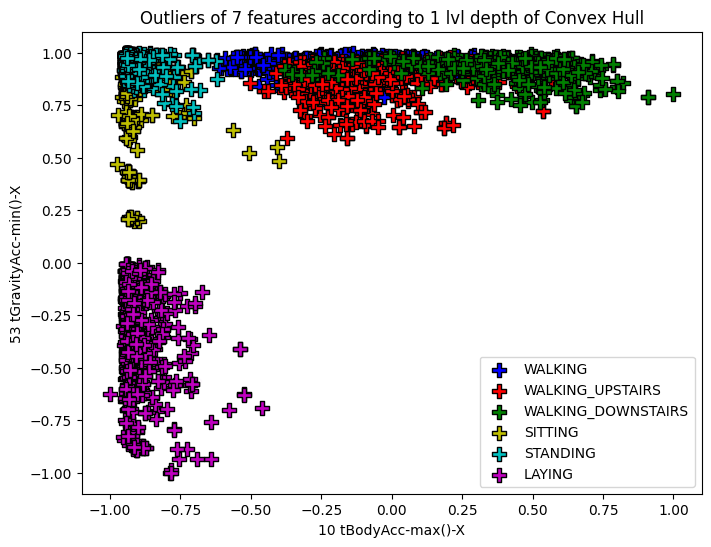

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
0,WALKING_DOWNSTAIRS,22,0.465563,-0.198698,0.910931,-0.366162,-0.318012,0.787213,-0.872989,-0.635353,-0.162709,-0.027400,0.222960
2,WALKING,27,0.074430,-0.159944,0.983467,-0.027458,-0.586446,-0.146056,-0.871813,-0.734109,-0.699480,-0.541710,0.192929
5,WALKING,25,-0.491629,-0.093656,0.925260,-0.254699,-0.443805,0.330545,-0.840740,-0.870005,-0.369048,-0.655096,0.147854
8,WALKING_DOWNSTAIRS,25,0.033376,-0.058870,0.961807,-0.495690,-0.311488,0.035475,-0.887561,-0.883956,-0.324389,-0.171141,0.124403
10,LAYING,25,-0.833392,0.395783,-0.706119,-0.681377,-0.964729,-0.394557,-0.985655,-0.999036,-0.942702,-0.862428,-0.203878
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7345,SITTING,16,-0.944372,-0.153172,0.924393,-0.838534,-0.994568,0.304117,-0.998876,-0.999830,-0.996162,-0.954828,0.188206
7346,WALKING_UPSTAIRS,19,-0.159385,-0.368737,0.876126,-0.724291,-0.071300,0.015191,-0.542190,-0.925381,-0.435534,-0.277702,0.337251
7348,WALKING_DOWNSTAIRS,25,-0.283244,-0.032432,0.895652,-0.618833,-0.468762,0.561815,-0.854999,-0.907044,-0.543926,-0.428790,0.106156
7349,WALKING,25,-0.547082,-0.146223,0.980335,-0.254914,-0.538672,0.075773,-0.836055,-0.904412,-0.458087,-0.657606,0.183547


In [121]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(rdf_train.loc[vertices_idx].values[:,2][rdf_train['label'].loc[vertices_idx] == k], rdf_train.loc[vertices_idx].values[:,4][rdf_train['label'].loc[vertices_idx] == k], edgecolor='k', marker='P', c=v, label = k, s=100)

plt.title('Outliers of 7 features according to 1 lvl depth of Convex Hull')
plt.xlabel(features_to_keep[0])
plt.ylabel(features_to_keep[2])
plt.legend()
plt.show()

df_highdim_hullout = rdf_train.loc[vertices_idx].sort_index()
df_highdim_hullout

In [122]:
vertices_idx = []

for targ in label_loop:
    rdf_train_val = rdf_train[rdf_train['label']==targ][features_to_keep]
    idx_original = rdf_train_val.index
    rdf_train_val = rdf_train_val.values
    hull = ConvexHull(rdf_train_val[:,[0,2]])
    
    correct_idx_hull = idx_original[hull.vertices]
    
    for simplex in correct_idx_hull:
        vertices_idx.append(simplex)
        
rdf_train_val = rdf_train[features_to_keep].values

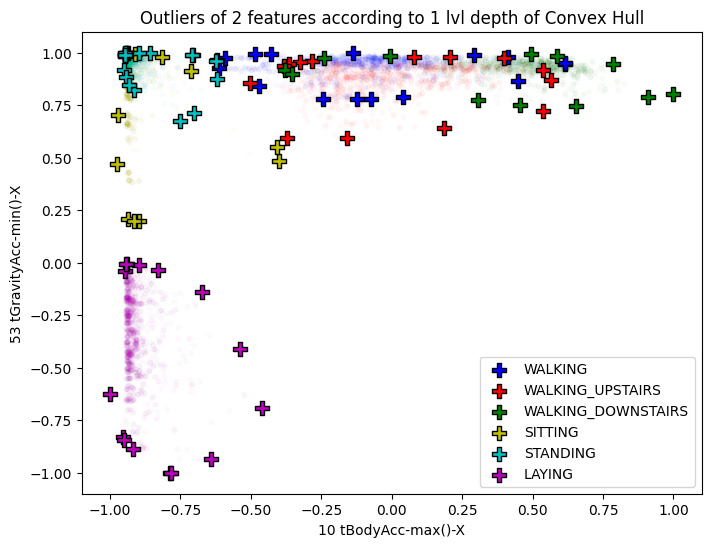

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
167,WALKING,14,-0.074260,-0.287731,0.782002,-0.570134,-0.476999,-0.009441,-0.312946,-0.776163,-0.601528,-0.376652,0.282623
250,STANDING,23,-0.942957,-0.019454,0.997229,-0.528726,-0.987919,-0.665696,-0.999579,-0.999658,-0.985351,-0.990803,0.097226
326,WALKING,7,0.292155,-0.173009,0.987800,-0.273073,-0.207866,-0.028866,-0.545757,-0.498416,-0.493388,-0.394847,0.201285
334,STANDING,23,-0.894945,-0.004512,0.998046,-0.764701,-0.932585,-0.526712,-0.984370,-0.990666,-0.881513,-0.917826,0.087051
372,WALKING_UPSTAIRS,25,-0.365124,-0.252287,0.944940,-0.757730,-0.725399,-0.002907,-0.664170,-0.968982,-0.722961,-0.559817,0.258160
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6781,WALKING,25,-0.611522,-0.125839,0.929024,-0.362114,-0.612874,-0.365729,-0.775555,-0.893496,-0.463922,-0.693393,0.169862
6803,WALKING_DOWNSTAIRS,25,-0.353883,-0.052798,0.897220,-0.830395,-0.634283,0.044560,-0.805311,-0.937541,-0.470611,-0.486194,0.120328
6999,WALKING,19,0.616643,-0.193530,0.947155,-0.052407,0.250800,0.120422,-0.579644,-0.581877,-0.086598,-0.098100,0.216366
7284,SITTING,7,-0.945167,0.011134,0.991559,-0.437204,-0.995175,-0.715023,-0.999209,-0.999515,-0.995465,-0.986566,0.076337


In [123]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(rdf_train.loc[vertices_idx].values[:,2][rdf_train['label'].loc[vertices_idx] == k], rdf_train.loc[vertices_idx].values[:,4][rdf_train['label'].loc[vertices_idx] == k], edgecolor='k', marker='P', c=v, label = k, s=100)

plt.title('Outliers of 2 features according to 1 lvl depth of Convex Hull')
plt.xlabel(features_to_keep[0])
plt.ylabel(features_to_keep[2])
plt.legend()
plt.show()

df_hullout = rdf_train.loc[vertices_idx].sort_index()
df_hullout

<font size = "4">Silhouette Score</font>

In [124]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

silhouette_avg = silhouette_score(rdf_train_val, labels_train[0]) #labels[0] because otherwise it's a df and not a series
silhouette_smp = silhouette_samples(rdf_train_val, labels_train[0])
print('Average Silhouette Score:', silhouette_avg)

Average Silhouette Score: 0.2100549238955977


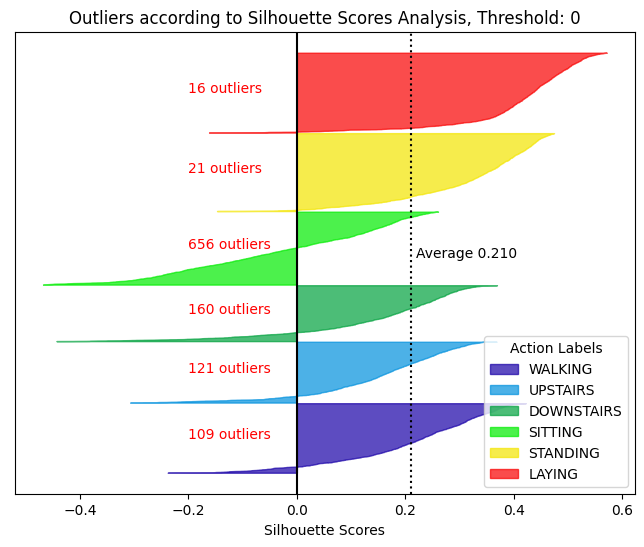

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
8,WALKING_DOWNSTAIRS,25,0.033376,-0.058870,0.961807,-0.495690,-0.311488,0.035475,-0.887561,-0.883956,-0.324389,-0.171141,0.124403
15,WALKING,17,-0.042183,-0.292974,0.935511,-0.516823,-0.399050,0.167208,-0.808684,-0.892384,-0.500010,-0.486643,0.284542
33,WALKING_UPSTAIRS,28,-0.115473,-0.336807,0.830927,-0.510663,-0.302225,-0.111663,-0.733763,-0.861261,-0.462909,-0.362040,0.319629
37,STANDING,7,-0.816433,-0.084493,0.877584,-0.978418,-0.967447,0.347075,-0.929022,-0.997979,-0.951697,-0.678875,0.141911
52,WALKING_UPSTAIRS,6,0.461087,-0.329989,0.915267,-0.571092,-0.330530,-0.177821,-0.791899,-0.817870,-0.205085,-0.195303,0.312809
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7335,SITTING,16,-0.940908,0.060439,0.984621,-0.429599,-0.995547,-0.663398,-0.999762,-0.999806,-0.998033,-0.996384,0.042508
7337,STANDING,17,-0.705489,-0.366636,0.743590,-0.996525,-0.972970,0.428699,-0.875641,-0.999520,-0.882553,-0.454924,0.340344
7341,SITTING,25,-0.942773,0.085472,0.985968,-0.521904,-0.995706,-0.595179,-0.999058,-0.999746,-0.998210,-0.988248,0.025413
7345,SITTING,16,-0.944372,-0.153172,0.924393,-0.838534,-0.994568,0.304117,-0.998876,-0.999830,-0.996162,-0.954828,0.188206


In [125]:
plt.figure(figsize=(8, 6))
y_lower = 10

threshold_silhouette = 0


outliers_by_silhouette = []
for x in silhouette_smp:
    if x < threshold_silhouette:
        outliers_by_silhouette.append(-1)
    else:
        outliers_by_silhouette.append(1)
        
outliers_by_silhouette = np.array(outliers_by_silhouette)
silout_df = rdf_train[outliers_by_silhouette == -1]

label_origin_silout = labels_train[outliers_by_silhouette == -1]

conta_out_sil = np.unique(label_origin_silout, return_counts=True)

for i in range(1, len(np.unique(labels))+1):
    ith_cluster_silhouette_values = silhouette_smp[labels_train[0] == i]

    ith_cluster_silhouette_values.sort()
    outlier_sil = len(ith_cluster_silhouette_values[ith_cluster_silhouette_values < 0])

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    
    if threshold_silhouette != 0:
        plt.text(-0.20, y_lower + 0.5 * size_cluster_i, s='{} negatives'.format(outlier_sil), c='k')
    y_upper = y_lower + size_cluster_i
    
    try:
        pos_outs = np.where(conta_out_sil[0]==i)[0][0]
        plt.text(threshold_silhouette-0.2, y_lower + 0.5 * size_cluster_i, s='{} outliers'.format(conta_out_sil[1][pos_outs]), c='r')
    except:
        pos_of_outliers = -1

    color = cm.nipy_spectral(float(i) / (len(np.unique(labels))+1)) #+1 to adjust the color to the right length
    action_lab = remap_dict[i][remap_dict[i].find('_')+1:] #so that if it is -1 it starts from 0, if not it starts after '_'
    
    plt.fill_betweenx(np.arange(y_lower, y_upper), 0,
        ith_cluster_silhouette_values,
        facecolor=color, edgecolor=color, alpha=0.7, label=action_lab)
    
    y_lower = y_upper + 10  # 10 for the 0 samples
    
plt.axvline(silhouette_avg, c='k', ls=':')
plt.text(silhouette_avg+0.01, 3800, s='Average {:.3f}'.format(silhouette_avg), c='k')

if threshold_silhouette != 0:
    thr_line_color = 'r'
else:
    thr_line_color = 'k'
    
plt.axvline(threshold_silhouette, c=thr_line_color, ls='-')

plt.yticks([])
plt.xlabel('Silhouette Scores')
plt.title('Outliers according to Silhouette Scores Analysis, Threshold: {}'.format(round(threshold_silhouette, 3)))
plt.legend(loc='lower right', title='Action Labels')
plt.show()

df_silout = rdf_train.loc[np.where(silhouette_smp<=threshold_silhouette)[0]]
df_silout

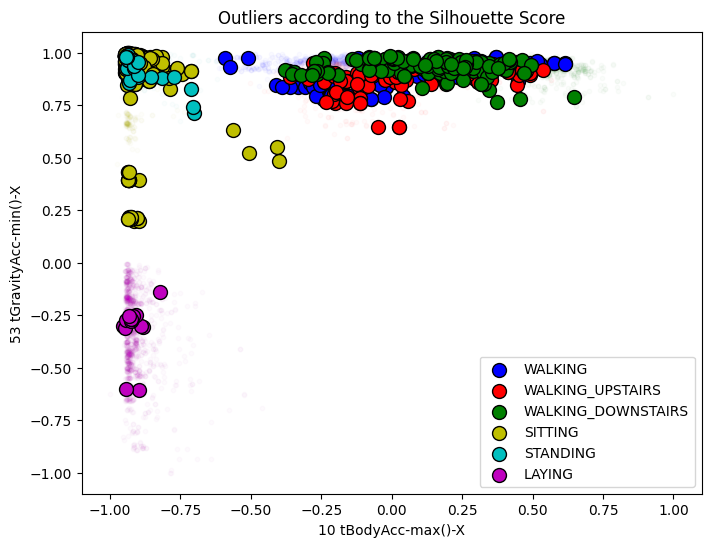

In [126]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(rdf_train.loc[df_silout.index].values[:,2][rdf_train['label'].loc[df_silout.index] == k], rdf_train.loc[df_silout.index].values[:,4][rdf_train['label'].loc[df_silout.index] == k], edgecolor='k', marker='o', c=v, label = k, s=100)

plt.title('Outliers according to the Silhouette Score')
plt.xlabel(features_to_keep[0])
plt.ylabel(features_to_keep[2])
plt.legend()
plt.show()


<font size = "4">Angle Based: ABOD</font>

In [127]:
!pip install pyod

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [128]:
from pyod.models.abod import ABOD
clf = ABOD()
clf.fit(rdf_train_val)
clf.decision_scores_

array([   -5.02407129,   -10.82262032,  -164.74589268, ...,
       -1124.5488368 , -2097.79637856,   -41.60135126])

In [129]:
outliers = clf.predict(rdf_train_val)
np.unique(outliers, return_counts=True)

(array([0, 1]), array([6528,  824]))

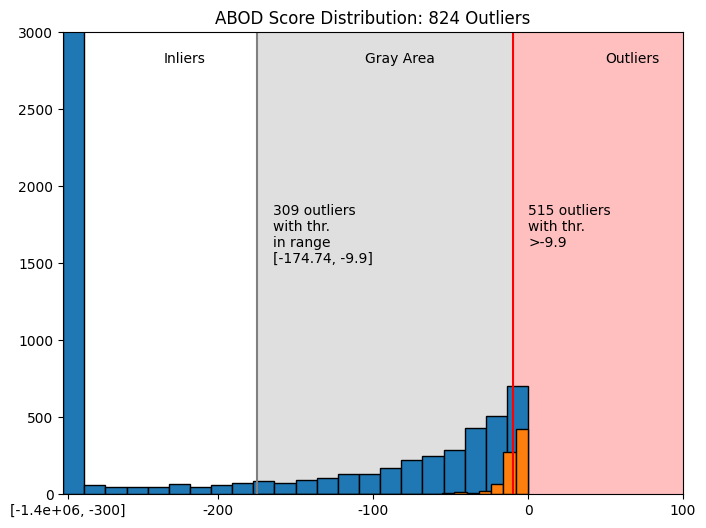

In [130]:
group = -300
minstd_threshold = np.min(clf.decision_scores_[np.where(outliers == 1)])
maxstd_threshold = np.max(clf.decision_scores_[np.where(outliers == 0)])

outliers_frommin_tomax = len(clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] <= maxstd_threshold])
outliers_frommax = len(clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] > maxstd_threshold])

abod_num_outliers = len(clf.decision_scores_[np.where(outliers==1)])

plt.figure(figsize=(8, 6))
plt.hist([x if (x >= group) else (group) for x in clf.decision_scores_], edgecolor='k', bins=22)
plt.hist(clf.decision_scores_[np.where(outliers == 1)], edgecolor='k', bins=22)
plt.axvline(minstd_threshold, c='gray')
plt.axvline(maxstd_threshold, c='red')
plt.text(minstd_threshold+10, 1500, s='{} outliers \nwith thr.\nin range\n[{}, {}]'.format(outliers_frommin_tomax, round(minstd_threshold,2), round(maxstd_threshold,2)), c='k')
plt.text(maxstd_threshold+10, 1500, s='{} outliers \nwith thr.\n>{}\n'.format(outliers_frommax, round(maxstd_threshold,2)), c='k')


plt.text(-235, 2800, s='Inliers', c='k')
plt.text(-105, 2800, s='Gray Area', c='k')
plt.text(50, 2800, s='Outliers', c='k')

plt.fill_between((minstd_threshold, maxstd_threshold), 0, 3200, facecolor='gray', alpha=0.25)
plt.fill_between((maxstd_threshold, 200), 0, 3200, facecolor='red', alpha=0.25)

plt.xlim(group, 100)
plt.ylim(0, 3000)
plt.title('ABOD Score Distribution: {} Outliers'.format(abod_num_outliers))
plt.xticks([-297]+list(np.arange(-200, 200, 100)), ['[{:.1e}, -300]'.format(round(np.min(clf.decision_scores_[np.where(outliers == 0)]),0))]+list(np.arange(-200, 200, 100)))
plt.show()

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
0,WALKING_DOWNSTAIRS,22,0.465563,-0.198698,0.910931,-0.366162,-0.318012,0.787213,-0.872989,-0.635353,-0.162709,-0.027400,0.222960
1,WALKING_DOWNSTAIRS,7,0.586004,-0.137829,0.886878,-0.461135,-0.479952,0.015080,-0.173580,-0.373514,-0.297979,0.220396,0.178975
6,WALKING_UPSTAIRS,8,-0.152290,-0.278713,0.830751,-0.620776,-0.502992,-0.236005,-0.315129,-0.666138,-0.407761,-0.443602,0.276130
8,WALKING_DOWNSTAIRS,25,0.033376,-0.058870,0.961807,-0.495690,-0.311488,0.035475,-0.887561,-0.883956,-0.324389,-0.171141,0.124403
10,LAYING,25,-0.833392,0.395783,-0.706119,-0.681377,-0.964729,-0.394557,-0.985655,-0.999036,-0.942702,-0.862428,-0.203878
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7305,WALKING_UPSTAIRS,8,-0.053884,-0.266465,0.797268,-0.642080,-0.543612,0.309713,-0.177247,-0.465272,-0.588791,-0.321509,0.268718
7317,WALKING_DOWNSTAIRS,3,0.336902,-0.257776,0.926078,-0.415635,-0.061269,0.219268,-0.775717,-0.653816,-0.441993,-0.294278,0.262356
7329,WALKING_UPSTAIRS,29,0.281461,-0.233606,0.931133,-0.809722,-0.406905,-0.074277,-0.014166,-0.926530,-0.491121,-0.057813,0.246731
7342,WALKING_DOWNSTAIRS,3,0.487076,-0.217624,0.944753,-0.247965,-0.376666,-0.027821,-0.893477,-0.894598,-0.584835,-0.246653,0.233472


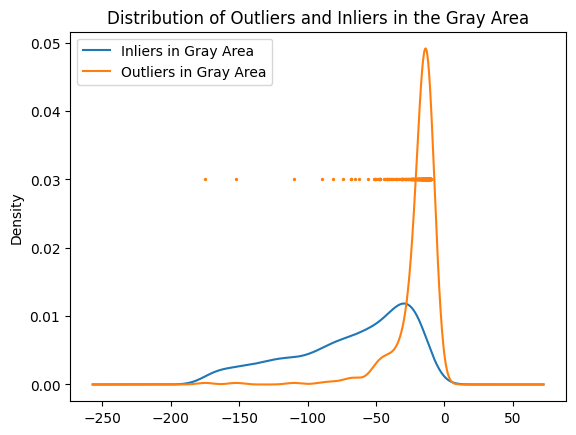

In [131]:
plt.scatter([],[])
plt.scatter(clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] <= maxstd_threshold],
           [0.03 for _ in clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] <= maxstd_threshold]], s=2)
pd.Series(clf.decision_scores_[np.where(outliers == 0)][clf.decision_scores_[np.where(outliers == 0)] > minstd_threshold]).plot(kind='kde', label='Inliers in Gray Area')
pd.Series(clf.decision_scores_[np.where(outliers == 1 & (clf.decision_scores_ <= maxstd_threshold))]).plot(kind='kde', label='Outliers in Gray Area')
plt.title('Distribution of Outliers and Inliers in the Gray Area')
plt.legend()

df_abodout = rdf_train.loc[np.where(outliers == 1)]
df_abodout

In [132]:
#there are strangely some outliers with lower scores in the grey area
#by focusing on the following threshold I can get for certain only outliers, excluding thus the gray area:
maxstd_threshold
#nonetheless the difference is very small (300 hundred more outliers), thus I will keep using the ABOD library standard

-9.901858123415844

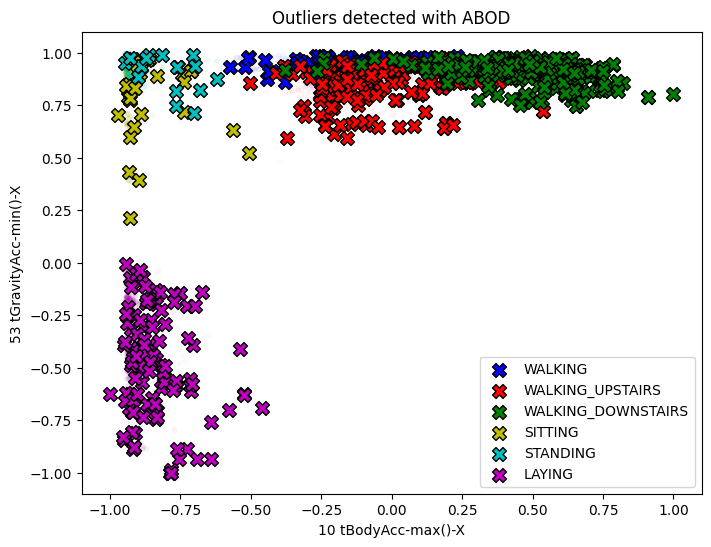

In [133]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(rdf_train.loc[df_abodout.index].values[:,2][rdf_train['label'].loc[df_abodout.index] == k], rdf_train.loc[df_abodout.index].values[:,4][rdf_train['label'].loc[df_abodout.index] == k], edgecolor='k', marker='X', c=v, label = k, s=100)

plt.title('Outliers detected with ABOD')
plt.xlabel(features_to_keep[0])
plt.ylabel(features_to_keep[2])
plt.legend()
plt.show()

<font size = "4">Comparing the results for each methods</font>

In [134]:
indexes_to_check = set(list(df_bpout.index)+list(df_dbout.index)+list(df_lofout.index)+list(df_highdim_hullout.index)+list(df_hullout.index)+list(df_silout.index)+list(df_abodout.index))
len(indexes_to_check)

5028

In [135]:
common_out_idx = set(df_bpout.index) & set(df_dbout.index) & set(df_lofout.index) & set(df_highdim_hullout.index) & set(df_silout.index) & set(df_abodout.index)
common_out_idx

{2175, 2239, 2389, 3309}

In [136]:
rdf_train.loc[common_out_idx]

,label,individuals,10 tBodyAcc-max()-X,42 tGravityAcc-mean()-Y,53 tGravityAcc-min()-X,"74 tGravityAcc-arCoeff()-Z,1",167 tBodyGyroJerk-mad()-X,297 fBodyAcc-skewness()-X,"331 fBodyAcc-bandsEnergy()-1,8","411 fBodyAccJerk-bandsEnergy()-9,16",427 fBodyGyro-std()-X,504 fBodyAccMag-std(),"560 angle(Y,gravityMean)"
2239,SITTING,3,-0.711757,0.064106,0.911653,-0.888127,-0.763382,-0.256954,0.212647,-0.978793,-0.439487,-0.291972,0.038530
3309,LAYING,14,-0.821282,0.370974,-0.141663,-0.898474,-0.892187,0.496123,0.173585,-0.971960,-0.864192,1.000000,-0.220034
2389,WALKING,19,0.518618,-0.181234,0.951127,0.156372,0.243814,-0.327547,-0.671563,-0.486727,0.203951,-0.036189,0.208059
2175,STANDING,8,-0.901006,-0.127684,0.882206,-0.985841,-0.940439,0.103620,0.081971,-0.997071,-0.821073,0.007856,0.174306


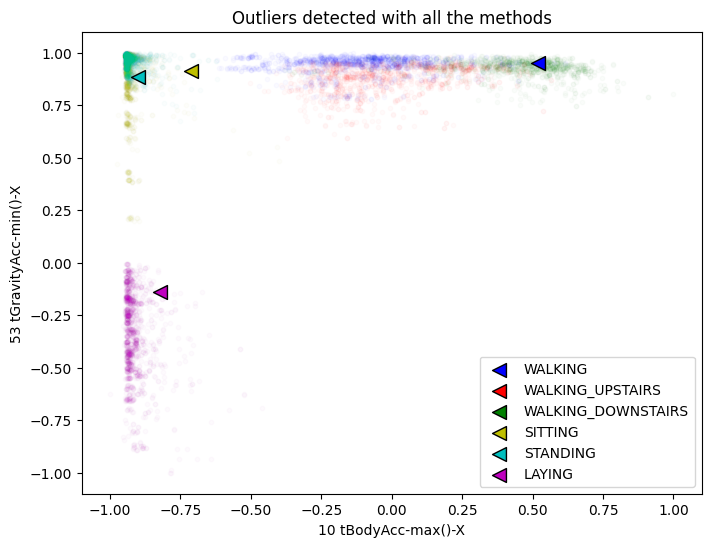

In [137]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(rdf_train_val[:,0][rdf_train['label'] == k], rdf_train_val[:,2][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(rdf_train.loc[common_out_idx].values[:,2][rdf_train['label'].loc[common_out_idx] == k], rdf_train.loc[common_out_idx].values[:,4][rdf_train['label'].loc[common_out_idx] == k], edgecolor='k', marker='<', c=v, label = k, s=100)

plt.title('Outliers detected with all the methods')
plt.xlabel(features_to_keep[0])
plt.ylabel(features_to_keep[2])
plt.legend()
plt.show()

<font size = "5">Dataset reduced with tSNE</font>

<font size = "4">Boxplot Method</font>

In [138]:
df_train_tsne = pd.DataFrame(tsne_train, columns=['PC1', 'PC2'])
X_tsne = tsne_train
df_train_tsne

,PC1,PC2
0,36.776134,16.336134
1,68.753456,23.548702
2,45.635525,-23.897741
3,-49.973606,23.391386
4,29.991585,9.881884
...,...,...
7347,23.639996,-68.529739
7348,18.860483,-64.487137
7349,24.142113,-71.501617
7350,-16.699360,41.120899


In [139]:
to_remap = labels[:len(ind_train)][0].values
remap_dict = {1 : 'WALKING', 2 : 'WALKING_UPSTAIRS', 3 : 'WALKING_DOWNSTAIRS', 4 : 'SITTING', 5 : 'STANDING', 6 : 'LAYING'}
activity_labels_train = [remap_dict.get(number, number) for number in to_remap]
df_train_tsne['label'] = activity_labels_train
color_map = [mapping_color.get(number, number) for number in df_train_tsne['label']]
df_train_tsne['color'] = color_map

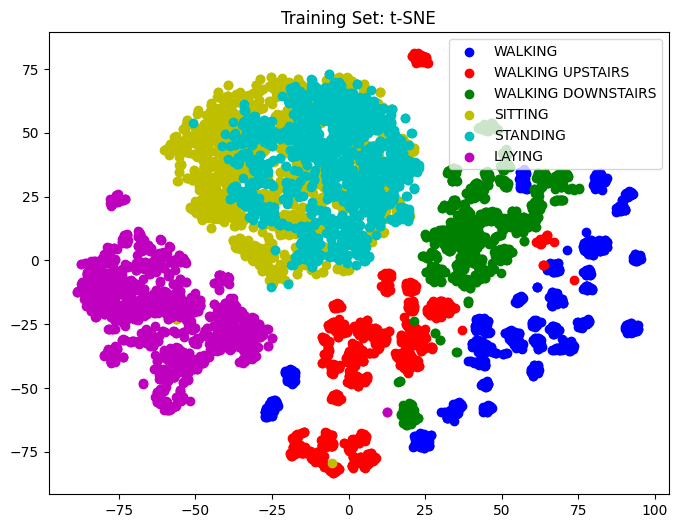

In [140]:
plt.figure(figsize=(8, 6))
for k, v in mapping_color.items():
    plt.scatter(df_train_tsne[df_train_tsne['label'] == k]['PC1'].values, df_train_tsne[df_train_tsne['label'] == k]['PC2'].values, c=v, label=k.replace('_', ' '))
plt.title('Training Set: t-SNE')
plt.legend()
plt.show()

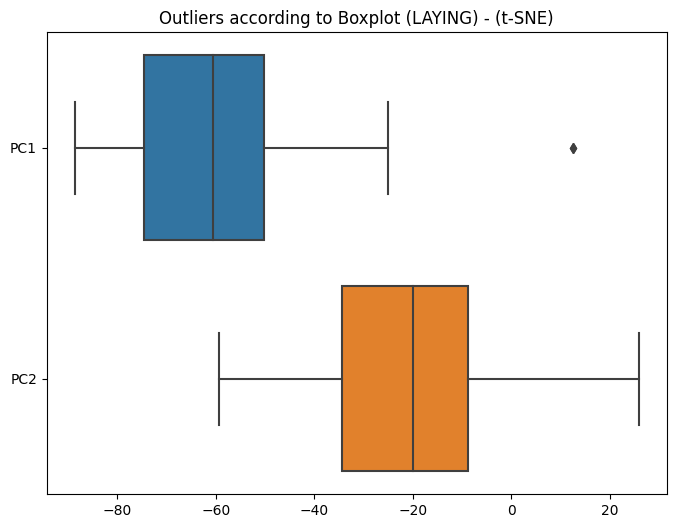

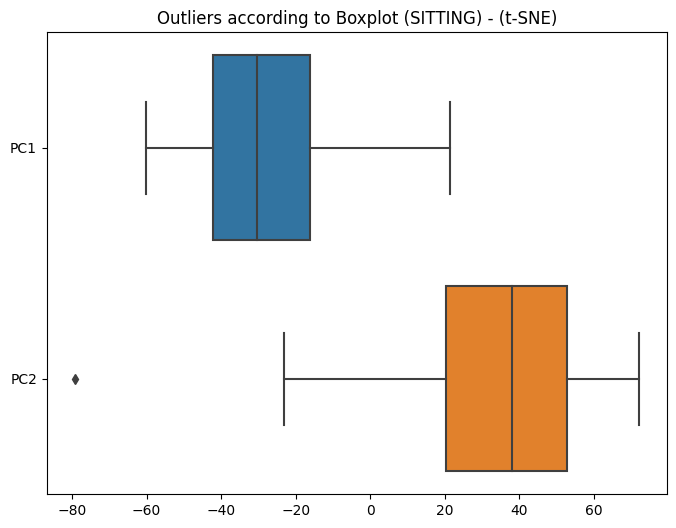

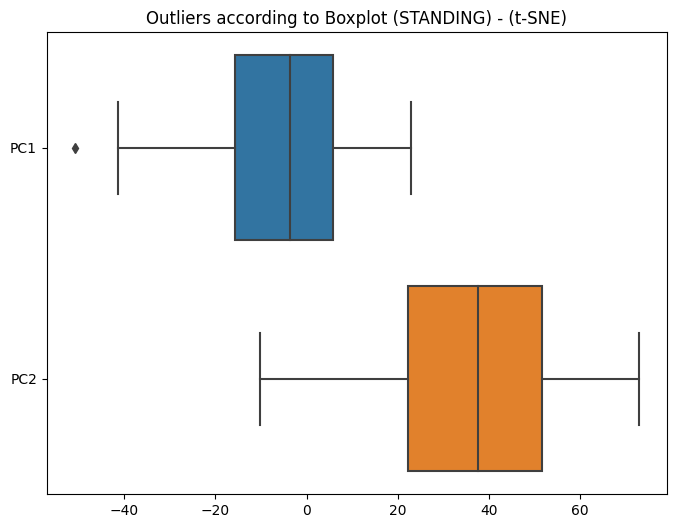

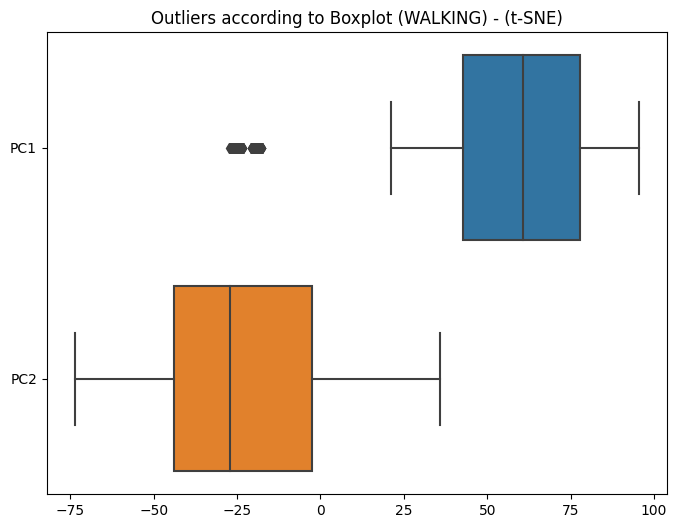

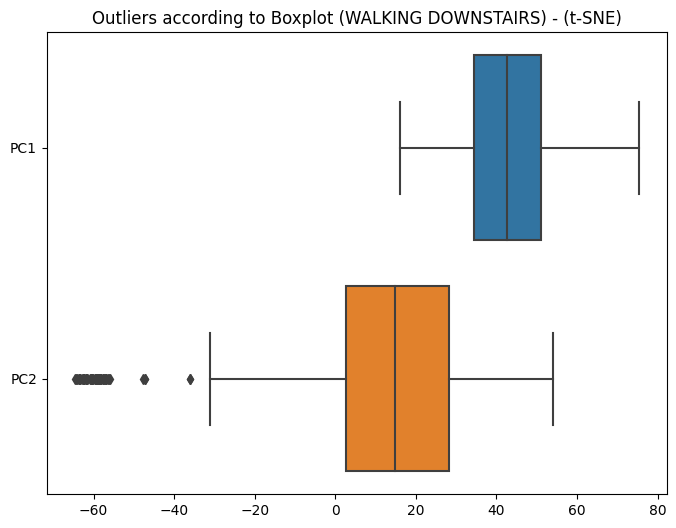

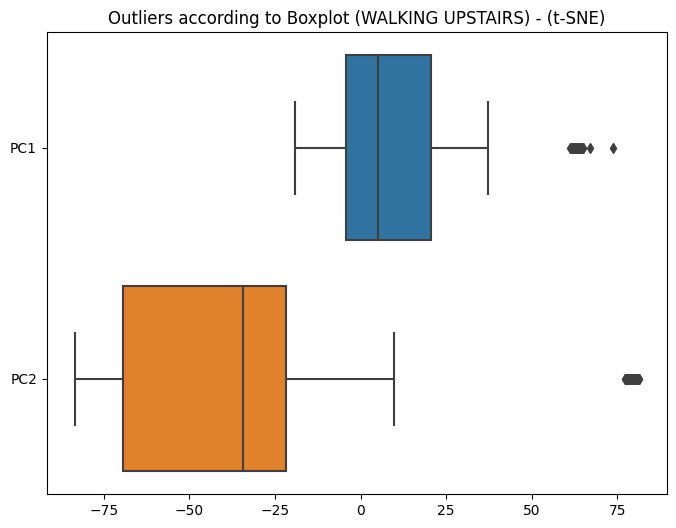

In [141]:
for targ in label_loop:
    plt.figure(figsize=(8, 6))

    sns.boxplot(data=[X_tsne[:,x][df_train_tsne['label'] == targ] for x in range(2)], orient="h")
    plt.yticks([x for x in range(2)], ['PC1', 'PC2'])
    plt.title('Outliers according to Boxplot ({}) - (t-SNE)'.format(targ.replace('_', ' ')))
    plt.show()

In [142]:
boxplot_idx = []

for targ in label_loop:

    for col in ['PC1', 'PC2']:
        Q1 = df_train_tsne[df_train_tsne['label'] == targ][col].quantile(0.25)
        Q3 = df_train_tsne[df_train_tsne['label'] == targ][col].quantile(0.75)
        IQR = Q3 - Q1

        filtering = (df_train_tsne[df_train_tsne['label'] == targ][col] >= Q1 - 1.5 * IQR) & (df_train_tsne[df_train_tsne['label'] == targ][col] <= Q3 + 1.5 *IQR)

        print(targ, col, 'number of outliers:', len(df_train_tsne[df_train_tsne['label'] == targ].loc[~filtering].index))

        for x in df_train_tsne[df_train_tsne['label'] == targ].loc[~filtering].index: # the tilde ~ inverts a boolean series
            boxplot_idx.append(x)

boxplot_idx = set(boxplot_idx)
print('Total Outliers by', len(boxplot_idx))

LAYING PC1 number of outliers: 2
LAYING PC2 number of outliers: 0
SITTING PC1 number of outliers: 0
SITTING PC2 number of outliers: 1
STANDING PC1 number of outliers: 1
STANDING PC2 number of outliers: 0
WALKING PC1 number of outliers: 124
WALKING PC2 number of outliers: 0
WALKING_DOWNSTAIRS PC1 number of outliers: 0
WALKING_DOWNSTAIRS PC2 number of outliers: 63
WALKING_UPSTAIRS PC1 number of outliers: 29
WALKING_UPSTAIRS PC2 number of outliers: 54
Total Outliers by 274


In [143]:
df_bpout_tsne = df_train_tsne.loc[boxplot_idx].sort_index()
df_bpout_tsne

,PC1,PC2,label,color
8,20.162647,-56.183506,WALKING_DOWNSTAIRS,g
12,23.508610,80.596756,WALKING_UPSTAIRS,r
98,-26.752270,-59.935371,WALKING,b
129,-17.480852,-47.234859,WALKING,b
167,-17.505928,-43.616989,WALKING,b
...,...,...,...,...
7207,-23.814945,-57.278496,WALKING,b
7266,18.488867,-63.363907,WALKING_DOWNSTAIRS,g
7291,20.768970,79.938835,WALKING_UPSTAIRS,r
7348,18.860483,-64.487137,WALKING_DOWNSTAIRS,g


In [144]:
print('12-Feat', len(df_bpout))
print('TSNE', len(df_bpout_tsne))
box_common = set(df_bpout.index) & set(df_bpout_tsne.index)
print('Common Found:', len(box_common))
box_common

12-Feat 2281
TSNE 274
Common Found: 109


{12,
 167,
 244,
 260,
 314,
 457,
 619,
 685,
 704,
 719,
 732,
 833,
 1126,
 1322,
 1392,
 1417,
 1492,
 1671,
 1715,
 1720,
 1727,
 1750,
 1878,
 1900,
 1903,
 1949,
 1992,
 2059,
 2157,
 2187,
 2239,
 2295,
 2341,
 2471,
 2569,
 2628,
 2648,
 2710,
 2711,
 2733,
 2848,
 2880,
 3098,
 3115,
 3156,
 3261,
 3356,
 3379,
 3402,
 3403,
 3442,
 3486,
 3579,
 3583,
 3774,
 3790,
 3841,
 3978,
 4020,
 4077,
 4239,
 4243,
 4251,
 4272,
 4330,
 4468,
 4554,
 4617,
 4636,
 4775,
 4834,
 4846,
 4849,
 4920,
 4949,
 5023,
 5137,
 5170,
 5178,
 5196,
 5198,
 5233,
 5295,
 5496,
 5535,
 5591,
 5607,
 5853,
 5854,
 5856,
 5894,
 5912,
 5914,
 5924,
 6083,
 6186,
 6261,
 6266,
 6274,
 6294,
 6410,
 6626,
 6769,
 6843,
 6873,
 6893,
 6934,
 6953,
 7291}

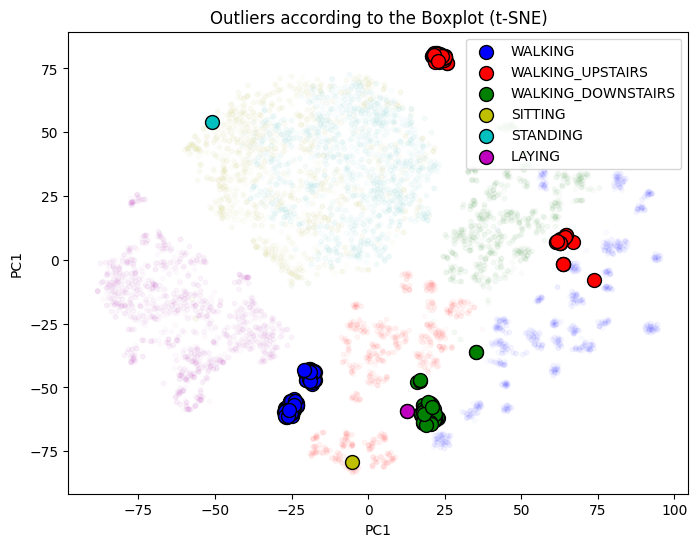

In [145]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][df_train_tsne['label'] == k], X_tsne[:,1][df_train_tsne['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(df_train_tsne.loc[boxplot_idx].values[:,0][df_train_tsne['label'].loc[boxplot_idx] == k], df_train_tsne.loc[boxplot_idx].values[:,1][df_train_tsne['label'].loc[boxplot_idx] == k], edgecolor='k', marker='o', c=v, label = k, s=100)
plt.xlabel('PC1')
plt.ylabel('PC1')
plt.title('Outliers according to the Boxplot (t-SNE)')
plt.legend()

<font size = "4">Density Based: DBSCAN</font>

LAYING:
The point of maximum curvature has a distance of 4.777690670114699
(array([-1,  0,  1,  2]), array([   4, 1332,   34,   37]))

SITTING:
The point of maximum curvature has a distance of 8.305544720970907
(array([-1,  0]), array([   6, 1280]))

STANDING:
The point of maximum curvature has a distance of 5.433424610069183
(array([-1,  0]), array([   5, 1369]))

WALKING:
The point of maximum curvature has a distance of 2.1828987869447922
(array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]), array([12, 55, 74, 95, 28, 29, 24, 54, 30, 54, 26, 46, 48, 26, 28, 65, 27,
       32, 59, 24, 25, 51, 59, 25, 53, 59, 59, 30, 29]))

WALKING_DOWNSTAIRS:
The point of maximum curvature has a distance of 3.5388107435606524
(array([-1,  0,  1,  2,  3,  4]), array([ 14, 826,  12,  58,  45,  31]))

WALKING_UPSTAIRS:
The point of maximum curvature has a distance of 2.9867935587955614
(array([-1,  0,  1,  2,  3,  4,  5,  6,  

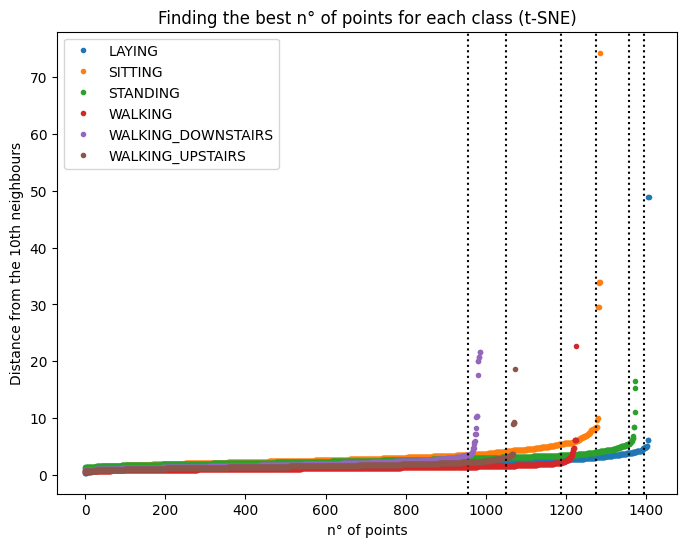

In [146]:
db_outliers = []

plt.figure(figsize=(8, 6))

for targ in label_loop:
    redefined_for_temp_target = df_train_tsne[df_train_tsne['label'] == targ][['PC1', 'PC2']]
    X_tsne = redefined_for_temp_target.values
    
    ####################################
    
    metrica = 'euclidean'
    distanza = squareform(pdist(X_tsne, metrica))

    punti = 10
    kth_distances = []
    for dist in distanza:
        index_kth_dist = np.argsort(dist)[punti]
        kth_distances.append(dist[index_kth_dist])
    
    plt.plot(range(0, len(kth_distances)), sorted(kth_distances), marker='.', linewidth=0, label=targ)
    plt.title('Finding the best n° of points for each class (t-SNE)')
    plt.ylabel('Distance from the {}th neighbours'.format(punti))
    plt.xlabel('n° of points')
    plt.grid()
    
    
    kneedle = KneeLocator(np.arange(0, len(kth_distances)), np.array(sorted(kth_distances)[:]), S=1.0, curve="convex", direction="increasing")
    plt.axvline(kneedle.knee, c='k', ls=':')
    
    #####################################
    
    epsilon = sorted(kth_distances)[kneedle.knee]

    X_dbscan = X_tsne.copy()
    dbscan = DBSCAN(eps=epsilon, min_samples=punti)
    dbscan.fit(X_dbscan)
    
    print('{}:\nThe point of maximum curvature has a distance of {}'.format(targ, epsilon))
    print(np.unique(dbscan.labels_, return_counts=True))
    
    for x in redefined_for_temp_target[dbscan.labels_ == -1].index:
        db_outliers.append(x)
    print()

plt.legend()

print('How many noise points:', len(db_outliers), '\nWhich:', db_outliers)

X_tsne = df_train_tsne[['PC1', 'PC2']].values

,PC1,PC2,label,color
1780,-66.998985,-48.233337,LAYING,m
2295,12.545124,-59.357651,LAYING,m
2711,12.538332,-59.348881,LAYING,m
2723,-67.007271,-48.238220,LAYING,m
4058,-56.377880,-22.981142,SITTING,y
3935,-57.482571,-15.271616,SITTING,y
4323,-57.506359,-15.239157,SITTING,y
2239,-5.409720,-79.232552,SITTING,y
1844,-56.442616,-22.869390,SITTING,y
3531,-56.120434,-23.016821,SITTING,y


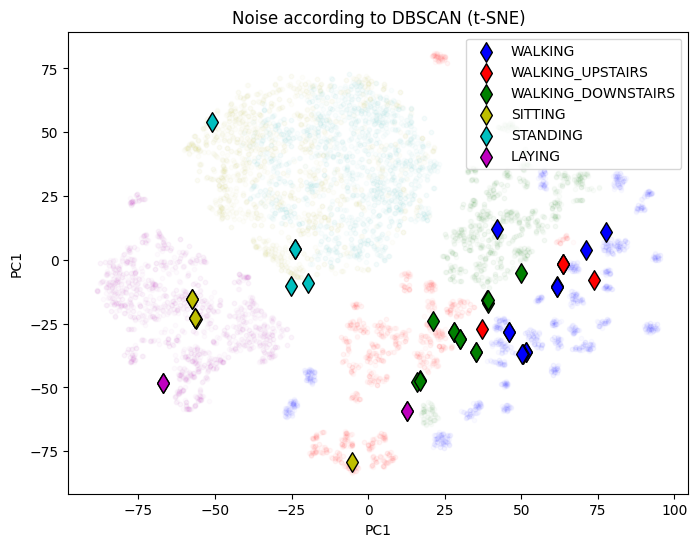

In [147]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][df_train_tsne['label'] == k], X_tsne[:,1][df_train_tsne['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(df_train_tsne.loc[db_outliers].values[:,0][df_train_tsne['label'].loc[db_outliers] == k], df_train_tsne.loc[db_outliers].values[:,1][df_train_tsne['label'].loc[db_outliers] == k], edgecolor='k', marker='d', c=v, label = k, s=100)
plt.xlabel('PC1')
plt.ylabel('PC1')
plt.title('Noise according to DBSCAN (t-SNE)')
plt.legend()

df_dbout_tsne = df_train_tsne.loc[db_outliers].sort_values(by='label')
df_dbout_tsne 

<font size = "4">Density Based: Local Outlier Factor</font>

LAYING
(array([-1,  1]), array([  89, 1318]))
Max value of score array: -0.8389043350252807 
Min value of score array: -11.168118628612262 
Mean value of score array: -1.1345828409796317
Outlier threshold: -2.25
Outlier threshold: -2.25
Indices of the outliers: [ 215  334  384  386  405  423  442  456  460  525  527  577  617  713
  780 1110 1140 1153 1304]
Bins (NOT Sturge): 50


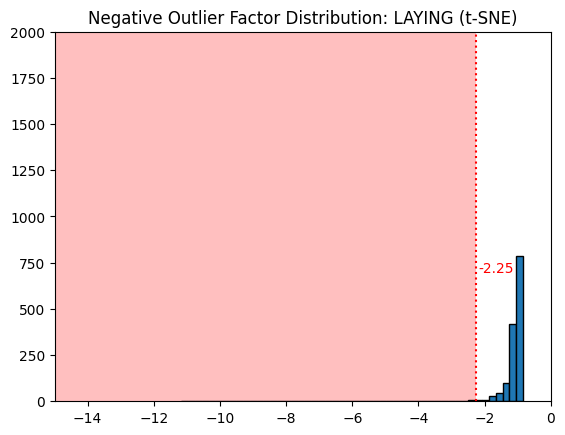

Number of identified outlier with the specified threshold: 19
(array([-1,  1]), array([  19, 1388]))
SITTING
(array([-1,  1]), array([  63, 1223]))
Max value of score array: -0.854480027906104 
Min value of score array: -33.222238920978285 
Mean value of score array: -1.159933198204199
Outlier threshold: -2.25
Outlier threshold: -2.25
Indices of the outliers: [ 222  329  391  569  597  611  638  651  687  689  691  711  729  757
  762  800  814  871  909  914 1035 1164]
Bins (NOT Sturge): 50


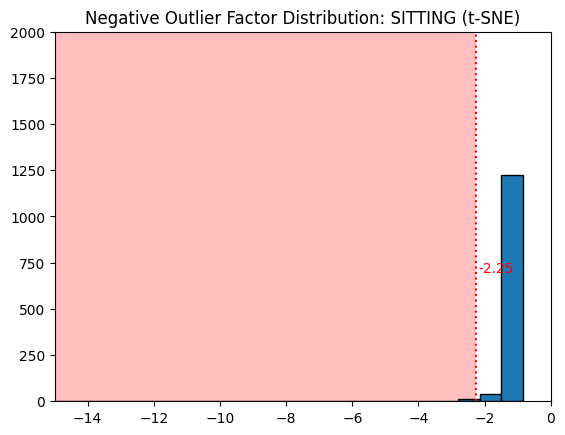

Number of identified outlier with the specified threshold: 22
(array([-1,  1]), array([  22, 1264]))
STANDING
(array([-1,  1]), array([  42, 1332]))
Max value of score array: -0.8434091178463469 
Min value of score array: -3.4703101516574 
Mean value of score array: -1.0791828880445407
Outlier threshold: -2.25
Outlier threshold: -2.25
Indices of the outliers: [233 356 405 523 566 660 675 716 723 859]
Bins (NOT Sturge): 50


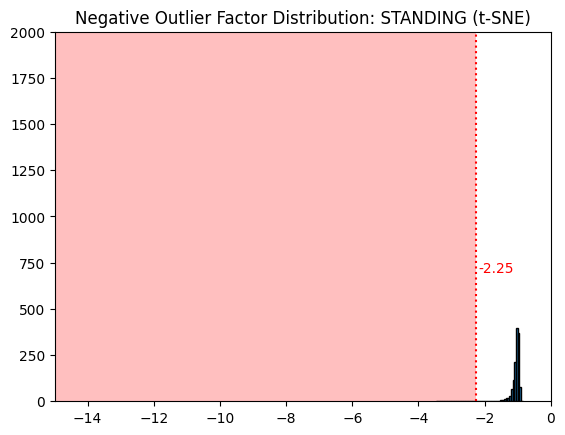

Number of identified outlier with the specified threshold: 10
(array([-1,  1]), array([  10, 1364]))
WALKING
(array([-1,  1]), array([  51, 1175]))
Max value of score array: -0.8867958621566242 
Min value of score array: -22.768833608873464 
Mean value of score array: -1.114462264125508
Outlier threshold: -2.25
Outlier threshold: -2.25
Indices of the outliers: [ 561  568  733  896  915 1038 1141]
Bins (NOT Sturge): 50


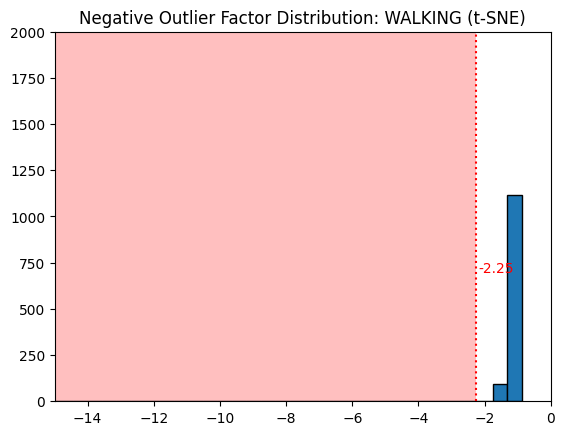

Number of identified outlier with the specified threshold: 7
(array([-1,  1]), array([   7, 1219]))
WALKING_DOWNSTAIRS
(array([-1,  1]), array([ 50, 936]))
Max value of score array: -0.8879363730788203 
Min value of score array: -4.0666601935290965 
Mean value of score array: -1.1048908114579776
Outlier threshold: -2.25
Outlier threshold: -2.25
Indices of the outliers: [137 152 455 754]
Bins (NOT Sturge): 50


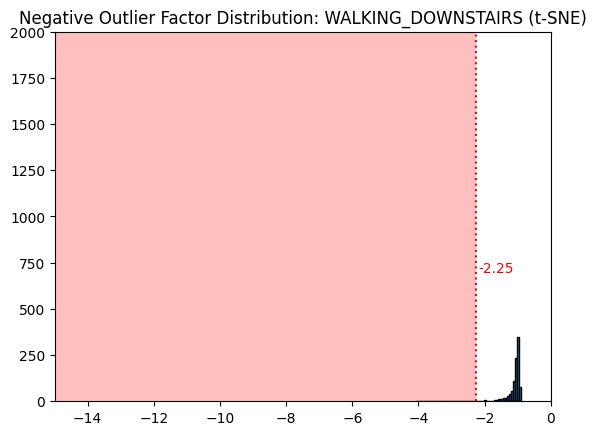

Number of identified outlier with the specified threshold: 4
(array([-1,  1]), array([  4, 982]))
WALKING_UPSTAIRS
(array([-1,  1]), array([  51, 1022]))
Max value of score array: -0.8118996785020945 
Min value of score array: -6.787014416259976 
Mean value of score array: -1.1115942219112624
Outlier threshold: -2.25
Outlier threshold: -2.25
Indices of the outliers: [ 286  312  432  442  464  625  854  973 1045]
Bins (NOT Sturge): 50


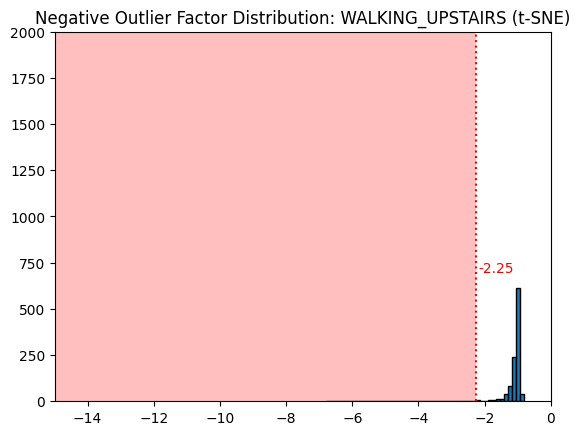

Number of identified outlier with the specified threshold: 9
(array([-1,  1]), array([   9, 1064]))
[215, 334, 384, 386, 405, 423, 442, 456, 460, 525, 527, 577, 617, 713, 780, 1110, 1140, 1153, 1304, 222, 329, 391, 569, 597, 611, 638, 651, 687, 689, 691, 711, 729, 757, 762, 800, 814, 871, 909, 914, 1035, 1164, 233, 356, 405, 523, 566, 660, 675, 716, 723, 859, 561, 568, 733, 896, 915, 1038, 1141, 137, 152, 455, 754, 286, 312, 432, 442, 464, 625, 854, 973, 1045]


In [148]:
lof_outliers = []
idx_for_score = []
lof_score_outliers = []

for targ in label_loop:
    redefined_for_temp_target = df_train_tsne[df_train_tsne['label'] == targ][['PC1','PC2']]
    X_tsne = redefined_for_temp_target.values

    X_lof = X_tsne.copy()
    clf_lof = LocalOutlierFactor(n_neighbors=5)
    outliers_lof = clf_lof.fit_predict(X_lof)
    
    outliers_val_array = clf_lof.negative_outlier_factor_
    outliers_val_array
    
    print(targ)
    print(np.unique(outliers_lof, return_counts=True))
    
    max_lof = np.max(outliers_val_array)
    min_lof = np.min(outliers_val_array)
    mean_lof = np.mean(outliers_val_array)
    print('Max value of score array:', max_lof, '\nMin value of score array:', min_lof, '\nMean value of score array:', mean_lof)
    
    outliers_lof_ind = np.where(outliers_lof==-1)[0] #indeces of the outliers
    outliers_lof_ind
    
    try:
        computed_score = -2.25
        print('Outlier threshold:', computed_score)
    except ValueError:
        #print('EMPTY ARRAY OF OUTLIERS, REDEFINE THRESHOLD') #redefining the threshold
        #computed_score = -1.45 #selected by trial and error
        #outliers_lof = np.array([-1 if x < computed_score else 1 for x in outliers_val_array])
        #outliers_lof_ind = np.where(outliers_lof==-1)[0] #indeces of the outliers
        #print('Outlier threshold:', computed_score)
        print('No outliers found for', targ)
    outliers_lof = np.array([-1 if x < computed_score else 1 for x in outliers_val_array])
    outliers_lof_ind = np.where(outliers_lof==-1)[0] #indeces of the outliers
    print('Outlier threshold:', computed_score)
    print('Indices of the outliers:', outliers_lof_ind)
    
    k_sturge = 50
    print('Bins (NOT Sturge):', k_sturge)
    
    plt.hist(outliers_val_array, bins=k_sturge, edgecolor='k')
    plt.axvline(computed_score, c='r', ls=':')
    plt.text(computed_score+0.05, 700, s=round(computed_score, 2), c='r')
    plt.fill_between((-15, computed_score), 0, 11500, facecolor='red', alpha=0.25)
    plt.ylim(0, 2000)
    plt.xlim(-14.99, 0)
    plt.title("Negative Outlier Factor Distribution: {} (t-SNE)".format(targ))
    plt.show()
    
    print('Number of identified outlier with the specified threshold:', 
          len(outliers_val_array[outliers_val_array <= computed_score])) #values lower than -1.50 tend to be outliers, scikit learn's LOF use this value
    print(np.unique(outliers_lof, return_counts=True))
    
    for x in outliers_lof_ind:
        lof_outliers.append(x)
    for x in redefined_for_temp_target.index:
        idx_for_score.append(x)
    for x in outliers_val_array:
        lof_score_outliers.append(x)
        
print(lof_outliers)

X_tsne = df_train_tsne[['PC1','PC2']].values


In [149]:
lof_score_df = pd.DataFrame([(idx, score) for idx, score in zip(idx_for_score, lof_score_outliers)]).sort_values(by=0).reset_index(drop=True)
lof_score_df.columns = ['index', 'scores']
lof_score_df

,index,scores
0,0,-0.982431
1,1,-1.093766
2,2,-1.396196
3,3,-1.063412
4,4,-0.956253
...,...,...
7347,7347,-0.974164
7348,7348,-1.042874
7349,7349,-0.919187
7350,7350,-1.079991


In [150]:
computed_score = -2.25
outliers_val_array = lof_score_df['scores'].values
print('Number of identified outlier with the {} threshold:'.format(computed_score), 
            len(outliers_val_array[outliers_val_array <= computed_score]), 'on', len(outliers_val_array)) #values lower than -1.50 tend to be outliers, LOF use this value

Number of identified outlier with the -2.25 threshold: 71 on 7352


In [151]:
max_lof = np.max(outliers_val_array)
min_lof = np.min(outliers_val_array)
mean_lof = np.mean(outliers_val_array)
print('Max value of score array:', max_lof, '\nMin value of score array:', min_lof, '\nMean value of score array:', mean_lof)

Max value of score array: -0.8118996785020945 
Min value of score array: -33.222238920978285 
Mean value of score array: -1.1179710438449897


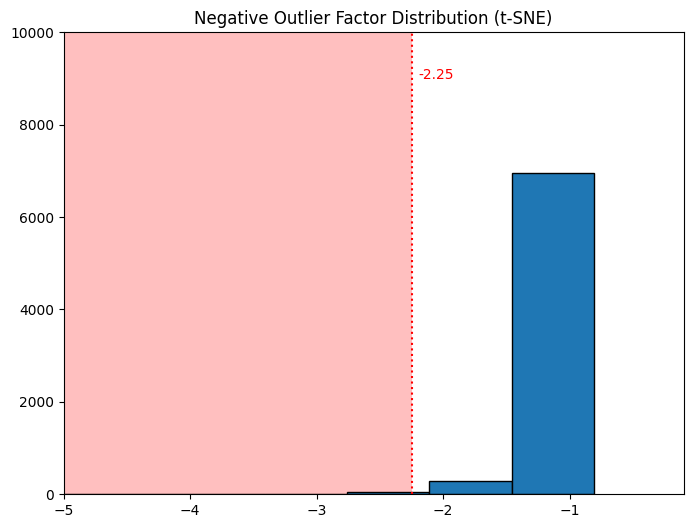

In [152]:
k_sturge = 50
plt.figure(figsize=(8, 6))

plt.hist(outliers_val_array, bins=k_sturge, edgecolor='k')
plt.axvline(computed_score, c='r', ls=':')
plt.text(computed_score+0.05, 9000, s=round(computed_score, 2), c='r')
plt.fill_between((-6, computed_score), 0, 11000, facecolor='red', alpha=0.25)
plt.xlim(-5, -0.1)
plt.ylim(0, 10000)
plt.title("Negative Outlier Factor Distribution (t-SNE)")
plt.show()

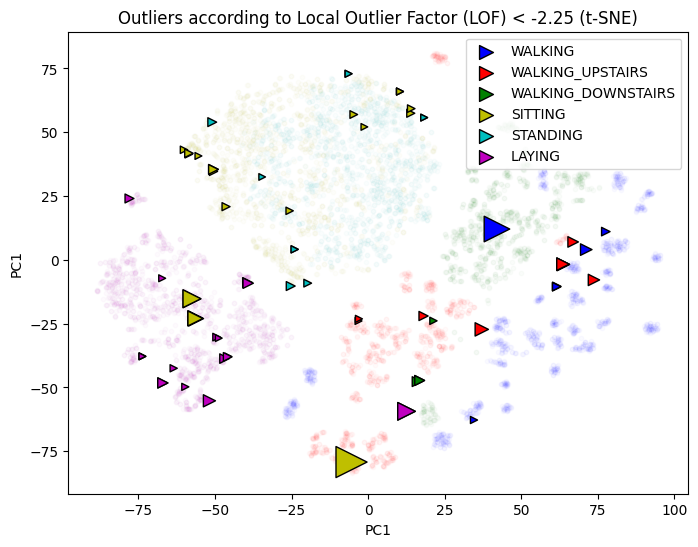

,PC1,PC2,label,color
2295,12.545124,-59.357651,LAYING,m
2711,12.538332,-59.348881,LAYING,m
2401,-39.344791,-8.896239,LAYING,m
2380,-51.789478,-55.231293,LAYING,m
4079,-46.876347,-38.691887,LAYING,m
...,...,...,...,...
3115,63.759323,-1.815946,WALKING_UPSTAIRS,r
2259,18.101171,-22.001633,WALKING_UPSTAIRS,r
6671,37.108147,-27.252272,WALKING_UPSTAIRS,r
2102,63.612423,-1.733728,WALKING_UPSTAIRS,r


In [153]:
outliers_lof = np.array([-1 if x < computed_score else 1 for x in outliers_val_array])
outliers_lof_ind = np.where(outliers_lof==-1)[0] #indeces of the outliers

plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][df_train_tsne['label'] == k], X_tsne[:,1][df_train_tsne['label'] == k], c=v, alpha=0.02, s=10)

radius = ((max_lof - outliers_val_array) / (max_lof - min_lof))[outliers_lof_ind] #setting the radius of the outlier score by normalizing

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][outliers_lof_ind][df_train_tsne['label'].loc[outliers_lof_ind] == k], 
                X_tsne[:,1][outliers_lof_ind][df_train_tsne['label'].loc[outliers_lof_ind] == k], 
                edgecolor='k', marker='>', c=v, label = k, 
                s=500*(radius[df_train_tsne['label'].loc[outliers_lof_ind] == k]))
    
plt.title("Outliers according to Local Outlier Factor (LOF) < {} (t-SNE)".format(round(computed_score, 2)))
legend = plt.legend()
for x in range(6):
    legend.legendHandles[x]._sizes = [100]
plt.xlabel('PC1')
plt.ylabel('PC1')
plt.show()

df_lofout_tsne = df_train_tsne.loc[outliers_lof_ind].sort_values(by='label')
df_lofout_tsne

In [154]:
print('12-Feat', len(df_lofout))
print('TSNE', len(df_lofout_tsne))
lof_common = set(df_lofout.index) & set(df_lofout_tsne.index)
print('Common Found:', len(lof_common))
lof_common

12-Feat 164
TSNE 71
Common Found: 11


{1844, 2175, 2239, 3585, 3685, 3715, 4323, 4472, 5536, 6671, 7195}

<font size = "4">Depth Based: Convex Hull</font>

In [155]:
vertices_idx = []
for targ in label_loop:
    tsne_temp = df_train_tsne[df_train_tsne['label']==targ][['PC1', 'PC2']]
    idx_original = tsne_temp.index
    tsne_val = tsne_temp.values
    hull = ConvexHull(tsne_temp)
    
    correct_idx_hull = idx_original[hull.vertices]
    
    for simplex in correct_idx_hull:
        vertices_idx.append(simplex)

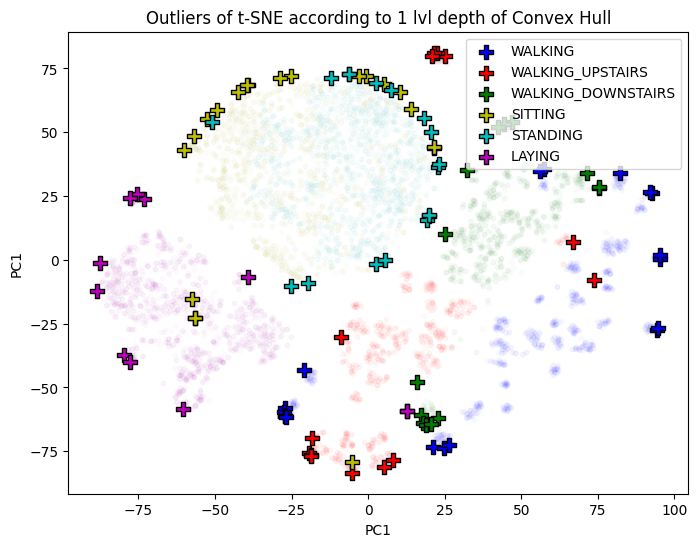

,PC1,PC2,label,color
271,22.694689,-61.792839,WALKING_DOWNSTAIRS,g
292,19.741606,17.548094,STANDING,c
474,18.953936,-64.646065,WALKING_DOWNSTAIRS,g
591,-5.138405,-83.412308,WALKING_UPSTAIRS,r
624,26.395721,-72.622551,WALKING,b
...,...,...,...,...
6936,95.213875,1.948399,WALKING,b
7114,20.523096,-64.176239,WALKING_DOWNSTAIRS,g
7148,-26.780029,-61.542336,WALKING,b
7199,21.469709,44.127419,SITTING,y


In [156]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][rdf_train['label'] == k], X_tsne[:,1][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(df_train_tsne.loc[vertices_idx].values[:,0][df_train_tsne['label'].loc[vertices_idx] == k], df_train_tsne.loc[vertices_idx].values[:,1][df_train_tsne['label'].loc[vertices_idx] == k], edgecolor='k', marker='P', c=v, label = k, s=100)

plt.title('Outliers of t-SNE according to 1 lvl depth of Convex Hull')
plt.xlabel('PC1')
plt.ylabel('PC1')
plt.legend()
plt.show()

df_hullout_tsne = df_train_tsne.loc[vertices_idx].sort_index()
df_hullout_tsne

In [157]:
print('12-Feat', len(df_highdim_hullout))
print('TSNE', len(df_hullout_tsne))
hull_common = set(df_highdim_hullout.index) & set(df_hullout_tsne.index)
print('Common Found:', len(hull_common))
hull_common

12-Feat 3347
TSNE 94
Common Found: 55


{271,
 474,
 591,
 624,
 685,
 834,
 863,
 954,
 1285,
 1542,
 1844,
 2007,
 2024,
 2081,
 2118,
 2175,
 2234,
 2239,
 2279,
 2295,
 2389,
 2523,
 2604,
 2632,
 2668,
 2711,
 2770,
 3276,
 3554,
 3585,
 3735,
 3789,
 4048,
 4173,
 4285,
 4323,
 4348,
 4364,
 4597,
 4742,
 4929,
 4991,
 5118,
 5191,
 5607,
 5665,
 5736,
 5894,
 5961,
 6347,
 6806,
 6936,
 7114,
 7199,
 7291}

<font size = "4">Silhouette Score</font>

In [158]:
silhouette_avg = silhouette_score(X_tsne, labels_train[0])
silhouette_smp = silhouette_samples(X_tsne, labels_train[0])
print('Average Silhouette Score:', silhouette_avg)

Average Silhouette Score: 0.24075948


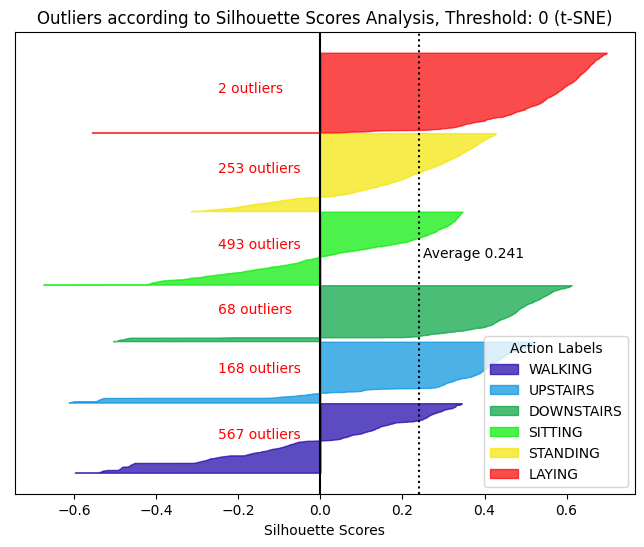

In [159]:
plt.figure(figsize=(8, 6))
y_lower = 10

threshold_silhouette = 0

outliers_by_silhouette = []
for x in silhouette_smp:
    if x < threshold_silhouette:
        outliers_by_silhouette.append(-1)
    else:
        outliers_by_silhouette.append(1)
        
outliers_by_silhouette = np.array(outliers_by_silhouette)
silout_df = rdf_train[outliers_by_silhouette == -1]

label_origin_silout = labels_train[outliers_by_silhouette == -1]

conta_out_sil = np.unique(label_origin_silout, return_counts=True)

for i in range(1, len(np.unique(labels))+1):
    ith_cluster_silhouette_values = silhouette_smp[labels_train[0] == i]

    ith_cluster_silhouette_values.sort()
    outlier_sil = len(ith_cluster_silhouette_values[ith_cluster_silhouette_values < 0])

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    
    if threshold_silhouette != 0:
        plt.text(-0.25, y_lower + 0.5 * size_cluster_i, s='{} negatives'.format(outlier_sil), c='k')
    y_upper = y_lower + size_cluster_i
    
    try:
        pos_outs = np.where(conta_out_sil[0]==i)[0][0]
        plt.text(threshold_silhouette-0.25, y_lower + 0.5 * size_cluster_i, s='{} outliers'.format(conta_out_sil[1][pos_outs]), c='r')
    except:
        pos_of_outliers = -1

    color = cm.nipy_spectral(float(i) / (len(np.unique(labels))+1)) #+1 to adjust the color to the right length
    action_lab = remap_dict[i][remap_dict[i].find('_')+1:] #so that if it is -1 it starts from 0, if not it starts after '_'
    
    plt.fill_betweenx(np.arange(y_lower, y_upper), 0,
        ith_cluster_silhouette_values,
        facecolor=color, edgecolor=color, alpha=0.7, label=action_lab)
    
    y_lower = y_upper + 10  # 10 for the 0 samples
    
plt.axvline(silhouette_avg, c='k', ls=':')
plt.text(silhouette_avg+0.01, 3800, s='Average {:.3f}'.format(silhouette_avg), c='k')

if threshold_silhouette != 0:
    thr_line_color = 'r'
else:
    thr_line_color = 'k'
    
plt.axvline(threshold_silhouette, c=thr_line_color, ls='-')

plt.yticks([])
plt.xlabel('Silhouette Scores')
plt.title('Outliers according to Silhouette Scores Analysis, Threshold: {} (t-SNE)'.format(round(threshold_silhouette, 3)))
plt.legend(loc='lower right', title='Action Labels')
plt.show()

In [160]:
df_silout_tsne = df_train_tsne.loc[np.where(silhouette_smp<=threshold_silhouette)[0]]
df_silout_tsne

,PC1,PC2,label,color
5,24.167839,-69.327248,WALKING,b
7,77.796043,7.520390,WALKING,b
8,20.162647,-56.183506,WALKING_DOWNSTAIRS,g
9,-27.668901,55.155510,STANDING,c
12,23.508610,80.596756,WALKING_UPSTAIRS,r
...,...,...,...,...
7345,18.730789,41.441864,SITTING,y
7347,23.639996,-68.529739,WALKING,b
7348,18.860483,-64.487137,WALKING_DOWNSTAIRS,g
7349,24.142113,-71.501617,WALKING,b


In [161]:
print('12-Feat', len(df_silout))
print('TSNE', len(df_silout_tsne))
sil_common = set(df_silout.index) & set(df_silout_tsne.index)
print('Common Found:', len(sil_common))
sil_common

12-Feat 1083
TSNE 1551
Common Found: 583


{8,
 37,
 52,
 54,
 58,
 65,
 72,
 90,
 93,
 113,
 129,
 130,
 133,
 137,
 145,
 165,
 167,
 172,
 217,
 218,
 241,
 244,
 261,
 271,
 282,
 312,
 314,
 321,
 351,
 412,
 418,
 422,
 426,
 430,
 433,
 438,
 472,
 474,
 478,
 504,
 520,
 532,
 546,
 561,
 579,
 586,
 596,
 619,
 623,
 634,
 638,
 646,
 654,
 656,
 661,
 680,
 697,
 704,
 710,
 732,
 744,
 752,
 771,
 789,
 833,
 896,
 913,
 928,
 930,
 949,
 965,
 988,
 996,
 1044,
 1045,
 1047,
 1077,
 1085,
 1088,
 1090,
 1091,
 1092,
 1094,
 1100,
 1106,
 1116,
 1134,
 1167,
 1213,
 1215,
 1220,
 1221,
 1233,
 1234,
 1245,
 1254,
 1294,
 1298,
 1306,
 1314,
 1326,
 1334,
 1347,
 1349,
 1363,
 1366,
 1377,
 1381,
 1392,
 1410,
 1417,
 1425,
 1431,
 1435,
 1458,
 1469,
 1477,
 1483,
 1492,
 1500,
 1509,
 1524,
 1565,
 1574,
 1585,
 1587,
 1618,
 1667,
 1679,
 1684,
 1685,
 1687,
 1699,
 1720,
 1724,
 1740,
 1742,
 1743,
 1748,
 1750,
 1752,
 1760,
 1763,
 1794,
 1798,
 1800,
 1801,
 1817,
 1826,
 1832,
 1857,
 1859,
 1869,
 1885,
 1900

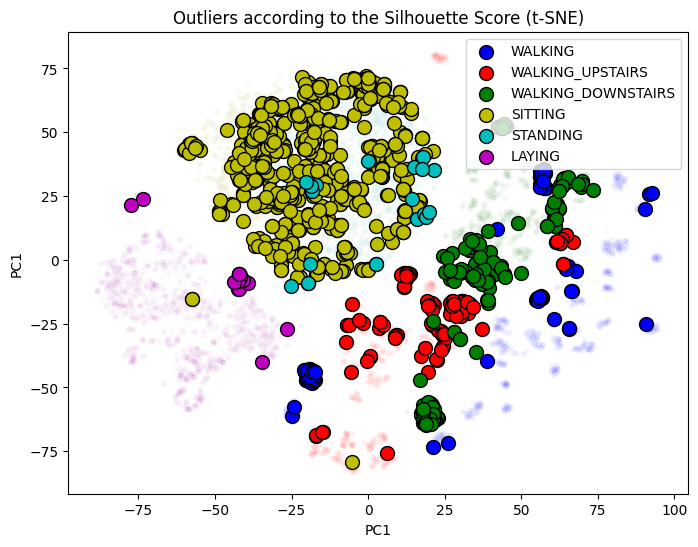

In [162]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][rdf_train['label'] == k], X_tsne[:,1][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(df_train_tsne.loc[df_silout.index].values[:,0][df_train_tsne['label'].loc[df_silout.index] == k], df_train_tsne.loc[df_silout.index].values[:,1][df_train_tsne['label'].loc[df_silout.index] == k], edgecolor='k', marker='o', c=v, label = k, s=100)

plt.title('Outliers according to the Silhouette Score (t-SNE)')
plt.xlabel('PC1')
plt.ylabel('PC1')
plt.legend()
plt.show()

<font size = "4">Angle Based: ABOD</font>

In [163]:
clf = ABOD()
clf.fit(X_tsne)
clf.decision_scores_

array([  -3.2681592 ,  -13.96612572,   -8.88291433, ...,   -9.28346259,
         -3.68783345, -147.55213174])

In [164]:
outliers = clf.predict(X_tsne)
np.unique(outliers, return_counts=True)

(array([0, 1]), array([6615,  737]))

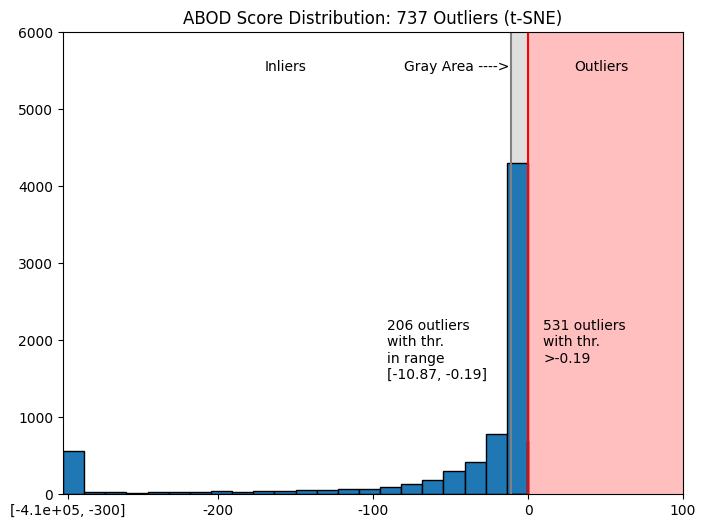

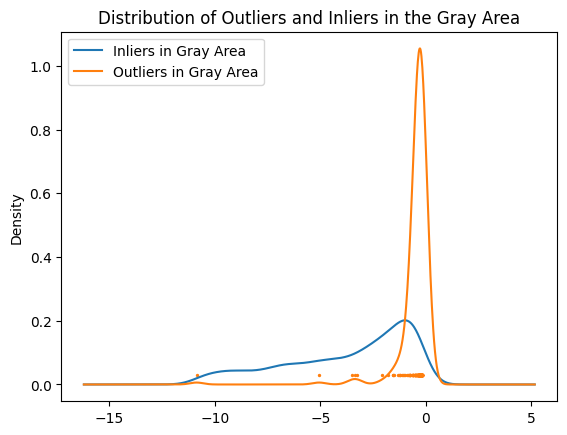

,PC1,PC2,label,color
3,-49.973606,23.391386,SITTING,y
7,77.796043,7.520390,WALKING,b
36,-67.967583,4.364026,LAYING,m
40,-58.891590,-15.638068,LAYING,m
78,-44.095772,17.006561,SITTING,y
...,...,...,...,...
7323,14.257987,40.660370,STANDING,c
7329,-15.005676,-73.526978,WALKING_UPSTAIRS,r
7331,9.965906,21.803568,STANDING,c
7343,15.659640,31.954315,STANDING,c


In [165]:
group = -300
minstd_threshold = np.min(clf.decision_scores_[np.where(outliers == 1)])
maxstd_threshold = np.max(clf.decision_scores_[np.where(outliers == 0)])

outliers_frommin_tomax = len(clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] <= maxstd_threshold])
outliers_frommax = len(clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] > maxstd_threshold])

abod_num_outliers = len(clf.decision_scores_[np.where(outliers==1)])

plt.figure(figsize=(8, 6))
plt.hist([x if (x >= group) else (group) for x in clf.decision_scores_], edgecolor='k', bins=22)
plt.hist(clf.decision_scores_[np.where(outliers == 1)], edgecolor='k', bins=22)
plt.axvline(minstd_threshold, c='gray')
plt.axvline(maxstd_threshold, c='red')
plt.text(minstd_threshold-80, 1500, s='{} outliers \nwith thr.\nin range\n[{}, {}]'.format(outliers_frommin_tomax, round(minstd_threshold,2), round(maxstd_threshold,2)), c='k')
plt.text(maxstd_threshold+10, 1500, s='{} outliers \nwith thr.\n>{}\n'.format(outliers_frommax, round(maxstd_threshold,2)), c='k')


plt.text(-170, 5500, s='Inliers', c='k')
plt.text(-80, 5500, s='Gray Area ---->', c='k')
plt.text(30, 5500, s='Outliers', c='k')

plt.fill_between((minstd_threshold, maxstd_threshold), 0, 10000, facecolor='gray', alpha=0.25)
plt.fill_between((maxstd_threshold, 200), 0, 10000, facecolor='red', alpha=0.25)

plt.xlim(group, 100)
plt.ylim(0, 6000)
plt.title('ABOD Score Distribution: {} Outliers (t-SNE)'.format(abod_num_outliers))
plt.xticks([-297]+list(np.arange(-200, 200, 100)), ['[{:.1e}, -300]'.format(round(np.min(clf.decision_scores_[np.where(outliers == 0)]),0))]+list(np.arange(-200, 200, 100)))
plt.show()

plt.scatter([],[])
plt.scatter(clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] <= maxstd_threshold],
           [0.03 for _ in clf.decision_scores_[np.where(outliers == 1)][clf.decision_scores_[np.where(outliers == 1)] <= maxstd_threshold]], s=2)
pd.Series(clf.decision_scores_[np.where(outliers == 0)][clf.decision_scores_[np.where(outliers == 0)] > minstd_threshold]).plot(kind='kde', label='Inliers in Gray Area')
pd.Series(clf.decision_scores_[np.where(outliers == 1 & (clf.decision_scores_ <= maxstd_threshold))]).plot(kind='kde', label='Outliers in Gray Area')
plt.title('Distribution of Outliers and Inliers in the Gray Area')
plt.legend()
plt.show()

df_abodout_tsne = df_train_tsne.loc[np.where(outliers == 1)]
df_abodout_tsne

In [166]:
#by focusing on the following threshold I can get for certain only outliers, excluding thus the gray area:
maxstd_threshold

-0.18535165195884207

In [167]:
print('12-Feat', len(df_abodout))
print('TSNE', len(df_abodout_tsne))
abod_common = set(df_abodout.index) & set(df_abodout_tsne.index)
print('Common Found:', len(abod_common))
abod_common

12-Feat 824
TSNE 737
Common Found: 62


{140,
 206,
 296,
 483,
 548,
 597,
 954,
 1002,
 1155,
 1156,
 1196,
 1274,
 1313,
 1325,
 1477,
 1587,
 2239,
 2259,
 2365,
 2389,
 2632,
 2697,
 2717,
 2803,
 2852,
 2870,
 2906,
 2958,
 3356,
 3425,
 3428,
 3446,
 3506,
 3539,
 3554,
 3715,
 3946,
 4028,
 4105,
 4260,
 4301,
 4495,
 4868,
 5044,
 5254,
 5455,
 5536,
 5548,
 5659,
 5787,
 5894,
 6011,
 6093,
 6206,
 6243,
 6533,
 6671,
 6745,
 6796,
 6848,
 7162,
 7329}

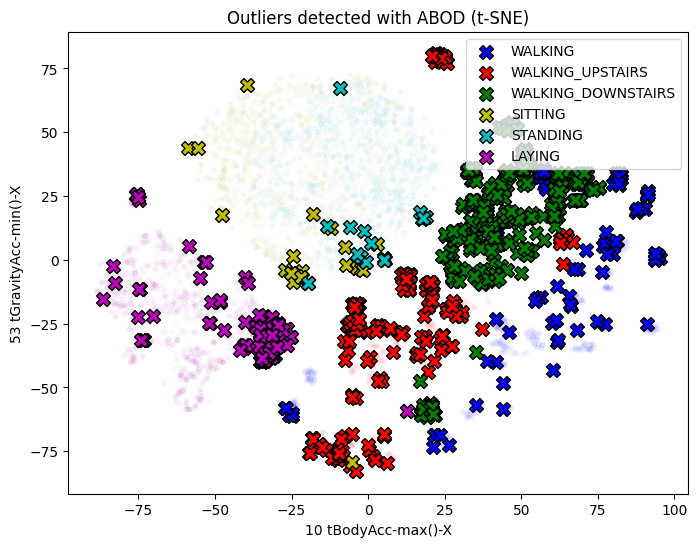

In [168]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][rdf_train['label'] == k], X_tsne[:,1][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(df_train_tsne.loc[df_abodout.index].values[:,0][df_train_tsne['label'].loc[df_abodout.index] == k], df_train_tsne.loc[df_abodout.index].values[:,1][df_train_tsne['label'].loc[df_abodout.index] == k], edgecolor='k', marker='X', c=v, label = k, s=100)

plt.title('Outliers detected with ABOD (t-SNE)')
plt.xlabel(features_to_keep[0])
plt.ylabel(features_to_keep[2])
plt.legend()
plt.show()

<font size = "4">Comparing the results for each methods</font>

In [169]:
indexes_to_check_tsne = set(list(df_bpout_tsne.index)+list(df_dbout_tsne.index)+list(df_lofout_tsne.index)+list(df_hullout_tsne.index)+list(df_silout_tsne.index)+list(df_abodout_tsne.index))
len(indexes_to_check_tsne)

2204

In [170]:
common_out_idx_tsne = set(df_bpout_tsne.index) & set(df_dbout_tsne.index) & set(df_lofout_tsne.index) & set(df_hullout_tsne.index) & set(df_silout_tsne.index) & set(df_abodout_tsne.index)
common_out_idx_tsne

{2239, 3276, 3289}

In [171]:
df_train_tsne.loc[common_out_idx_tsne]

,PC1,PC2,label,color
3289,16.000954,-47.715073,WALKING_DOWNSTAIRS,g
3276,73.718246,-7.872722,WALKING_UPSTAIRS,r
2239,-5.409720,-79.232552,SITTING,y


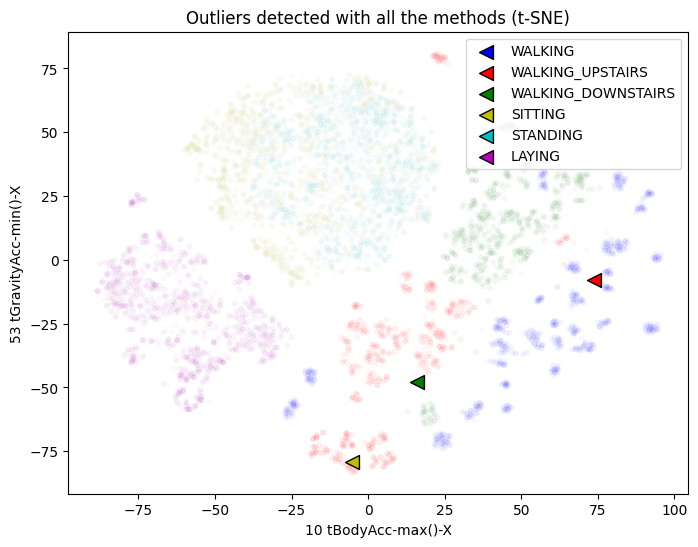

In [172]:
plt.figure(figsize=(8, 6))

for k, v in mapping_color.items():
    plt.scatter(X_tsne[:,0][rdf_train['label'] == k], X_tsne[:,1][rdf_train['label'] == k], c=v, alpha=0.02, s=10)
for k, v in mapping_color.items():
    plt.scatter(df_train_tsne.loc[common_out_idx_tsne].values[:,0][df_train_tsne['label'].loc[common_out_idx_tsne] == k], df_train_tsne.loc[common_out_idx_tsne].values[:,1][df_train_tsne['label'].loc[common_out_idx_tsne] == k], edgecolor='k', marker='<', c=v, label = k, s=100)

plt.title('Outliers detected with all the methods (t-SNE)')
plt.xlabel(features_to_keep[0])
plt.ylabel(features_to_keep[2])
plt.legend()
plt.show()

In [173]:
common_out_idx

{2175, 2239, 2389, 3309}

In [174]:
set(df_lofout.index) & set(df_highdim_hullout.index) & set(df_lofout_tsne.index) & set(df_hullout_tsne.index)

{1844, 2175, 2239, 3585, 4323}